In [1]:
from transformers import T5Tokenizer, T5ForConditionalGeneration
from transformers import MT5ForConditionalGeneration, AutoTokenizer
from nltk.translate.bleu_score import sentence_bleu
from nltk.translate.meteor_score import meteor_score
from datasets import load_dataset
from evaluate import load
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM
from rouge_score import rouge_scorer
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
from tqdm import tqdm 
from scipy.stats import kurtosis
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import hmean
from scipy.stats import gmean
from evaluate import load
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

import pickle
import matplotlib.pyplot as plt 
import evaluate
import torch
import time
import nltk
import numpy as np
import torch.nn.functional as F

nltk.download('wordnet')
bertscore = load("bertscore")

/Users/jinhyunpark/miniconda3/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/jinhyunpark/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


### Define metrics

In [2]:
# jhpark: verified that this is a correct way to use this 
def calculate_rouge(true_sentence, predicted_sentence):
    # jhpark: rouge1/rouge2 (e.g. rouge1, rouge2): n-gram based scoring.
    # jhpark: rougeL: Longest common subsequence based scoring.
    scorer = rouge_scorer.RougeScorer(['rouge1', 'rouge2', 'rougeL'], use_stemmer=True)
    scores = scorer.score(true_sentence, predicted_sentence)
    return scores

In [3]:
# jhpark: verified that this is a correct way to use this 
def calculate_bleu(true_tokens, predicted_tokens):
    '''
    * reference for smoothing: A Systematic Comparison of Smoothing Techniques for Sentence-Level BLEU, Boxing Chen and Collin Cherry (2014)
    * method1: Smoothing method 1: Add *epsilon* counts to precision with 0 counts.
    * https://www.nltk.org/_modules/nltk/translate/bleu_score.html for more details
    '''
    bleu_score = sentence_bleu(true_tokens, predicted_tokens, smoothing_function=SmoothingFunction().method1)
    return bleu_score

### Datasets

In [4]:
# english to X is only possible for T5
from datasets import load_dataset, load_from_disk

# ds_de_en = load_dataset("wmt/wmt14", "de-en")
# ds_fr_en = load_dataset("wmt/wmt15", "fr-en")
# ds_ro_en = load_dataset("wmt/wmt16", "ro-en")

# ds_de_en.save_to_disk("../wmt14_de_en")
# ds_fr_en.save_to_disk("../wmt15_fr_en")
# ds_ro_en.save_to_disk("../wmt16_ro_en")

ds_de_en = load_from_disk("../../wmt14_de_en")
ds_fr_en = load_from_disk("../../wmt15_fr_en")
ds_ro_en = load_from_disk("../../wmt16_ro_en")

### Models

In [5]:
t5_tokenizer_small = AutoTokenizer.from_pretrained('t5-small')
t5_model_small = AutoModelForSeq2SeqLM.from_pretrained('t5-small')
print("Done with small")

# t5_tokenizer_base = AutoTokenizer.from_pretrained('t5-base')
# t5_model_base = AutoModelForSeq2SeqLM.from_pretrained('t5-base')
# print("Done with base")

Done with small


### Init

In [6]:
def calculate_probs_from_logits(logits):
    return F.softmax(logits, dim=-1)

def generate_output_with_probs(model, tokenizer, example, top_k=5):
    '''
    - High Kurtosis: An indicator that the data has heavy tails or outliers.
    - Low Kurtosis:  An indicator that the data has thin tails and lacks outliers.
    '''
    inputs = tokenizer.encode(example, return_tensors="pt")
    output_ids = model.generate(inputs, max_new_tokens=np.inf, return_dict_in_generate=True, output_scores=True, return_legacy_cache=False)
    output_tokens = output_ids.sequences[0]
    output_probs = []
    output_kurtosis = []

    # Retrieve probabilities for each token
    for i in range(1, len(output_tokens) - 1):  # Skip the first token and the last token
        # Fetch the logits from output_ids.scores, aligning with output_tokens[1:]
        probs = calculate_probs_from_logits(output_ids.scores[i - 1])[0]  # i-1 to align with `scores` index
        token_id = output_tokens[i]
        token_prob = probs[token_id].item()

        # Compute kurtosis on top probabilities
        top_probs, _ = torch.topk(probs, 1000)
        kurt = kurtosis(top_probs)

        output_probs.append(token_prob)
        output_kurtosis.append(kurt)
    
    decoded_output = tokenizer.decode(output_tokens, skip_special_tokens=True)
    return decoded_output, np.array(output_probs), np.array(output_kurtosis)

def visualization_1(token_probs, scaled_token_kurtosis):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    ax1.plot(np.arange(0, len(token_probs)), token_probs, label='Token probability', c='red', marker='o', alpha=0.5)
    ax1.plot(np.arange(0, len(token_probs)), scaled_token_kurtosis, label='Token kurtosis', c='blue', marker='^', alpha=0.5)
    ax1.set_xlabel('# of tokens')
    ax1.set_ylabel('Token probability and Scaled token kurtosis')
    ax1.legend()

    model = LinearRegression()
    model.fit(token_probs.reshape(-1, 1), scaled_token_kurtosis)
    predictions = model.predict(token_probs.reshape(-1, 1))
    r2 = r2_score(scaled_token_kurtosis, predictions)
    ax2.scatter(token_probs, scaled_token_kurtosis, color='blue', alpha=0.3)
    ax2.plot(token_probs, predictions, color='red', label=f'Regression Line (R² = {r2:.2f})')
    ax2.set_xlabel('Token probability')
    ax2.set_ylabel('Scaled token kurtosis')
    ax2.legend()
    plt.show()

def visualization_2(score_collector_en_X):   
    # bleu
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 3))
    ax1.scatter(score_collector_en_X['bleu'], score_collector_en_X['Confidence-G-T'], alpha=0.25, c='red')
    ax2.scatter(score_collector_en_X['bleu'], score_collector_en_X['Confidence-A-T'], alpha=0.25, c='green')
    ax3.scatter(score_collector_en_X['bleu'], score_collector_en_X['Confidence-A-K'], alpha=0.25, c='blue')
    ax1.set_ylabel('Confidence-G-T')
    ax2.set_ylabel('Confidence-A-T')
    ax3.set_ylabel('Confidence-A-K')
    ax1.set_xlabel('bleu')
    ax2.set_xlabel('bleu')
    ax3.set_xlabel('bleu')
    plt.plot()

    # meteor
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 3))
    ax1.scatter(score_collector_en_X['meteor'], score_collector_en_X['Confidence-G-T'], alpha=0.25, c='red')
    ax2.scatter(score_collector_en_X['meteor'], score_collector_en_X['Confidence-A-T'], alpha=0.25, c='green')
    ax3.scatter(score_collector_en_X['meteor'], score_collector_en_X['Confidence-A-K'], alpha=0.25, c='blue')
    ax1.set_ylabel('Confidence-G-T')
    ax2.set_ylabel('Confidence-A-T')
    ax3.set_ylabel('Confidence-A-K')
    ax1.set_xlabel('meteor')
    ax2.set_xlabel('meteor')
    ax3.set_xlabel('meteor')
    plt.plot()

    # bert_f1s
    bert_f1s = []
    for i in range(samples):
        bert_f1 = score_collector_en_X['bert'][i]['f1']
        bert_f1s.append(bert_f1)
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 3))
    ax1.scatter(bert_f1s, score_collector_en_X['Confidence-G-T'], alpha=0.25, c='red')
    ax2.scatter(bert_f1s, score_collector_en_X['Confidence-A-T'], alpha=0.25, c='green')
    ax3.scatter(bert_f1s, score_collector_en_X['Confidence-A-K'], alpha=0.25, c='blue')
    ax1.set_ylabel('Confidence-G-T')
    ax2.set_ylabel('Confidence-A-T')
    ax3.set_ylabel('Confidence-A-K')
    ax1.set_xlabel('bert_f1s')
    ax2.set_xlabel('bert_f1s')
    ax3.set_xlabel('bert_f1s')
    plt.plot()

    # rouge_1s 
    rouge_1s = []
    for i in range(samples):
        rouge_1 = score_collector_en_X['rouge'][i]['rouge1'].fmeasure
        rouge_1s.append(rouge_1)
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 3))
    ax1.scatter(rouge_1s, score_collector_en_X['Confidence-G-T'], alpha=0.25, c='red')
    ax2.scatter(rouge_1s, score_collector_en_X['Confidence-A-T'], alpha=0.25, c='green')
    ax3.scatter(rouge_1s, score_collector_en_X['Confidence-A-K'], alpha=0.25, c='blue')
    ax1.set_ylabel('Confidence-G-T')
    ax2.set_ylabel('Confidence-A-T')
    ax3.set_ylabel('Confidence-A-K')
    ax1.set_xlabel('rouge_1s')
    ax2.set_xlabel('rouge_1s')
    ax3.set_xlabel('rouge_1s')
    plt.plot()

    # rouge_2s
    rouge_2s = []
    for i in range(samples):
        rouge_2 = score_collector_en_X['rouge'][i]['rouge2'].fmeasure
        rouge_2s.append(rouge_2)
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 3))
    ax1.scatter(rouge_2s, score_collector_en_X['Confidence-G-T'], alpha=0.25, c='red')
    ax2.scatter(rouge_2s, score_collector_en_X['Confidence-A-T'], alpha=0.25, c='green')
    ax3.scatter(rouge_2s, score_collector_en_X['Confidence-A-K'], alpha=0.25, c='blue')
    ax1.set_ylabel('Confidence-G-T')
    ax2.set_ylabel('Confidence-A-T')
    ax3.set_ylabel('Confidence-A-K')
    ax1.set_xlabel('rouge_2s')
    ax2.set_xlabel('rouge_2s')
    ax3.set_xlabel('rouge_2s')
    plt.plot()

    # rouge_Ls
    rouge_Ls = []
    for i in range(samples):
        rouge_L = score_collector_en_X['rouge'][i]['rougeL'].fmeasure
        rouge_Ls.append(rouge_L)
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 3))
    ax1.scatter(rouge_Ls, score_collector_en_X['Confidence-G-T'], alpha=0.25, c='red')
    ax2.scatter(rouge_Ls, score_collector_en_X['Confidence-A-T'], alpha=0.25, c='green')
    ax3.scatter(rouge_Ls, score_collector_en_X['Confidence-A-K'], alpha=0.25, c='blue')
    ax1.set_ylabel('Confidence-G-T')
    ax2.set_ylabel('Confidence-A-T')
    ax3.set_ylabel('Confidence-A-K')
    ax1.set_xlabel('rouge_Ls')
    ax2.set_xlabel('rouge_Ls')
    ax3.set_xlabel('rouge_Ls')
    plt.plot()

score_collector_en_de = {'bleu':[], 'meteor':[], 'rouge':[], 'bert':[], 'Confidence-G-T':[], 'Confidence-A-T':[], 'Confidence-A-K':[]}
score_collector_en_fr = {'bleu':[], 'meteor':[], 'rouge':[], 'bert':[], 'Confidence-G-T':[], 'Confidence-A-T':[], 'Confidence-A-K':[]}
score_collector_en_ro = {'bleu':[], 'meteor':[], 'rouge':[], 'bert':[], 'Confidence-G-T':[], 'Confidence-A-T':[], 'Confidence-A-K':[]}
samples = 100

### 1. Generate translations (English to German)

  0%|          | 0/100 [00:00<?, ?it/s]

[Sentences]
   Input: translate English to German: Resumption of the session
   True Translation: Wiederaufnahme der Sitzungsperiode
   Predicted Translation: Wiederaufnahme der Sitzungsperiode

[Scores]
   BLEU score: 1.0
   METEOR score: 0.9993141289437586
   ROUGE score: {'rouge1': Score(precision=1.0, recall=1.0, fmeasure=1.0), 'rouge2': Score(precision=1.0, recall=1.0, fmeasure=1.0), 'rougeL': Score(precision=1.0, recall=1.0, fmeasure=1.0)}
   BERT score: {'precision': [1.0], 'recall': [1.0], 'f1': [1.0], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0.998
   [New UQ] Confidence-A-T (Arithmetic mean of token probability): 0.998
   [New UQ] Confidence-A-K (Arithmetic mean of kurtosis): 0.846


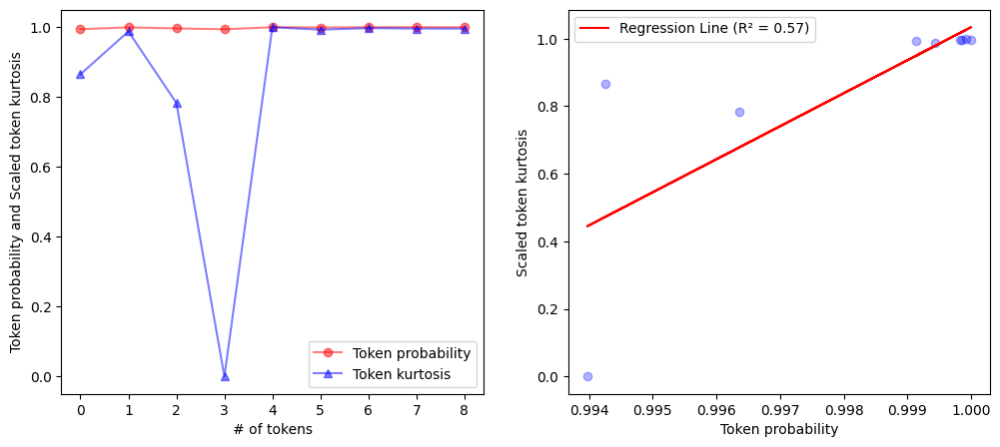

  1%|          | 1/100 [00:01<01:42,  1.04s/it]

[Sentences]
   Input: translate English to German: I declare resumed the session of the European Parliament adjourned on Friday 17 December 1999, and I would like once again to wish you a happy new year in the hope that you enjoyed a pleasant festive period.
   True Translation: Ich erkläre die am Freitag, dem 17. Dezember unterbrochene Sitzungsperiode des Europäischen Parlaments für wiederaufgenommen, wünsche Ihnen nochmals alles Gute zum Jahreswechsel und hoffe, daß Sie schöne Ferien hatten.
   Predicted Translation: Ich erkläre die am Freitag, dem 17. Dezember 1999 unterbrochene Sitzungsperiode des Europäischen Parlaments für wieder aufgenommen, und ich möchte Ihnen erneut ein glückliches neues Jahr wünschen, in der Hoffnung, dass Sie einen angenehmen Festtag genießen.

[Scores]
   BLEU score: 0.4955474787092686
   METEOR score: 0.6400087260034905
   ROUGE score: {'rouge1': Score(precision=0.4883720930232558, recall=0.6176470588235294, fmeasure=0.5454545454545455), 'rouge2': Score(p

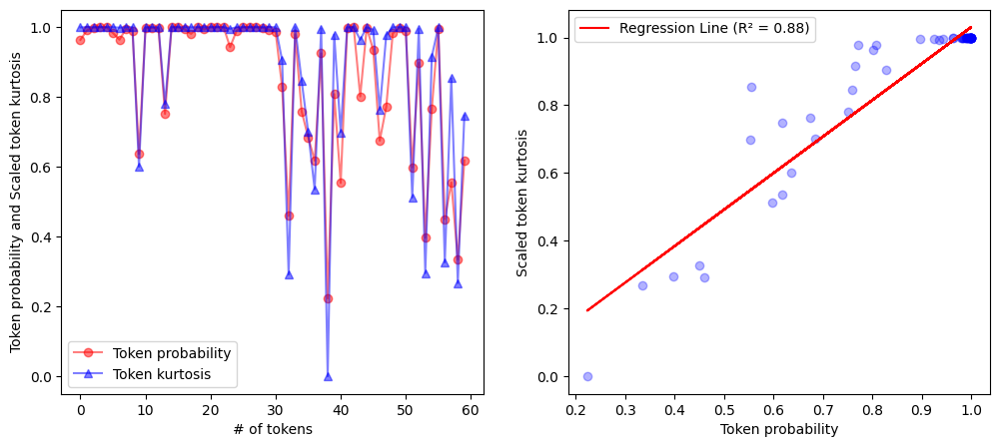

  2%|▏         | 2/100 [00:03<03:01,  1.85s/it]

[Sentences]
   Input: translate English to German: Although, as you will have seen, the dreaded 'millennium bug' failed to materialise, still the people in a number of countries suffered a series of natural disasters that truly were dreadful.
   True Translation: Wie Sie feststellen konnten, ist der gefürchtete "Millenium-Bug " nicht eingetreten. Doch sind Bürger einiger unserer Mitgliedstaaten Opfer von schrecklichen Naturkatastrophen geworden.
   Predicted Translation: Obwohl, wie Sie gesehen haben, der gefürchtete "Millennium-Fehler" nicht zustande kam, erlitten die Menschen in einigen Ländern noch immer eine Reihe von Naturkatastrophen, die wirklich schrecklich waren.

[Scores]
   BLEU score: 0.258758268765002
   METEOR score: 0.5387931034482759
   ROUGE score: {'rouge1': Score(precision=0.26666666666666666, recall=0.3333333333333333, fmeasure=0.2962962962962963), 'rouge2': Score(precision=0.10344827586206896, recall=0.13043478260869565, fmeasure=0.11538461538461538), 'rougeL': Sco

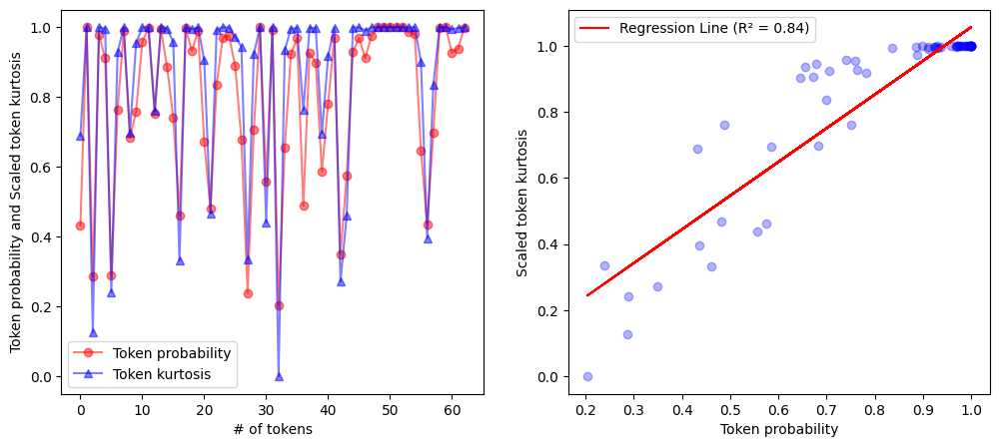

  3%|▎         | 3/100 [00:04<02:13,  1.37s/it]

[Sentences]
   Input: translate English to German: You have requested a debate on this subject in the course of the next few days, during this part-session.
   True Translation: Im Parlament besteht der Wunsch nach einer Aussprache im Verlauf dieser Sitzungsperiode in den nächsten Tagen.
   Predicted Translation: Sie haben in den nächsten Tagen, während dieser Sitzung, eine Aussprache zu diesem Thema beantragt.

[Scores]
   BLEU score: 0.251696695878184
   METEOR score: 0.41573183760683763
   ROUGE score: {'rouge1': Score(precision=0.4117647058823529, recall=0.4117647058823529, fmeasure=0.4117647058823529), 'rouge2': Score(precision=0.25, recall=0.25, fmeasure=0.25), 'rougeL': Score(precision=0.29411764705882354, recall=0.29411764705882354, fmeasure=0.29411764705882354)}
   BERT score: {'precision': [0.8852511644363403], 'recall': [0.8957069516181946], 'f1': [0.8904483318328857], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty 

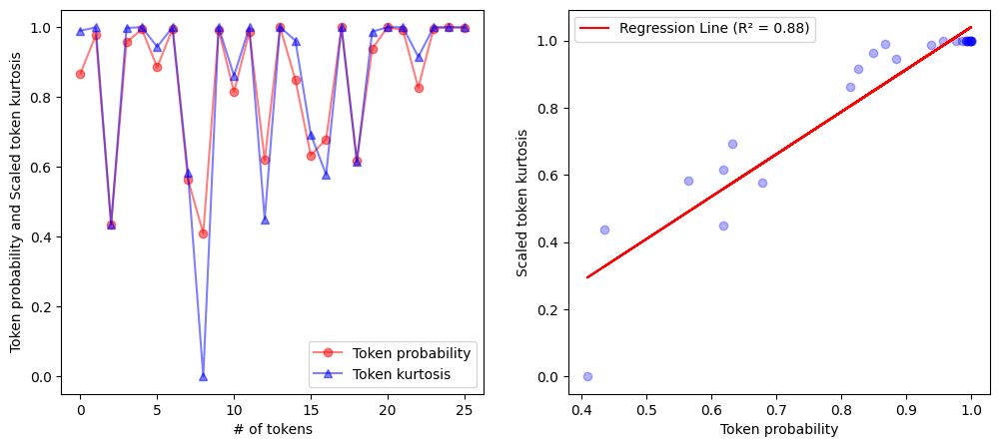

  4%|▍         | 4/100 [00:04<01:35,  1.00it/s]

[Sentences]
   Input: translate English to German: In the meantime, I should like to observe a minute' s silence, as a number of Members have requested, on behalf of all the victims concerned, particularly those of the terrible storms, in the various countries of the European Union.
   True Translation: Heute möchte ich Sie bitten - das ist auch der Wunsch einiger Kolleginnen und Kollegen -, allen Opfern der Stürme, insbesondere in den verschiedenen Ländern der Europäischen Union, in einer Schweigeminute zu gedenken.
   Predicted Translation: In der Zwischenzeit möchte ich, wie einige Abgeordnete es gefordert haben, im Namen aller betroffenen Opfer, insbesondere der schrecklichen Stürme, in den verschiedenen Ländern der Europäischen Union eine Schweigeminute einlegen.

[Scores]
   BLEU score: 0.2910242261957368
   METEOR score: 0.5503142295750778
   ROUGE score: {'rouge1': Score(precision=0.5882352941176471, recall=0.5714285714285714, fmeasure=0.5797101449275363), 'rouge2': Score(preci

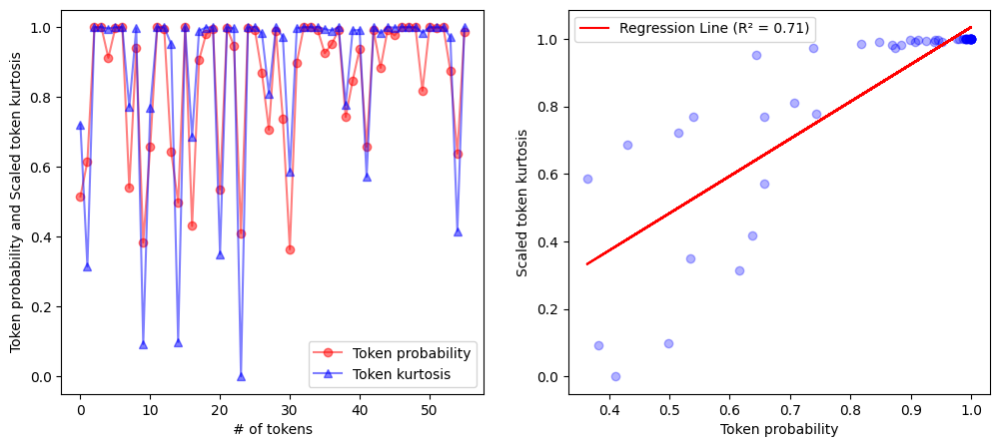

  5%|▌         | 5/100 [00:05<01:25,  1.11it/s]

[Sentences]
   Input: translate English to German: Please rise, then, for this minute' s silence.
   True Translation: Ich bitte Sie, sich zu einer Schweigeminute zu erheben.
   Predicted Translation: Bitte erheben Sie sich also um diese Schweigeminute.

[Scores]
   BLEU score: 0.1227126309787732
   METEOR score: 0.6027027027027027
   ROUGE score: {'rouge1': Score(precision=0.625, recall=0.5555555555555556, fmeasure=0.5882352941176471), 'rouge2': Score(precision=0.14285714285714285, recall=0.125, fmeasure=0.13333333333333333), 'rougeL': Score(precision=0.5, recall=0.4444444444444444, fmeasure=0.47058823529411764)}
   BERT score: {'precision': [0.9376577734947205], 'recall': [0.9166398048400879], 'f1': [0.9270296692848206], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0.747
   [New UQ] Confidence-A-T (Arithmetic mean of token probability): 0.803

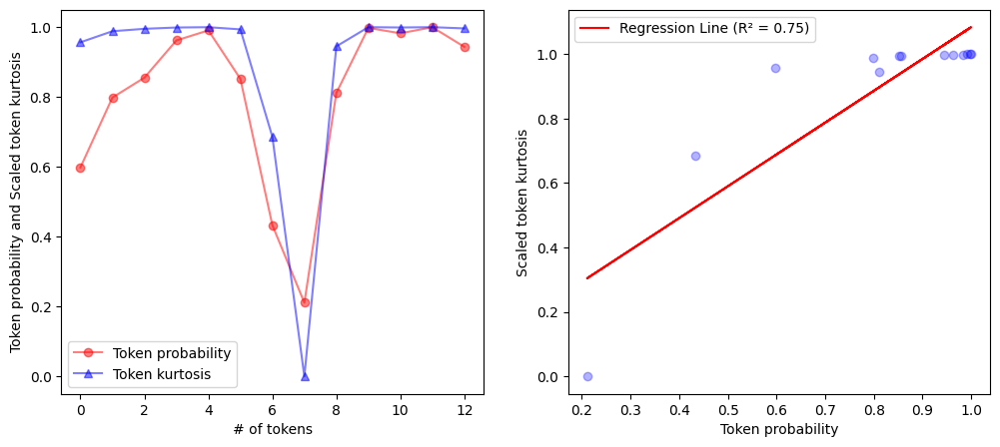

  6%|▌         | 6/100 [00:05<01:05,  1.43it/s]

[Sentences]
   Input: translate English to German: (The House rose and observed a minute' s silence)
   True Translation: (Das Parlament erhebt sich zu einer Schweigeminute.)
   Predicted Translation: (Das Parlament erhebt sich zu einer Schweigeminute.)

[Scores]
   BLEU score: 1.0
   METEOR score: 0.9998779296875
   ROUGE score: {'rouge1': Score(precision=1.0, recall=1.0, fmeasure=1.0), 'rouge2': Score(precision=1.0, recall=1.0, fmeasure=1.0), 'rougeL': Score(precision=1.0, recall=1.0, fmeasure=1.0)}
   BERT score: {'precision': [1.0], 'recall': [1.0], 'f1': [1.0], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0.911
   [New UQ] Confidence-A-T (Arithmetic mean of token probability): 0.925
   [New UQ] Confidence-A-K (Arithmetic mean of kurtosis): 0.914


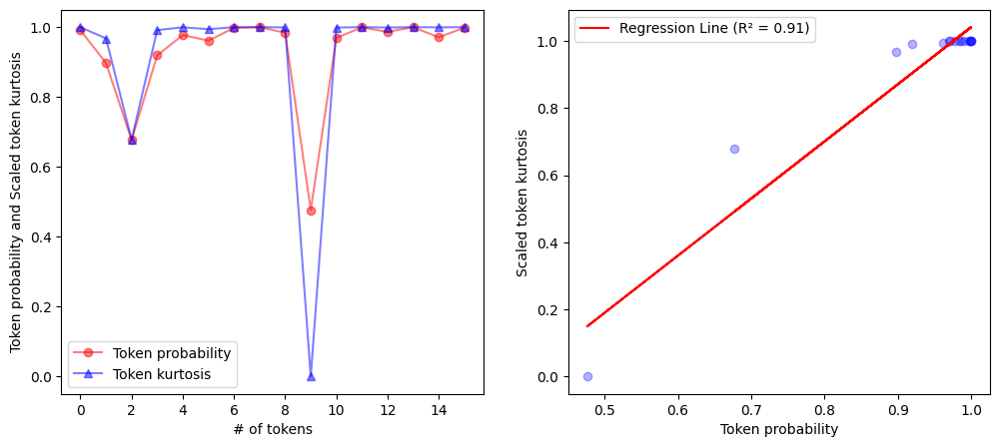

  7%|▋         | 7/100 [00:06<00:53,  1.73it/s]

[Sentences]
   Input: translate English to German: Madam President, on a point of order.
   True Translation: Frau Präsidentin, zur Geschäftsordnung.
   Predicted Translation: Frau Präsidentin, zur Geschäftsordnung.

[Scores]
   BLEU score: 1.0
   METEOR score: 0.9993141289437586
   ROUGE score: {'rouge1': Score(precision=1.0, recall=1.0, fmeasure=1.0), 'rouge2': Score(precision=1.0, recall=1.0, fmeasure=1.0), 'rougeL': Score(precision=1.0, recall=1.0, fmeasure=1.0)}
   BERT score: {'precision': [0.9999998211860657], 'recall': [0.9999998211860657], 'f1': [0.9999998211860657], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0.902
   [New UQ] Confidence-A-T (Arithmetic mean of token probability): 0.915
   [New UQ] Confidence-A-K (Arithmetic mean of kurtosis): 0.793


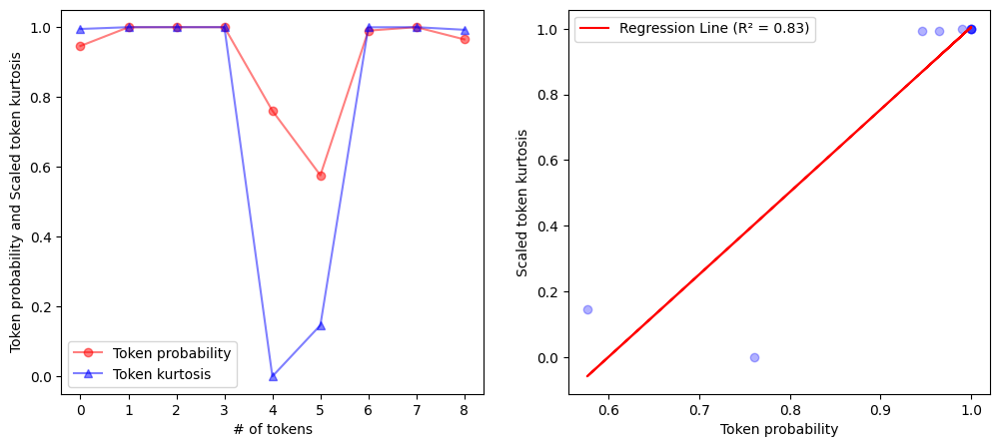

  8%|▊         | 8/100 [00:06<00:43,  2.10it/s]

[Sentences]
   Input: translate English to German: You will be aware from the press and television that there have been a number of bomb explosions and killings in Sri Lanka.
   True Translation: Wie Sie sicher aus der Presse und dem Fernsehen wissen, gab es in Sri Lanka mehrere Bombenexplosionen mit zahlreichen Toten.
   Predicted Translation: Sie wissen aus der Presse und dem Fernsehen, dass es in Sri Lanka eine Reihe von Bombenexplosionen und Tötungen gegeben hat.

[Scores]
   BLEU score: 0.4289008848681009
   METEOR score: 0.6807043338234264
   ROUGE score: {'rouge1': Score(precision=0.5909090909090909, recall=0.65, fmeasure=0.6190476190476191), 'rouge2': Score(precision=0.38095238095238093, recall=0.42105263157894735, fmeasure=0.4), 'rougeL': Score(precision=0.5454545454545454, recall=0.6, fmeasure=0.5714285714285713)}
   BERT score: {'precision': [0.9227197170257568], 'recall': [0.9374896287918091], 'f1': [0.9300460815429688], 'hashcode': 'distilbert-base-multilingual-cased_L5_no

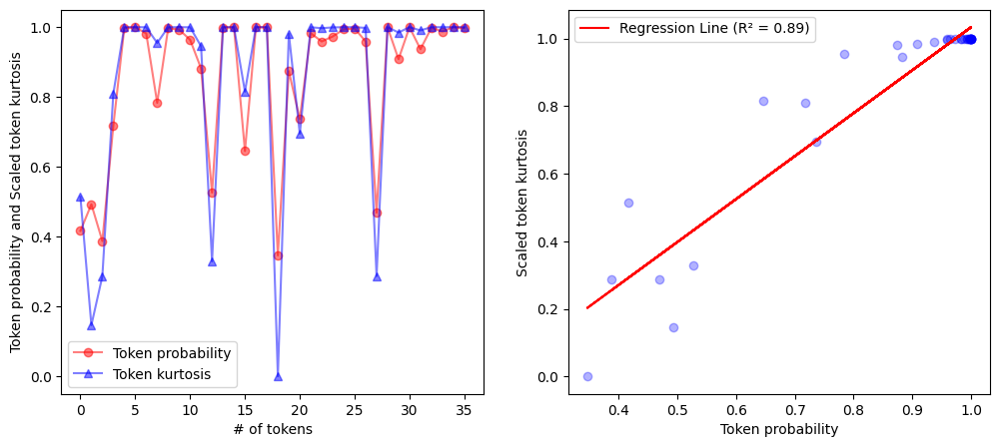

  9%|▉         | 9/100 [00:06<00:45,  2.01it/s]

[Sentences]
   Input: translate English to German: One of the people assassinated very recently in Sri Lanka was Mr Kumar Ponnambalam, who had visited the European Parliament just a few months ago.
   True Translation: Zu den Attentatsopfern, die es in jüngster Zeit in Sri Lanka zu beklagen gab, zählt auch Herr Kumar Ponnambalam, der dem Europäischen Parlament erst vor wenigen Monaten einen Besuch abgestattet hatte.
   Predicted Translation: Einer der Menschen, die vor kurzem in Sri Lanka ermordet wurden, war Herr Kumar Ponnambalam, der vor wenigen Monaten das Europäische Parlament besucht hatte.

[Scores]
   BLEU score: 0.2200064304563623
   METEOR score: 0.46899224806201545
   ROUGE score: {'rouge1': Score(precision=0.56, recall=0.4117647058823529, fmeasure=0.4745762711864407), 'rouge2': Score(precision=0.2916666666666667, recall=0.21212121212121213, fmeasure=0.2456140350877193), 'rougeL': Score(precision=0.48, recall=0.35294117647058826, fmeasure=0.4067796610169491)}
   BERT score: 

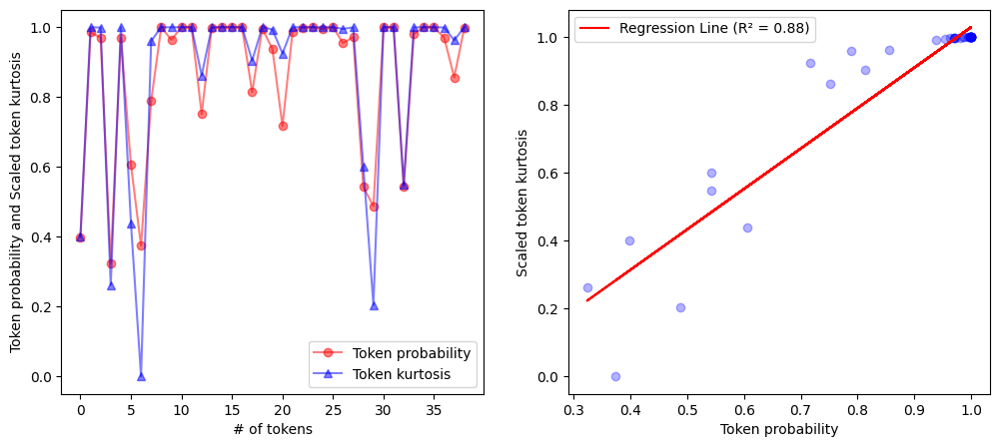

 10%|█         | 10/100 [00:07<00:46,  1.92it/s]

[Sentences]
   Input: translate English to German: Would it be appropriate for you, Madam President, to write a letter to the Sri Lankan President expressing Parliament's regret at his and the other violent deaths in Sri Lanka and urging her to do everything she possibly can to seek a peaceful reconciliation to a very difficult situation?
   True Translation: Wäre es angemessen, wenn Sie, Frau Präsidentin, der Präsidentin von Sri Lanka in einem Schreiben das Bedauern des Parlaments zum gewaltsamen Tod von Herrn Ponnambalam und anderen Bürgern von Sri Lanka übermitteln und sie auffordern würden, alles in ihrem Kräften stehende zu tun, um nach einer friedlichen Lösung dieser sehr schwierigen Situation zu suchen?
   Predicted Translation: Wäre es angebracht, Frau Präsidentin, einen Brief an die sri-lankische Präsidentin zu schreiben, in dem sie das Bedauern des Parlaments über seinen und die anderen gewalttätigen Todesfälle in Sri Lanka zum Ausdruck bringt und sie auffordert, alles zu tun

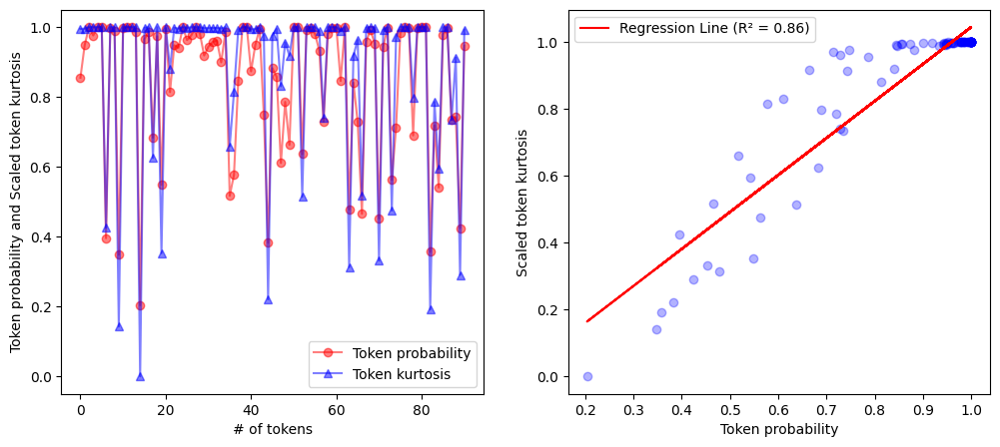

 11%|█         | 11/100 [00:08<01:02,  1.43it/s]

[Sentences]
   Input: translate English to German: Yes, Mr Evans, I feel an initiative of the type you have just suggested would be entirely appropriate.
   True Translation: Ja, Herr Evans, ich denke, daß eine derartige Initiative durchaus angebracht ist.
   Predicted Translation: Ja, Herr Evans, ich halte eine Initiative, wie sie Sie soeben vorgeschlagen haben, für völlig angemessen.

[Scores]
   BLEU score: 0.23266541684590059
   METEOR score: 0.31397754137115846
   ROUGE score: {'rouge1': Score(precision=0.3333333333333333, recall=0.5, fmeasure=0.4), 'rouge2': Score(precision=0.17647058823529413, recall=0.2727272727272727, fmeasure=0.21428571428571427), 'rougeL': Score(precision=0.3333333333333333, recall=0.5, fmeasure=0.4)}
   BERT score: {'precision': [0.871662437915802], 'recall': [0.8939641118049622], 'f1': [0.8826724290847778], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (

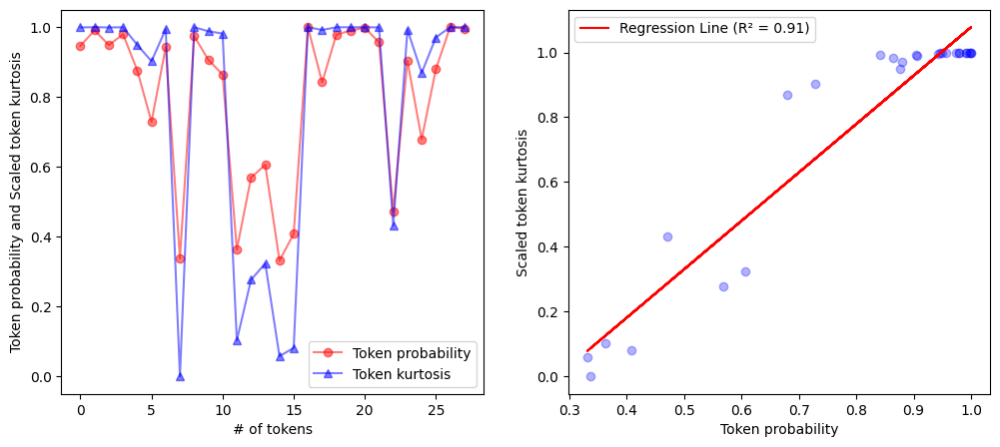

 12%|█▏        | 12/100 [00:08<00:55,  1.60it/s]

[Sentences]
   Input: translate English to German: If the House agrees, I shall do as Mr Evans has suggested.
   True Translation: Wenn das Haus damit einverstanden ist, werde ich dem Vorschlag von Herrn Evans folgen.
   Predicted Translation: Wenn das Parlament zustimmt, werde ich das tun, wie Herr Evans vorgeschlagen hat.

[Scores]
   BLEU score: 0.1461053448657972
   METEOR score: 0.3630728775356874
   ROUGE score: {'rouge1': Score(precision=0.38461538461538464, recall=0.35714285714285715, fmeasure=0.3703703703703704), 'rouge2': Score(precision=0.16666666666666666, recall=0.15384615384615385, fmeasure=0.16), 'rougeL': Score(precision=0.38461538461538464, recall=0.35714285714285715, fmeasure=0.3703703703703704)}
   BERT score: {'precision': [0.8873006105422974], 'recall': [0.8870925903320312], 'f1': [0.8871965408325195], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean

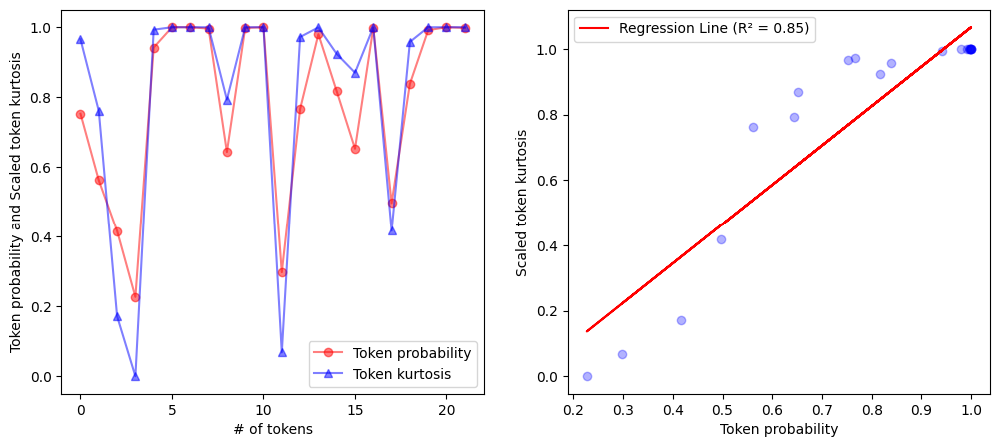

 13%|█▎        | 13/100 [00:09<00:47,  1.82it/s]

[Sentences]
   Input: translate English to German: Madam President, on a point of order.
   True Translation: Frau Präsidentin, zur Geschäftsordnung.
   Predicted Translation: Frau Präsidentin, zur Geschäftsordnung.

[Scores]
   BLEU score: 1.0
   METEOR score: 0.9993141289437586
   ROUGE score: {'rouge1': Score(precision=1.0, recall=1.0, fmeasure=1.0), 'rouge2': Score(precision=1.0, recall=1.0, fmeasure=1.0), 'rougeL': Score(precision=1.0, recall=1.0, fmeasure=1.0)}
   BERT score: {'precision': [0.9999998211860657], 'recall': [0.9999998211860657], 'f1': [0.9999998211860657], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0.902
   [New UQ] Confidence-A-T (Arithmetic mean of token probability): 0.915
   [New UQ] Confidence-A-K (Arithmetic mean of kurtosis): 0.793


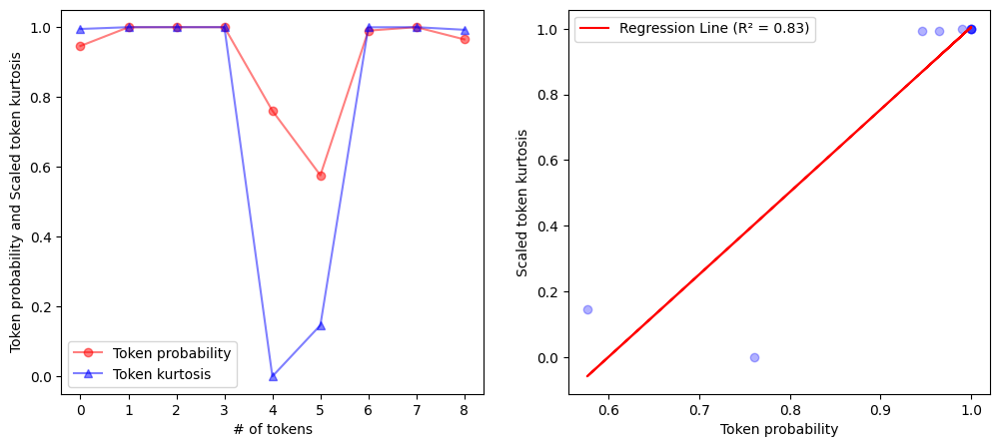

 14%|█▍        | 14/100 [00:09<00:39,  2.18it/s]

[Sentences]
   Input: translate English to German: I would like your advice about Rule 143 concerning inadmissibility.
   True Translation: Könnten Sie mir eine Auskunft zu Artikel 143 im Zusammenhang mit der Unzulässigkeit geben?
   Predicted Translation: Ich möchte Ihren Rat zu Artikel 143 über die Unzulässigkeit ersuchen.

[Scores]
   BLEU score: 0.2124958773297212
   METEOR score: 0.36248436395279277
   ROUGE score: {'rouge1': Score(precision=0.38461538461538464, recall=0.3125, fmeasure=0.3448275862068966), 'rouge2': Score(precision=0.25, recall=0.2, fmeasure=0.22222222222222224), 'rougeL': Score(precision=0.38461538461538464, recall=0.3125, fmeasure=0.3448275862068966)}
   BERT score: {'precision': [0.9007495641708374], 'recall': [0.8811851739883423], 'f1': [0.8908599615097046], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0.698
   [New UQ

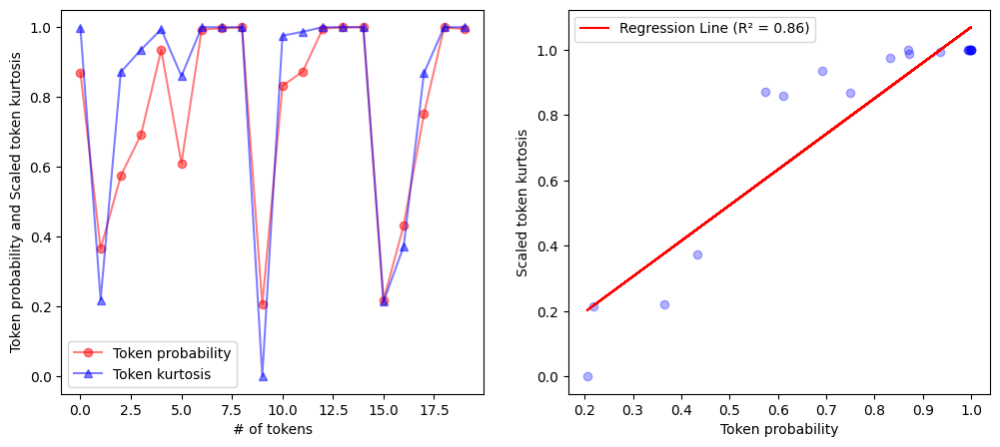

 15%|█▌        | 15/100 [00:09<00:36,  2.34it/s]

[Sentences]
   Input: translate English to German: My question relates to something that will come up on Thursday and which I will then raise again.
   True Translation: Meine Frage betrifft eine Angelegenheit, die am Donnerstag zur Sprache kommen wird und auf die ich dann erneut verweisen werde.
   Predicted Translation: Meine Frage bezieht sich auf etwas, das am Donnerstag auftauchen wird und das ich dann noch einmal ansprechen werde.

[Scores]
   BLEU score: 0.21734528162175176
   METEOR score: 0.5361625619105774
   ROUGE score: {'rouge1': Score(precision=0.5263157894736842, recall=0.5, fmeasure=0.5128205128205129), 'rouge2': Score(precision=0.2222222222222222, recall=0.21052631578947367, fmeasure=0.21621621621621623), 'rougeL': Score(precision=0.47368421052631576, recall=0.45, fmeasure=0.46153846153846156)}
   BERT score: {'precision': [0.8998477458953857], 'recall': [0.8991169929504395], 'f1': [0.8994821906089783], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=

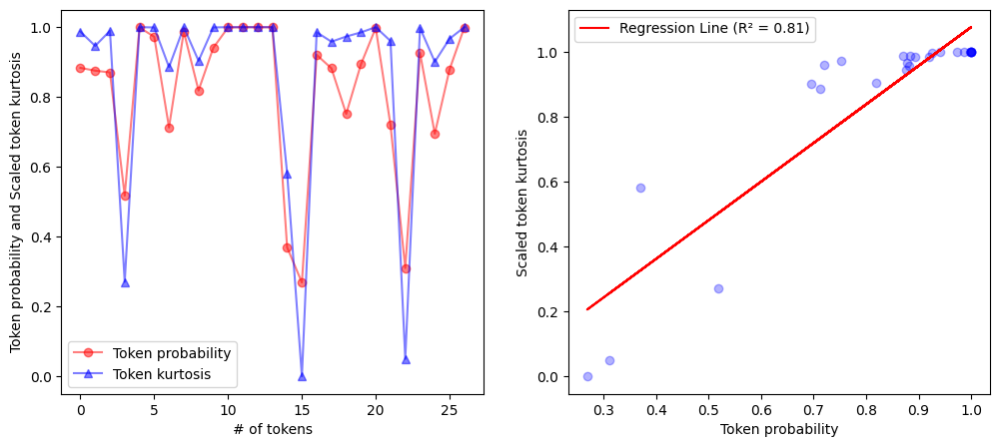

 16%|█▌        | 16/100 [00:10<00:35,  2.35it/s]

[Sentences]
   Input: translate English to German: The Cunha report on multiannual guidance programmes comes before Parliament on Thursday and contains a proposal in paragraph 6 that a form of quota penalties should be introduced for countries which fail to meet their fleet reduction targets annually.
   True Translation: Das Parlament wird sich am Donnerstag mit dem Cunha-Bericht über mehrjährige Ausrichtungsprogramme befassen, der in Absatz 6 vorschlägt, daß Länder, die ihr Soll zur Flottenverkleinerung nicht erfüllen, jährlich mit einer Art Quotenstrafe belegt werden sollen.
   Predicted Translation: Der Bericht Cunha über mehrjährige Ausrichtungsprogramme liegt dem Parlament am Donnerstag vor und enthält in Ziffer 6 einen Vorschlag, eine Form von Quotenstrafen für Länder einzuführen, die ihre Ziele zur Reduzierung der Flotte nicht jährlich erfüllen.

[Scores]
   BLEU score: 0.23134751717835988
   METEOR score: 0.4820812441573893
   ROUGE score: {'rouge1': Score(precision=0.53488372

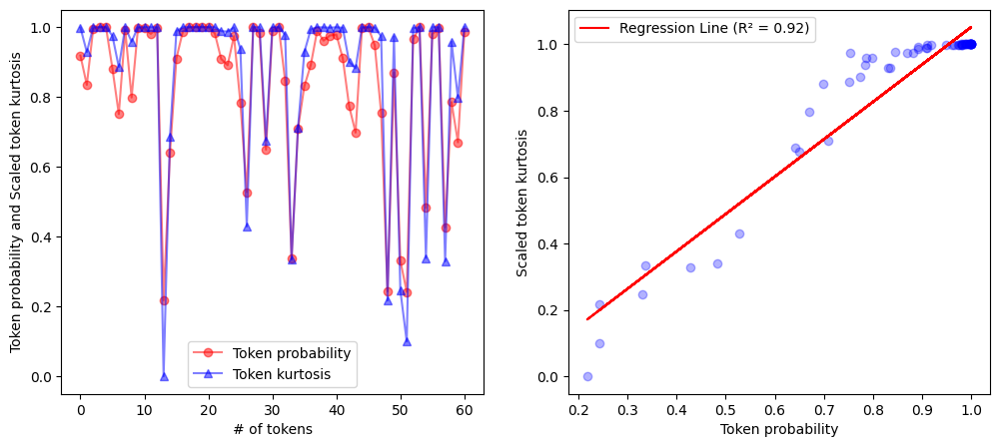

 17%|█▋        | 17/100 [00:11<00:48,  1.72it/s]

[Sentences]
   Input: translate English to German: It says that this should be done despite the principle of relative stability.
   True Translation: Und zwar sollen derartige Strafen trotz des Grundsatzes der relativen Stabilität verhängt werden.
   Predicted Translation: Sie sagt, dass dies trotz des Grundsatzes der relativen Stabilität erfolgen sollte.

[Scores]
   BLEU score: 0.47427880699648
   METEOR score: 0.5475245299977529
   ROUGE score: {'rouge1': Score(precision=0.5384615384615384, recall=0.4666666666666667, fmeasure=0.5), 'rouge2': Score(precision=0.5, recall=0.42857142857142855, fmeasure=0.4615384615384615), 'rougeL': Score(precision=0.5384615384615384, recall=0.4666666666666667, fmeasure=0.5)}
   BERT score: {'precision': [0.9422839283943176], 'recall': [0.8901808857917786], 'f1': [0.9154916405677795], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of to

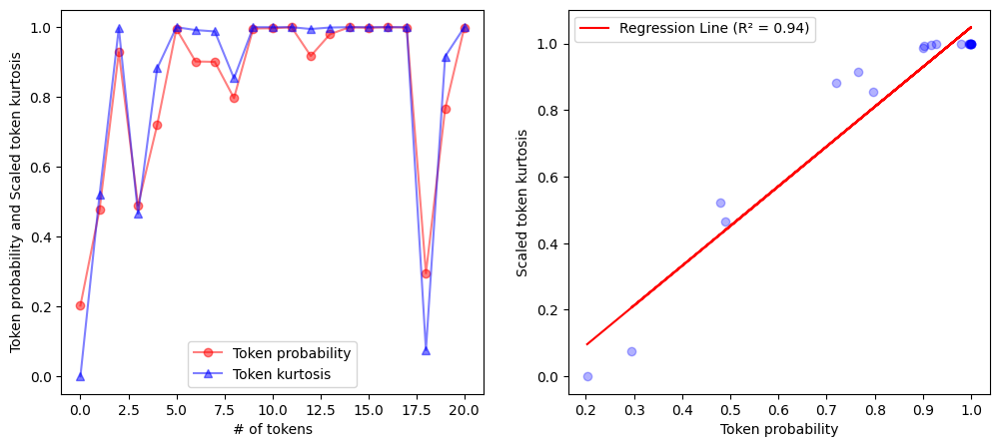

 18%|█▊        | 18/100 [00:11<00:43,  1.89it/s]

[Sentences]
   Input: translate English to German: I believe that the principle of relative stability is a fundamental legal principle of the common fisheries policy and a proposal to subvert it would be legally inadmissible.
   True Translation: Ich meine, daß der Grundsatz der relativen Stabilität einen elementaren Rechtsgrundsatz der gemeinsamen Fischereipolitik darstellt und ein Vorschlag, diesen zu unterlaufen, rechtlich unzulässig wäre.
   Predicted Translation: Ich glaube, dass der Grundsatz der relativen Stabilität ein grundlegendes Rechtsprinzip der Gemeinsamen Fischereipolitik ist, und ein Vorschlag, ihn zu untergraben, wäre rechtlich unzulässig.

[Scores]
   BLEU score: 0.41605476884349973
   METEOR score: 0.6751495779034505
   ROUGE score: {'rouge1': Score(precision=0.7037037037037037, recall=0.7037037037037037, fmeasure=0.7037037037037037), 'rouge2': Score(precision=0.46153846153846156, recall=0.46153846153846156, fmeasure=0.46153846153846156), 'rougeL': Score(precision=0.

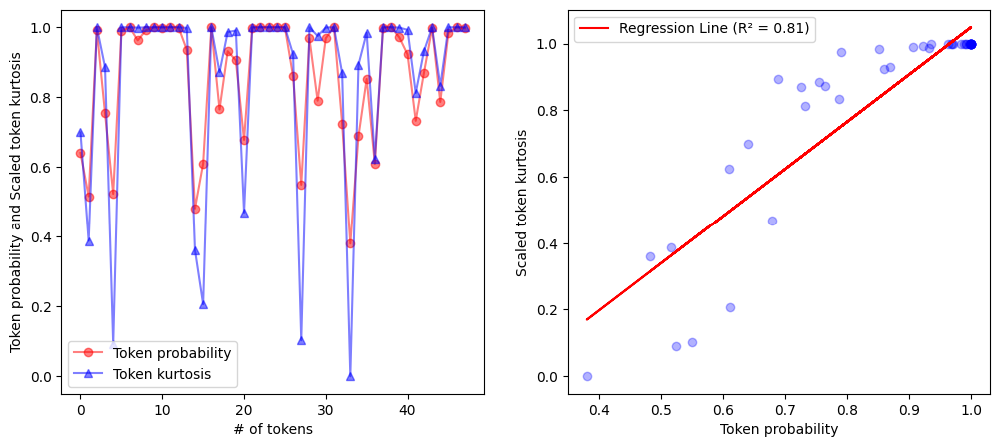

 19%|█▉        | 19/100 [00:12<00:45,  1.77it/s]

[Sentences]
   Input: translate English to German: I want to know whether one can raise an objection of that kind to what is merely a report, not a legislative proposal, and whether that is something I can competently do on Thursday.
   True Translation: Ich möchte wissen, ob es möglich ist, einen Einwand gegen ein Dokument zu erheben, bei dem es sich lediglich um einen Bericht und keinen Legislativvorschlag handelt, und ob ich befugt bin, dies am Donnerstag zu tun.
   Predicted Translation: Ich möchte wissen, ob man einen solchen Einwand gegen einen bloßen Bericht und nicht einen Legislativvorschlag erheben kann, und ob ich das am Donnerstag kompetent tun kann.

[Scores]
   BLEU score: 0.3325213698974645
   METEOR score: 0.5237505040836217
   ROUGE score: {'rouge1': Score(precision=0.6551724137931034, recall=0.5, fmeasure=0.5671641791044776), 'rouge2': Score(precision=0.32142857142857145, recall=0.24324324324324326, fmeasure=0.27692307692307694), 'rougeL': Score(precision=0.6206896551

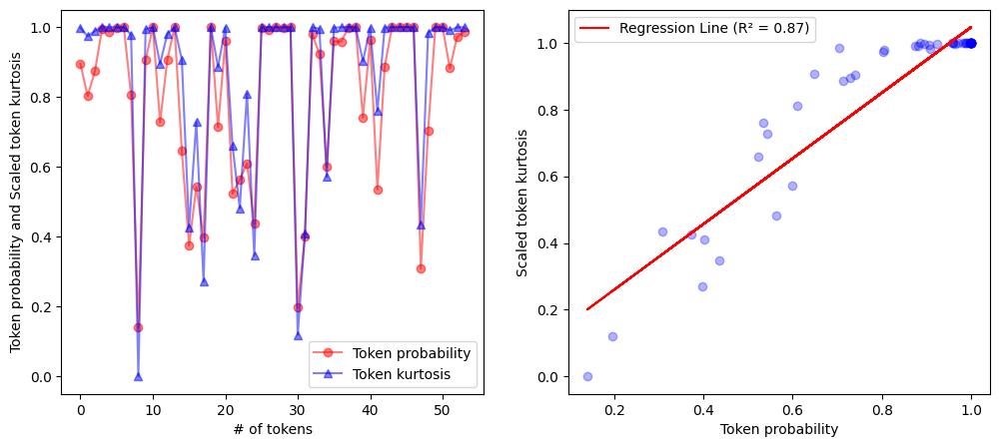

 20%|██        | 20/100 [00:13<00:48,  1.65it/s]

[Sentences]
   Input: translate English to German: That is precisely the time when you may, if you wish, raise this question, i.e. on Thursday prior to the start of the presentation of the report.
   True Translation: Genau dann können Sie, wenn Sie wollen, diese Frage ansprechen, d. h. am Donnerstag zu Beginn der Aussprache über den Bericht.
   Predicted Translation: Gerade jetzt können Sie diese Frage, d. h. am Donnerstag vor Beginn der Vorlage des Berichts, aufwerfen.

[Scores]
   BLEU score: 0.4043630721706907
   METEOR score: 0.5978812793010866
   ROUGE score: {'rouge1': Score(precision=0.6666666666666666, recall=0.5454545454545454, fmeasure=0.6), 'rouge2': Score(precision=0.4117647058823529, recall=0.3333333333333333, fmeasure=0.36842105263157887), 'rougeL': Score(precision=0.6666666666666666, recall=0.5454545454545454, fmeasure=0.6)}
   BERT score: {'precision': [0.9184871912002563], 'recall': [0.911952555179596], 'f1': [0.9152081608772278], 'hashcode': 'distilbert-base-multilin

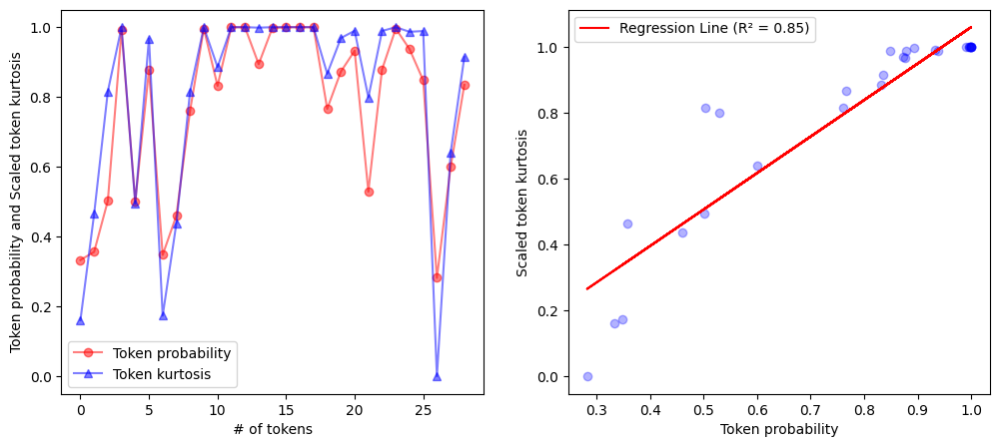

 21%|██        | 21/100 [00:13<00:44,  1.79it/s]

[Sentences]
   Input: translate English to German: Madam President, coinciding with this year' s first part-session of the European Parliament, a date has been set, unfortunately for next Thursday, in Texas in America, for the execution of a young 34 year-old man who has been sentenced to death. We shall call him Mr Hicks.
   True Translation: Die erste diesjährige Tagung des Europäischen Parlaments fällt leider damit zusammen, daß in den Vereinigten Staaten, in Texas, für Donnerstag dieser Woche die Hinrichtung eines zum Tode verurteilten 34jährigen jungen Mannes namens Hicks festgelegt worden ist.
   Predicted Translation: Frau Präsidentin, in Verbindung mit der ersten Tagung des Europäischen Parlaments in diesem Jahr wurde leider für den nächsten Donnerstag in Texas in Amerika ein Datum für die Hinrichtung eines jungen 34-jährigen Menschen festgelegt, der zum Tode verurteilt wurde, und wir werden ihn Herrn Hicks nennen.

[Scores]
   BLEU score: 0.2699017212296863
   METEOR score: 0.

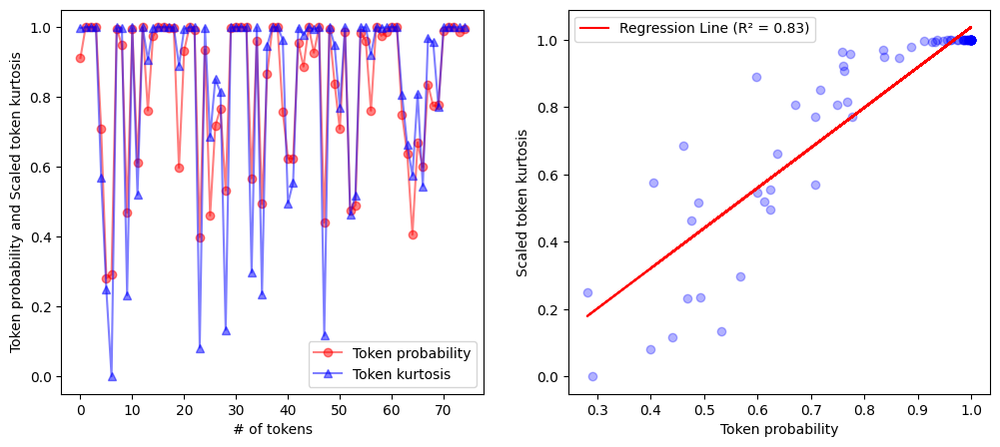

 22%|██▏       | 22/100 [00:14<00:52,  1.48it/s]

[Sentences]
   Input: translate English to German: At the request of a French Member, Mr Zimeray, a petition has already been presented, which many people signed, including myself.
   True Translation: Auf Wunsch eines französischen Mitglieds, Herrn Zimeray, wurde bereits eine Petition eingereicht, die von vielen, auch von mir selbst, unterzeichnet worden ist.
   Predicted Translation: Auf Antrag eines französischen Abgeordneten, Herrn Zimeray, wurde bereits eine Petition eingereicht, die viele unterzeichnet haben, darunter auch ich selbst.

[Scores]
   BLEU score: 0.5581152140066327
   METEOR score: 0.6830842227139294
   ROUGE score: {'rouge1': Score(precision=0.7142857142857143, recall=0.6521739130434783, fmeasure=0.6818181818181819), 'rouge2': Score(precision=0.45, recall=0.4090909090909091, fmeasure=0.4285714285714286), 'rougeL': Score(precision=0.6666666666666666, recall=0.6086956521739131, fmeasure=0.6363636363636365)}
   BERT score: {'precision': [0.9530043005943298], 'recall': 

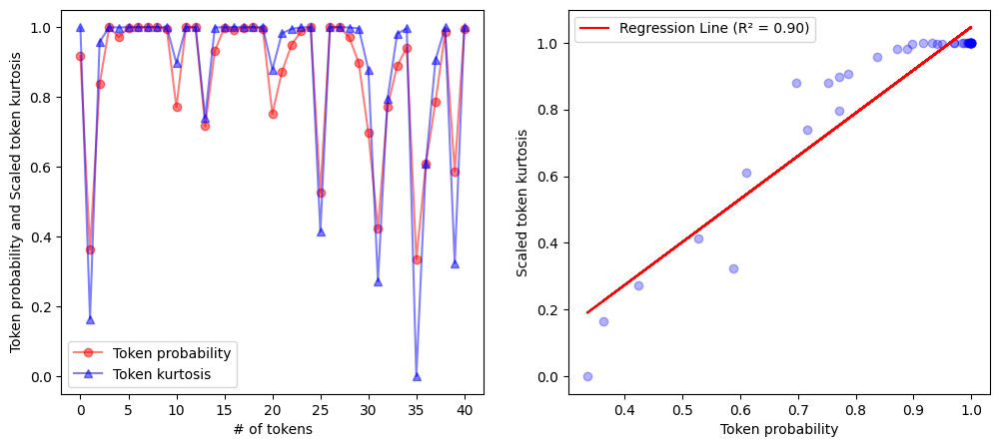

 23%|██▎       | 23/100 [00:15<00:49,  1.55it/s]

[Sentences]
   Input: translate English to German: However, I would ask you, in accordance with the line which is now constantly followed by the European Parliament and by the whole of the European Community, to make representations, using the weight of your prestigious office and the institution you represent, to the President and to the Governor of Texas, Mr Bush, who has the power to order a stay of execution and to reprieve the condemned person.
   True Translation: Gemäß der vom Europäischen Parlament und von der gesamten Europäischen Union nunmehr ständig vertretenen Linie möchte ich Sie jedoch bitten, den ganzen Einfluß Ihres Amtes und der Institution, die Sie vertreten, bei dem Präsidentschaftskandidaten und Gouverneur von Texas, George W. Bush, der zur Aussetzung der Vollstreckung des Todesurteils und zur Begnadigung des Verurteilten befugt ist, geltend zu machen.
   Predicted Translation: Ich möchte Sie jedoch bitten, sich gemäß der Linie, die jetzt ständig vom Europäischen P

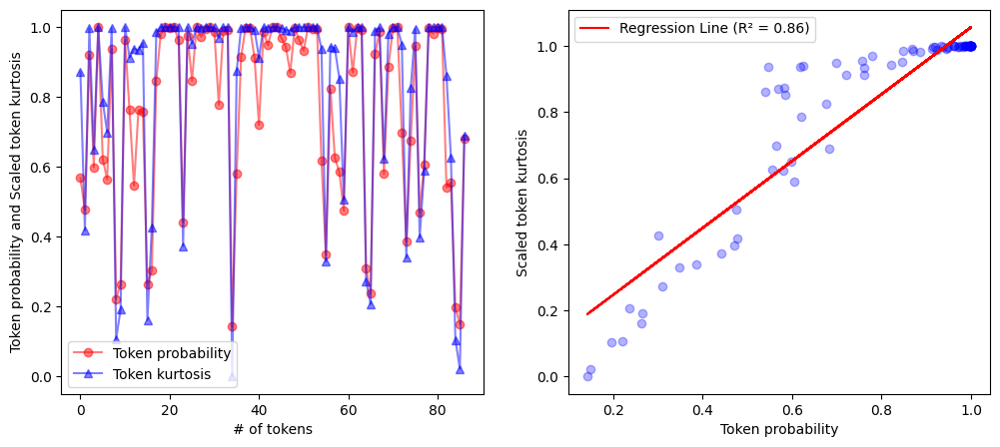

 24%|██▍       | 24/100 [00:16<00:59,  1.28it/s]

[Sentences]
   Input: translate English to German: This is all in accordance with the principles that we have always upheld.
   True Translation: All dies entspricht den Grundsätzen, die wir stets verteidigt haben.
   Predicted Translation: Das alles entspricht den Grundsätzen, die wir stets vertreten haben.

[Scores]
   BLEU score: 0.5154594228526463
   METEOR score: 0.6946300184513585
   ROUGE score: {'rouge1': Score(precision=0.8181818181818182, recall=0.8181818181818182, fmeasure=0.8181818181818182), 'rouge2': Score(precision=0.6, recall=0.6, fmeasure=0.6), 'rougeL': Score(precision=0.8181818181818182, recall=0.8181818181818182, fmeasure=0.8181818181818182)}
   BERT score: {'precision': [0.9692970514297485], 'recall': [0.9329094290733337], 'f1': [0.95075523853302], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0.72
   [New UQ] Confidence-A-T

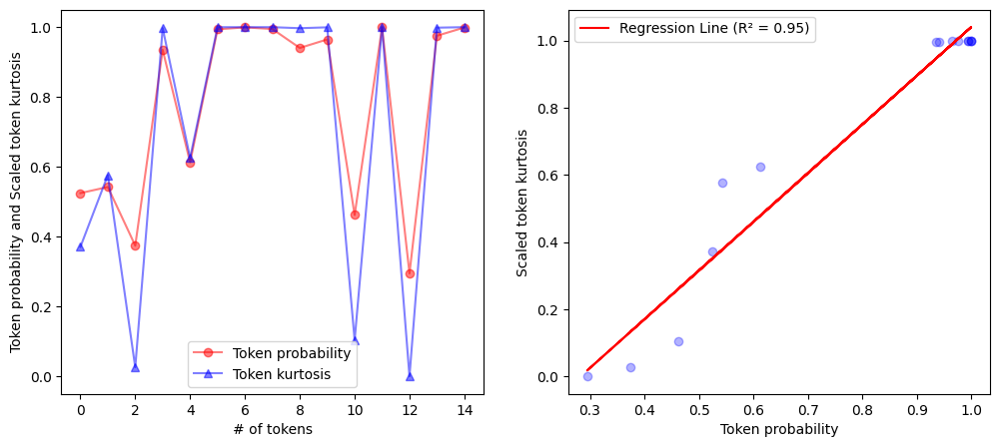

 25%|██▌       | 25/100 [00:16<00:48,  1.56it/s]

[Sentences]
   Input: translate English to German: Thank you, Mr Segni, I shall do so gladly.
   True Translation: Vielen Dank, Herr Segni, das will ich gerne tun.
   Predicted Translation: Vielen Dank, Herr Segni, ich werde das gerne tun.

[Scores]
   BLEU score: 0.6525452579142078
   METEOR score: 0.928611111111111
   ROUGE score: {'rouge1': Score(precision=0.8888888888888888, recall=0.8888888888888888, fmeasure=0.8888888888888888), 'rouge2': Score(precision=0.5, recall=0.5, fmeasure=0.5), 'rougeL': Score(precision=0.7777777777777778, recall=0.7777777777777778, fmeasure=0.7777777777777778)}
   BERT score: {'precision': [0.9777933955192566], 'recall': [0.9777933955192566], 'f1': [0.9777933955192566], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0.865
   [New UQ] Confidence-A-T (Arithmetic mean of token probability): 0.883
   [New UQ] Confidenc

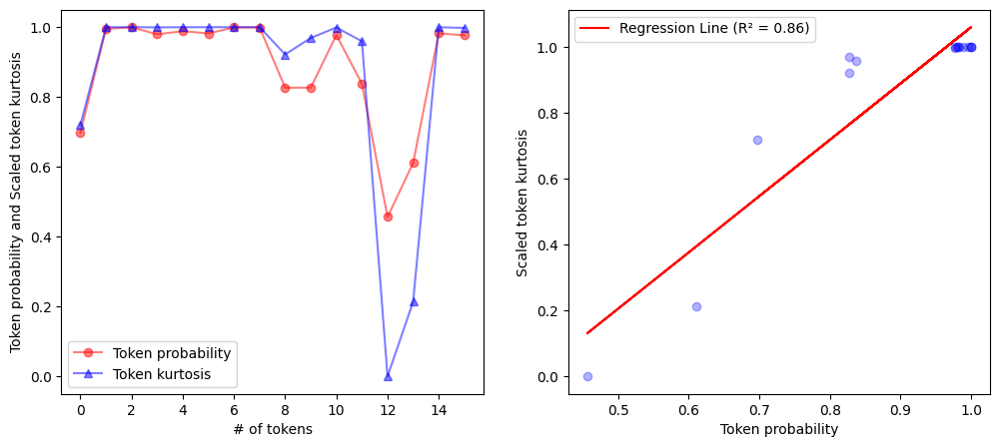

 26%|██▌       | 26/100 [00:16<00:40,  1.85it/s]

[Sentences]
   Input: translate English to German: Indeed, it is quite in keeping with the positions this House has always adopted.
   True Translation: Das ist ganz im Sinne der Position, die wir als Parlament immer vertreten haben.
   Predicted Translation: Das entspricht in der Tat den Positionen, die dieses Haus immer vertreten hat.

[Scores]
   BLEU score: 0.038419068302517345
   METEOR score: 0.3896604938271605
   ROUGE score: {'rouge1': Score(precision=0.38461538461538464, recall=0.35714285714285715, fmeasure=0.3703703703703704), 'rouge2': Score(precision=0.08333333333333333, recall=0.07692307692307693, fmeasure=0.08), 'rougeL': Score(precision=0.38461538461538464, recall=0.35714285714285715, fmeasure=0.3703703703703704)}
   BERT score: {'precision': [0.9145001769065857], 'recall': [0.9114973545074463], 'f1': [0.9129962921142578], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T 

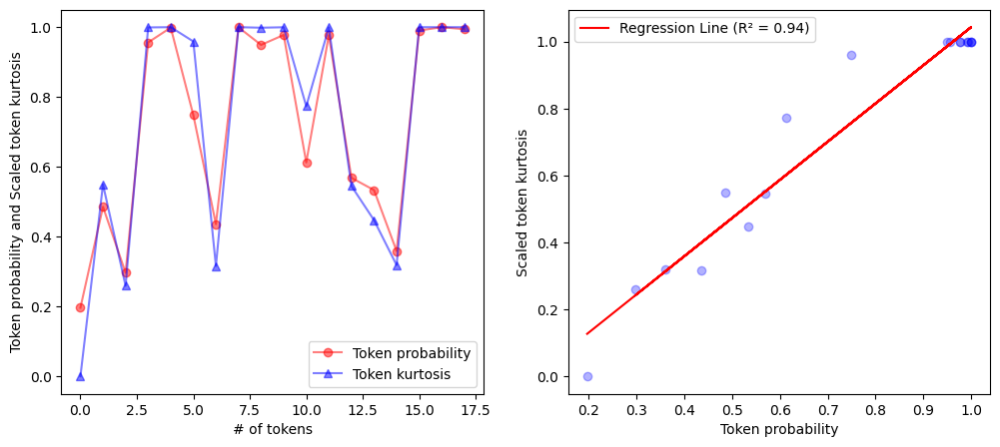

 27%|██▋       | 27/100 [00:17<00:35,  2.08it/s]

[Sentences]
   Input: translate English to German: Madam President, I should like to draw your attention to a case in which this Parliament has consistently shown an interest.
   True Translation: Frau Präsidentin! Ich möchte Sie auf einen Fall aufmerksam machen, mit dem sich dieses Parlament immer wieder befaßt hat.
   Predicted Translation: Frau Präsidentin, ich möchte Ihre Aufmerksamkeit auf einen Fall lenken, in dem dieses Parlament stets ein Interesse gezeigt hat.

[Scores]
   BLEU score: 0.18189587992135595
   METEOR score: 0.4604945231958763
   ROUGE score: {'rouge1': Score(precision=0.6190476190476191, recall=0.5909090909090909, fmeasure=0.6046511627906977), 'rouge2': Score(precision=0.4, recall=0.38095238095238093, fmeasure=0.3902439024390244), 'rougeL': Score(precision=0.6190476190476191, recall=0.5909090909090909, fmeasure=0.6046511627906977)}
   BERT score: {'precision': [0.9237570762634277], 'recall': [0.9149032235145569], 'f1': [0.9193088412284851], 'hashcode': 'distilber

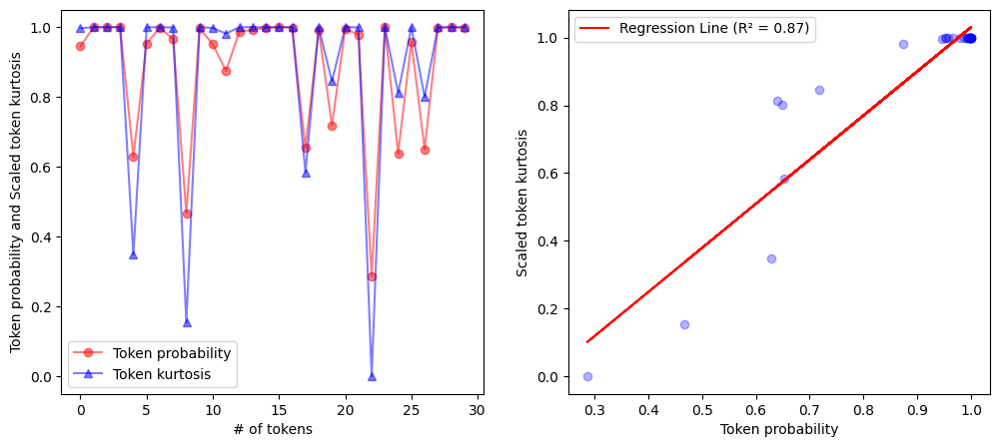

 28%|██▊       | 28/100 [00:17<00:34,  2.12it/s]

[Sentences]
   Input: translate English to German: It is the case of Alexander Nikitin.
   True Translation: Das ist der Fall von Alexander Nikitin.
   Predicted Translation: Das ist der Fall von Alexander Nikitin.

[Scores]
   BLEU score: 1.0
   METEOR score: 0.9995
   ROUGE score: {'rouge1': Score(precision=1.0, recall=1.0, fmeasure=1.0), 'rouge2': Score(precision=1.0, recall=1.0, fmeasure=1.0), 'rougeL': Score(precision=1.0, recall=1.0, fmeasure=1.0)}
   BERT score: {'precision': [1.0], 'recall': [1.0], 'f1': [1.0], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0.801
   [New UQ] Confidence-A-T (Arithmetic mean of token probability): 0.838
   [New UQ] Confidence-A-K (Arithmetic mean of kurtosis): 0.82


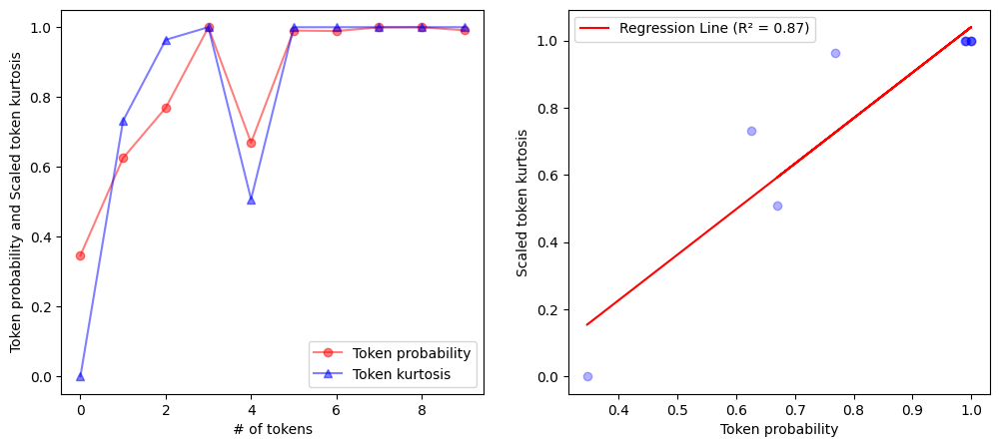

 29%|██▉       | 29/100 [00:17<00:28,  2.45it/s]

[Sentences]
   Input: translate English to German: All of us here are pleased that the courts have acquitted him and made it clear that in Russia, too, access to environmental information is a constitutional right.
   True Translation: Wir freuen uns hier alle, daß das Gericht ihn freigesprochen und deutlich gemacht hat, daß auch in Rußland der Zugang zu Umweltinformationen konstitutionelles Recht ist.
   Predicted Translation: Wir alle hier sind froh, dass die Gerichte ihn freigesprochen haben und deutlich gemacht haben, dass auch in Russland der Zugang zu Umweltinformationen ein verfassungsmäßiges Recht ist.

[Scores]
   BLEU score: 0.19288478089567945
   METEOR score: 0.5341682419659735
   ROUGE score: {'rouge1': Score(precision=0.6071428571428571, recall=0.6538461538461539, fmeasure=0.6296296296296297), 'rouge2': Score(precision=0.3333333333333333, recall=0.36, fmeasure=0.34615384615384615), 'rougeL': Score(precision=0.5714285714285714, recall=0.6153846153846154, fmeasure=0.5925925

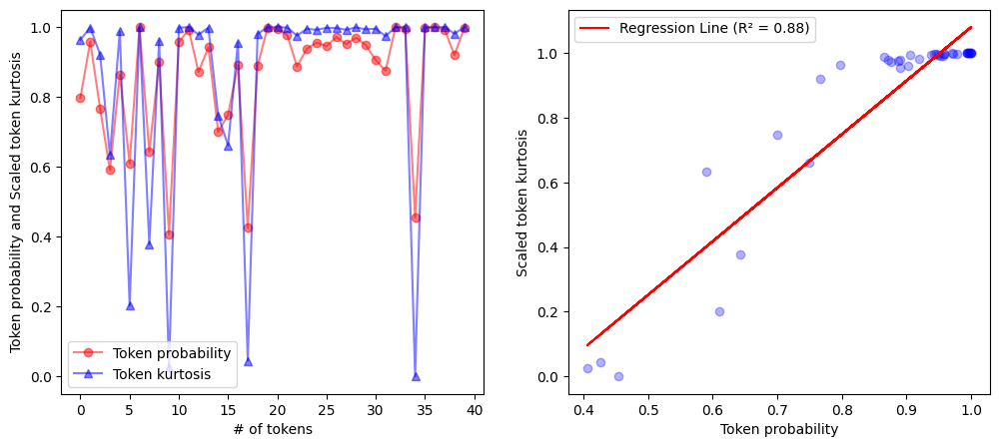

 30%|███       | 30/100 [00:18<00:31,  2.22it/s]

[Sentences]
   Input: translate English to German: Now, however, he is to go before the courts once more because the public prosecutor is appealing.
   True Translation: Nun ist es aber so, daß er wieder angeklagt werden soll, weil der Staatsanwalt in Berufung geht.
   Predicted Translation: Jetzt wird er jedoch noch einmal vor Gericht gehen, weil der Staatsanwalt Berufung einlegt.

[Scores]
   BLEU score: 0.1995959237152864
   METEOR score: 0.3614366319444444
   ROUGE score: {'rouge1': Score(precision=0.35714285714285715, recall=0.29411764705882354, fmeasure=0.3225806451612903), 'rouge2': Score(precision=0.15384615384615385, recall=0.125, fmeasure=0.13793103448275862), 'rougeL': Score(precision=0.35714285714285715, recall=0.29411764705882354, fmeasure=0.3225806451612903)}
   BERT score: {'precision': [0.9072191715240479], 'recall': [0.8887490630149841], 'f1': [0.8978891372680664], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertaint

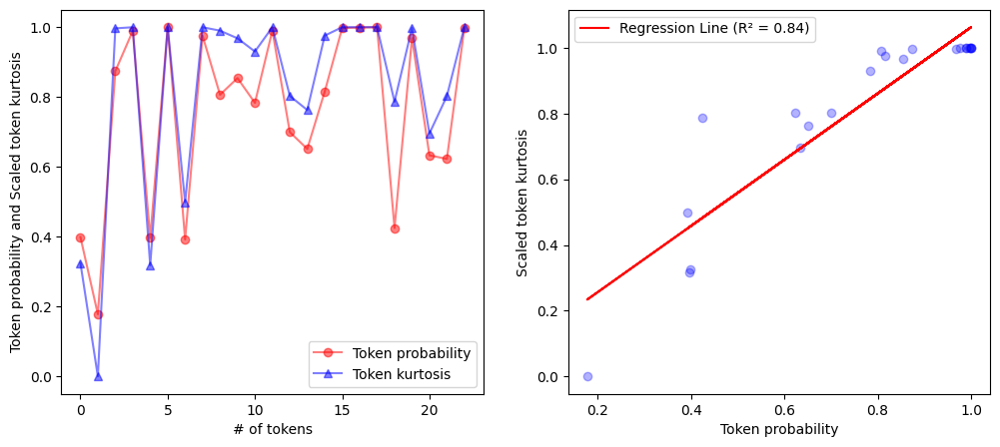

 31%|███       | 31/100 [00:18<00:30,  2.28it/s]

[Sentences]
   Input: translate English to German: We know, and we have stated as much in very many resolutions indeed, including specifically during the last plenary part-session of last year, that this is not solely a legal case and that it is wrong for Alexander Nikitin to be accused of criminal activity and treason because of our involvement as the beneficiaries of his findings.
   True Translation: Wir wissen und wir haben es in wirklich sehr vielen Entschließungen festgestellt - gerade während der letzten Plenartagung des vergangenen Jahres-, daß dies nicht nur ein juristischer Fall ist und daß es falsch ist, Alexander Nikitin Kriminalität und Verrat vorzuwerfen, weil wir als Betroffene von seinen Ergebnissen einen Nutzen haben.
   Predicted Translation: Wir wissen, und wir haben das in sehr vielen Entschließungen - auch während der letzten Plenarsitzung im vergangenen Jahr - auch gesagt, dass dies nicht nur ein Rechtsfall ist und dass es falsch ist, Alexander Nikitin wegen unser

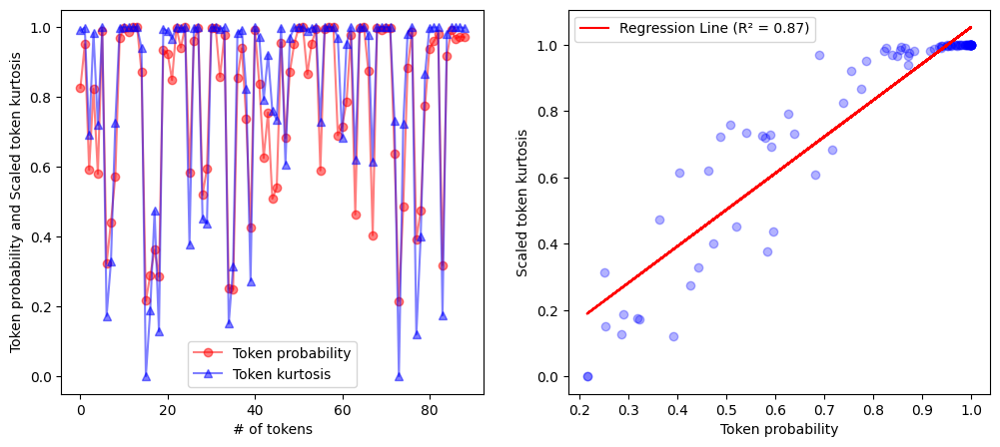

 32%|███▏      | 32/100 [00:19<00:43,  1.58it/s]

[Sentences]
   Input: translate English to German: These findings form the basis of the European programmes to protect the Barents Sea, and that is why I would ask you to examine a draft letter setting out the most important facts and to make Parliament's position, as expressed in the resolutions which it has adopted, clear as far as Russia is concerned.
   True Translation: Diese Ergebnisse sind die Grundlage für die europäischen Programme zum Schutz der Barentsee, und deswegen bitte ich Sie, einen Briefentwurf, der Ihnen die wichtigsten Fakten schildert, zu prüfen und im Sinne der Beschlüsse des Parlaments in Rußland diese Position deutlich zu machen.
   Predicted Translation: Diese Erkenntnisse bilden die Grundlage der europäischen Programme zum Schutz des Barents Meeres, und deshalb bitte ich Sie, einen Briefentwurf zu prüfen, der die wichtigsten Fakten darlegt, und die Position des Parlaments, wie sie in den Entschließungen, die es angenommen hat, in Bezug auf Russland klar zu mac

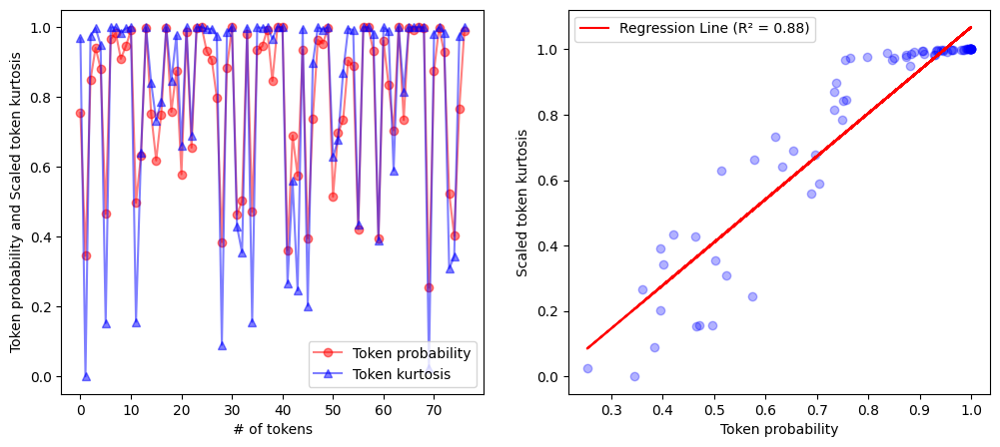

 33%|███▎      | 33/100 [00:20<00:48,  1.38it/s]

[Sentences]
   Input: translate English to German: Yes, Mrs Schroedter, I shall be pleased to look into the facts of this case when I have received your letter.
   True Translation: Frau Schroedter, ich bin gerne bereit, die damit zusammenhängenden Fakten zu prüfen, wenn mir Ihr Brief vorliegt.
   Predicted Translation: Ja, Frau Schroedter, ich werde mich freuen, wenn ich Ihr Schreiben erhalten habe, über die Fakten dieses Falls zu informieren.

[Scores]
   BLEU score: 0.3081206097311581
   METEOR score: 0.5627782251997913
   ROUGE score: {'rouge1': Score(precision=0.4, recall=0.42105263157894735, fmeasure=0.41025641025641024), 'rouge2': Score(precision=0.10526315789473684, recall=0.1111111111111111, fmeasure=0.10810810810810811), 'rougeL': Score(precision=0.3, recall=0.3157894736842105, fmeasure=0.3076923076923077)}
   BERT score: {'precision': [0.8839295506477356], 'recall': [0.8931528925895691], 'f1': [0.8885173201560974], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_ve

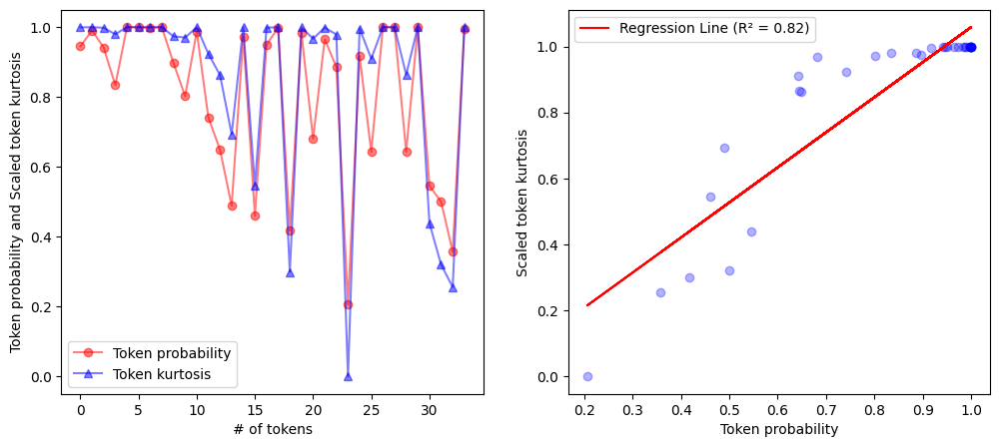

 34%|███▍      | 34/100 [00:21<00:43,  1.53it/s]

[Sentences]
   Input: translate English to German: Madam President, I would firstly like to compliment you on the fact that you have kept your word and that, during this first part-session of the new year, the number of television channels in our offices has indeed increased considerably.
   True Translation: Frau Präsidentin, zunächst besten Dank dafür, daß Sie Wort gehalten haben und nun in der ersten Sitzungsperiode des neuen Jahres das Angebot an Fernsehprogrammen in unseren Büros tatsächlich enorm erweitert ist.
   Predicted Translation: Frau Präsidentin, zunächst möchte ich Ihnen zu der Tatsache gratulieren, dass Sie Ihr Wort gehalten haben und dass die Zahl der Fernsehsender in unseren Büros in der Tat erheblich gestiegen ist.

[Scores]
   BLEU score: 0.2879986555675267
   METEOR score: 0.47545906440011815
   ROUGE score: {'rouge1': Score(precision=0.5142857142857142, recall=0.5, fmeasure=0.5070422535211268), 'rouge2': Score(precision=0.3235294117647059, recall=0.314285714285714

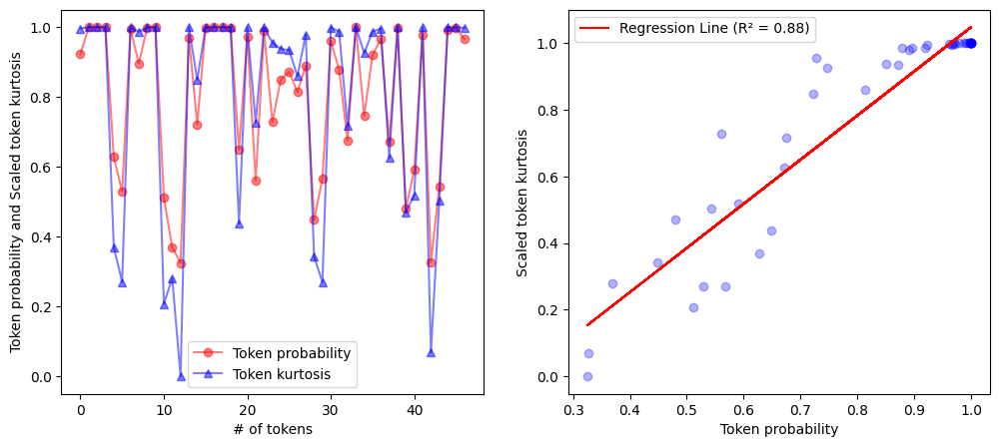

 35%|███▌      | 35/100 [00:21<00:42,  1.54it/s]

[Sentences]
   Input: translate English to German: But, Madam President, my personal request has not been met.
   True Translation: Dennoch, Frau Präsidentin, wurde meinem Wunsch nicht entsprochen.
   Predicted Translation: Aber, Frau Präsidentin, meine persönliche Bitte ist nicht erfüllt worden.

[Scores]
   BLEU score: 0.27444201848360156
   METEOR score: 0.41218637992831536
   ROUGE score: {'rouge1': Score(precision=0.3076923076923077, recall=0.4444444444444444, fmeasure=0.3636363636363637), 'rouge2': Score(precision=0.16666666666666666, recall=0.25, fmeasure=0.2), 'rougeL': Score(precision=0.3076923076923077, recall=0.4444444444444444, fmeasure=0.3636363636363637)}
   BERT score: {'precision': [0.887333869934082], 'recall': [0.8890306949615479], 'f1': [0.8881815075874329], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0.741
   [New UQ] Confi

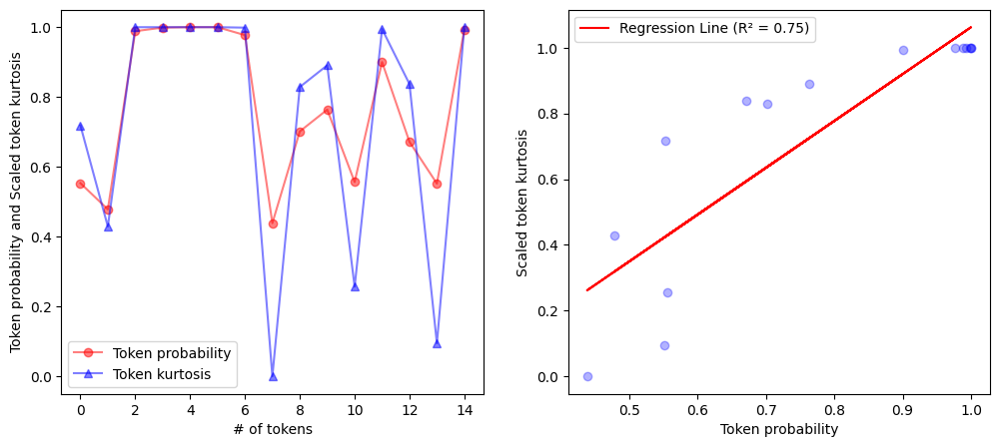

 36%|███▌      | 36/100 [00:22<00:34,  1.83it/s]

[Sentences]
   Input: translate English to German: Although there are now two Finnish channels and one Portuguese one, there is still no Dutch channel, which is what I had requested because Dutch people here like to be able to follow the news too when we are sent to this place of exile every month.
   True Translation: Zwar können wir jetzt zwei finnische und einen portugiesischen, nach wie vor aber keinen niederländischen Sender empfangen. Ich hatte Sie aber um ein niederländisches Programm gebeten, denn auch wir Niederländer möchten die Nachrichten verfolgen, wenn wir jeden Monat hierher in die Verbannung geschickt werden.
   Predicted Translation: Obwohl es jetzt zwei finnische und eine portugiesische Kanäle gibt, gibt es noch keinen niederländischen Kanal, was ich gefordert hatte, weil die niederländischen Leute hier gerne die Nachrichten verfolgen können, wenn wir jeden Monat an dieses Exil geschickt werden.

[Scores]
   BLEU score: 0.28834869212755443
   METEOR score: 0.471637557

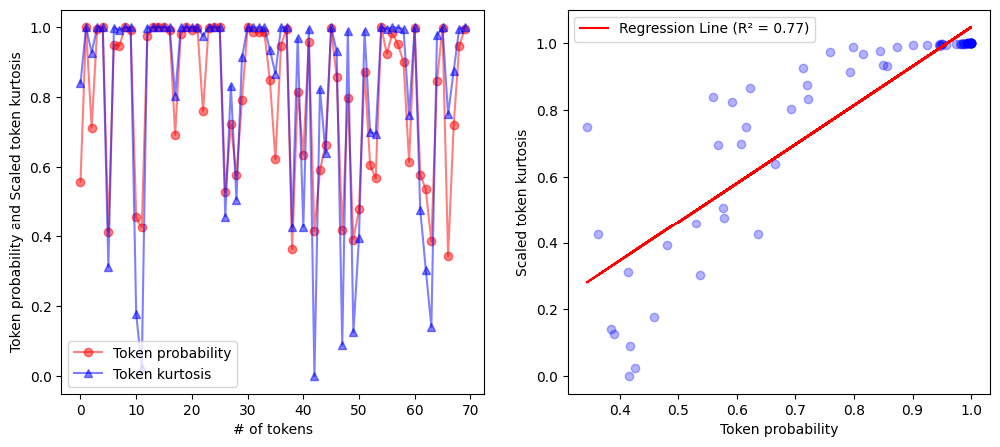

 37%|███▋      | 37/100 [00:23<00:40,  1.57it/s]

[Sentences]
   Input: translate English to German: I would therefore once more ask you to ensure that we get a Dutch channel as well.
   True Translation: Deshalb möchte ich Sie nochmals ersuchen, dafür Sorge zu tragen, daß auch ein niederländischer Sender eingespeist wird.
   Predicted Translation: Ich möchte Sie daher noch einmal bitten, dafür zu sorgen, dass wir auch einen niederländischen Kanal bekommen.

[Scores]
   BLEU score: 0.01927120047601988
   METEOR score: 0.23562251639484139
   ROUGE score: {'rouge1': Score(precision=0.45, recall=0.45, fmeasure=0.45), 'rouge2': Score(precision=0.10526315789473684, recall=0.10526315789473684, fmeasure=0.10526315789473684), 'rougeL': Score(precision=0.4, recall=0.4, fmeasure=0.4000000000000001)}
   BERT score: {'precision': [0.8932812213897705], 'recall': [0.8651646971702576], 'f1': [0.8789981603622437], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Con

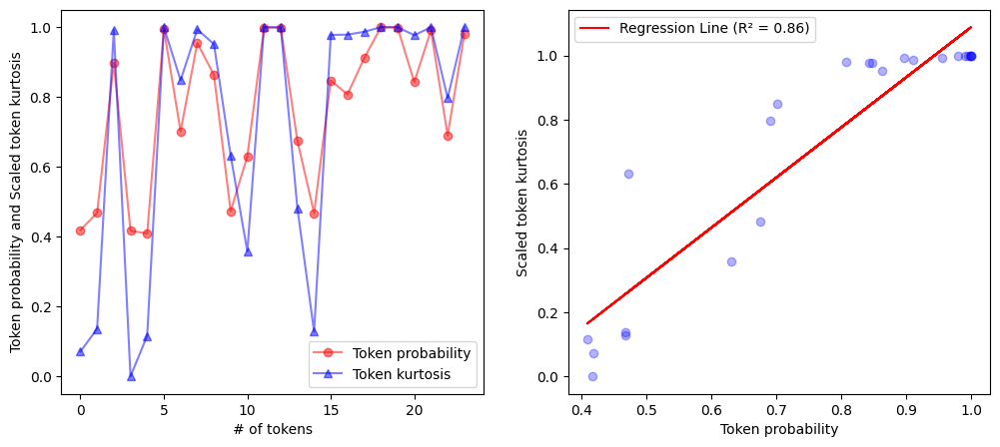

 38%|███▊      | 38/100 [00:23<00:35,  1.75it/s]

[Sentences]
   Input: translate English to German: Mrs Plooij-van Gorsel, I can tell you that this matter is on the agenda for the Quaestors' meeting on Wednesday.
   True Translation: Frau Plooij-van Gorsel, ich kann Ihnen mitteilen, daß dieser Punkt am Mittwoch auf der Tagesordnung der Quästoren steht.
   Predicted Translation: Frau Plooij-van Gorsel, ich kann Ihnen sagen, dass dieses Thema auf der Tagesordnung der Quästorensitzung am Mittwoch steht.

[Scores]
   BLEU score: 0.6620499926983077
   METEOR score: 0.7986623290024047
   ROUGE score: {'rouge1': Score(precision=0.75, recall=0.75, fmeasure=0.75), 'rouge2': Score(precision=0.5789473684210527, recall=0.5789473684210527, fmeasure=0.5789473684210527), 'rougeL': Score(precision=0.65, recall=0.65, fmeasure=0.65)}
   BERT score: {'precision': [0.9586262106895447], 'recall': [0.9629418253898621], 'f1': [0.9607791304588318], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Qua

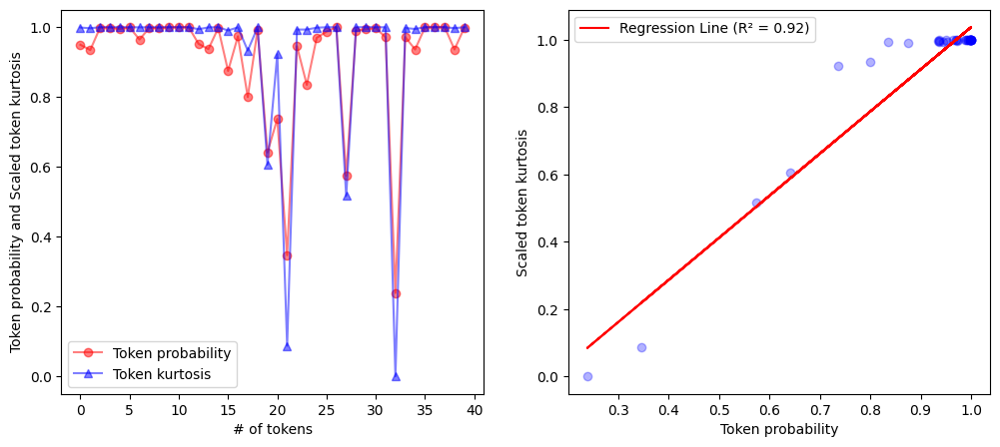

 39%|███▉      | 39/100 [00:24<00:34,  1.77it/s]

[Sentences]
   Input: translate English to German: It will, I hope, be examined in a positive light.
   True Translation: Ich hoffe, daß dort in Ihrem Sinne entschieden wird.
   Predicted Translation: Ich hoffe, dass er positiv geprüft wird.

[Scores]
   BLEU score: 0.2701368758820638
   METEOR score: 0.49929887820512825
   ROUGE score: {'rouge1': Score(precision=0.375, recall=0.3333333333333333, fmeasure=0.35294117647058826), 'rouge2': Score(precision=0.14285714285714285, recall=0.125, fmeasure=0.13333333333333333), 'rougeL': Score(precision=0.375, recall=0.3333333333333333, fmeasure=0.35294117647058826)}
   BERT score: {'precision': [0.9525841474533081], 'recall': [0.9116565585136414], 'f1': [0.931671142578125], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0.688
   [New UQ] Confidence-A-T (Arithmetic mean of token probability): 0.731
   [New 

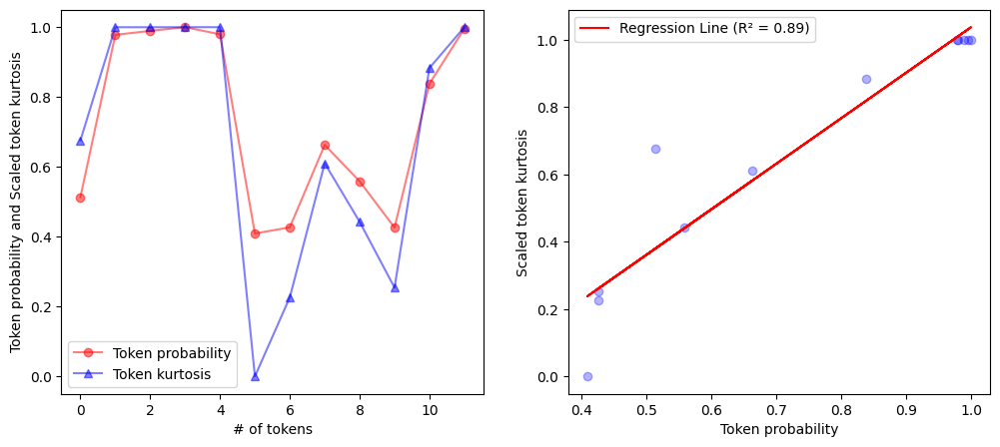

 40%|████      | 40/100 [00:24<00:28,  2.08it/s]

[Sentences]
   Input: translate English to German: Madam President, can you tell me why this Parliament does not adhere to the health and safety legislation that it actually passes?
   True Translation: Frau Präsidentin, können Sie mir sagen, warum sich dieses Parlament nicht an die Arbeitsschutzregelungen hält, die es selbst verabschiedet hat?
   Predicted Translation: Frau Präsidentin, können Sie mir sagen, warum dieses Parlament nicht an die Gesundheits- und Sicherheitsvorschriften hält, die es tatsächlich verabschiedet?

[Scores]
   BLEU score: 0.6278064625315194
   METEOR score: 0.7645924251870325
   ROUGE score: {'rouge1': Score(precision=0.7916666666666666, recall=0.8260869565217391, fmeasure=0.8085106382978724), 'rouge2': Score(precision=0.6521739130434783, recall=0.6818181818181818, fmeasure=0.6666666666666666), 'rougeL': Score(precision=0.7916666666666666, recall=0.8260869565217391, fmeasure=0.8085106382978724)}
   BERT score: {'precision': [0.9448704719543457], 'recall': [0.

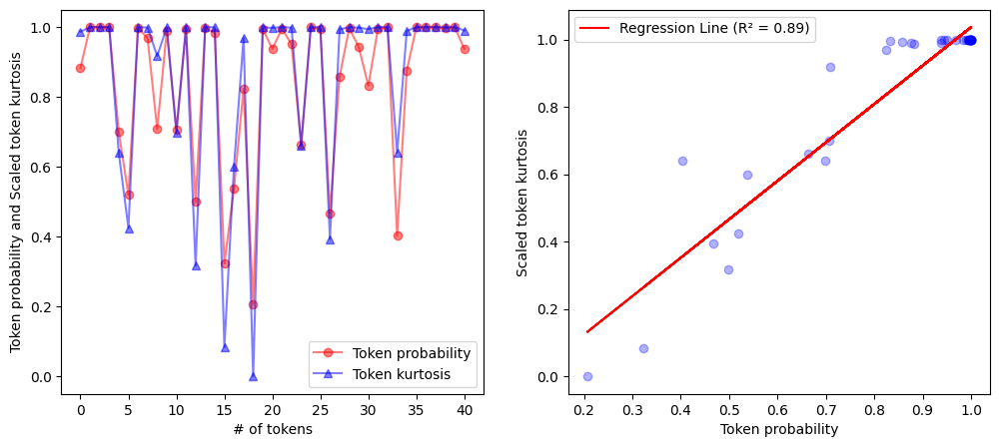

 41%|████      | 41/100 [00:24<00:29,  1.97it/s]

[Sentences]
   Input: translate English to German: Why has no air quality test been done on this particular building since we were elected?
   True Translation: Weshalb wurde die Luftqualität in diesem Gebäude seit unserer Wahl nicht ein einziges Mal überprüft?
   Predicted Translation: Warum wurde seit der Wahl dieses Hauses keine Luftqualitätsprüfung durchgeführt?

[Scores]
   BLEU score: 0.026401579304601113
   METEOR score: 0.2716049382716049
   ROUGE score: {'rouge1': Score(precision=0.3076923076923077, recall=0.2222222222222222, fmeasure=0.2580645161290323), 'rouge2': Score(precision=0.0, recall=0.0, fmeasure=0.0), 'rougeL': Score(precision=0.23076923076923078, recall=0.16666666666666666, fmeasure=0.1935483870967742)}
   BERT score: {'precision': [0.8895041346549988], 'recall': [0.8604714870452881], 'f1': [0.8747469782829285], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geom

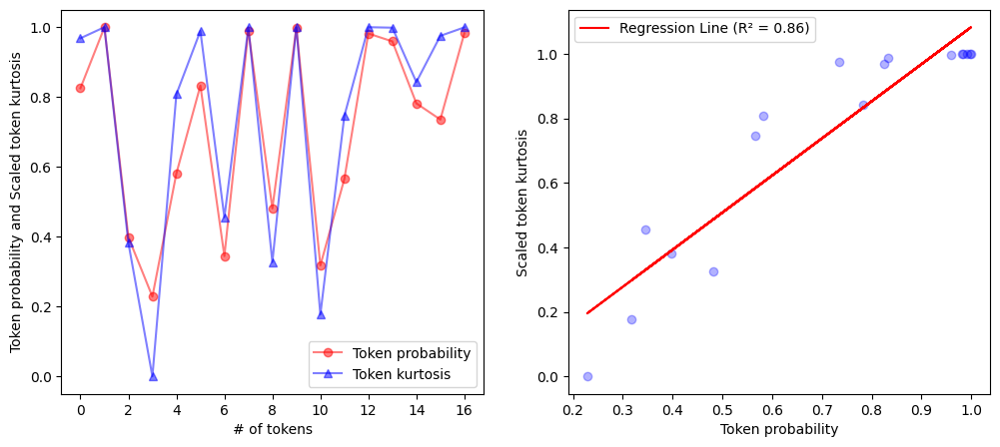

 42%|████▏     | 42/100 [00:25<00:26,  2.20it/s]

[Sentences]
   Input: translate English to German: Why has there been no Health and Safety Committee meeting since 1998?
   True Translation: Weshalb ist der Arbeitsschutzausschuß seit 1998 nicht ein einziges Mal zusammengetreten?
   Predicted Translation: Warum hat es seit 1998 keine Sitzung des Ausschusses für Gesundheit und Sicherheit gegeben?

[Scores]
   BLEU score: 0.019900763312868126
   METEOR score: 0.154718137254902
   ROUGE score: {'rouge1': Score(precision=0.13333333333333333, recall=0.18181818181818182, fmeasure=0.15384615384615383), 'rouge2': Score(precision=0.07142857142857142, recall=0.1, fmeasure=0.08333333333333333), 'rougeL': Score(precision=0.13333333333333333, recall=0.18181818181818182, fmeasure=0.15384615384615383)}
   BERT score: {'precision': [0.8398088216781616], 'recall': [0.821766197681427], 'f1': [0.8306894898414612], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confid

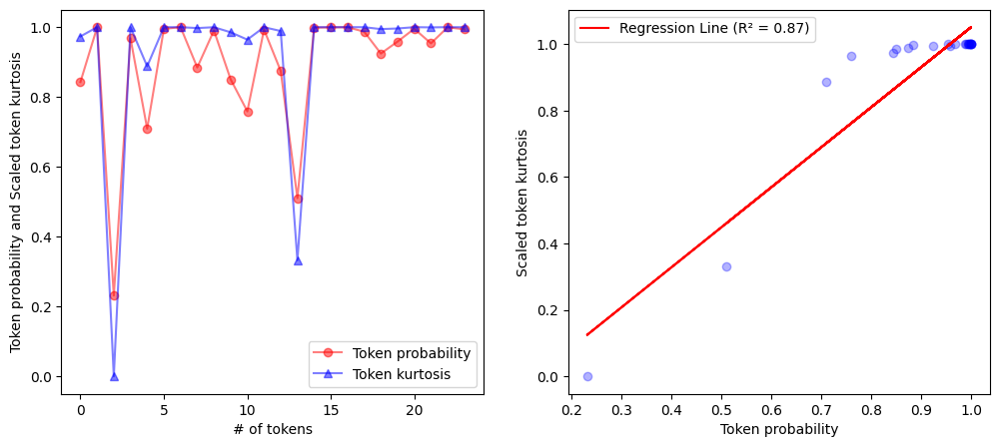

 43%|████▎     | 43/100 [00:25<00:25,  2.26it/s]

[Sentences]
   Input: translate English to German: Why has there been no fire drill, either in the Brussels Parliament buildings or the Strasbourg Parliament buildings?
   True Translation: Warum hat weder im Brüsseler noch im Straßburger Parlamentsgebäude eine Brandschutzübung stattgefunden?
   Predicted Translation: Warum gab es keine Feuerbohrerei, weder in den Gebäuden des Parlaments von Brüssel noch in den Gebäuden des Parlaments von Straßburg?

[Scores]
   BLEU score: 0.02395467218728699
   METEOR score: 0.42070355679823135
   ROUGE score: {'rouge1': Score(precision=0.2, recall=0.3125, fmeasure=0.24390243902439027), 'rouge2': Score(precision=0.0, recall=0.0, fmeasure=0.0), 'rougeL': Score(precision=0.2, recall=0.3125, fmeasure=0.24390243902439027)}
   BERT score: {'precision': [0.8385679721832275], 'recall': [0.8506450057029724], 'f1': [0.8445633053779602], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
 

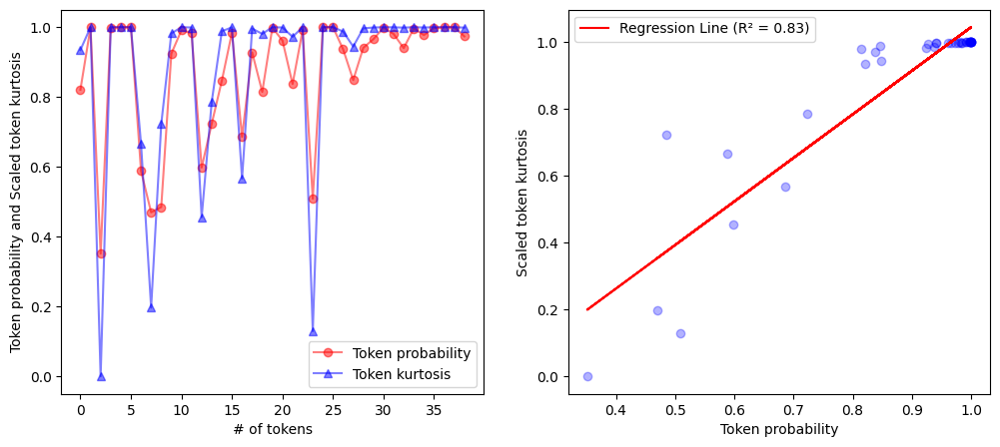

 44%|████▍     | 44/100 [00:26<00:26,  2.11it/s]

[Sentences]
   Input: translate English to German: Why are there no fire instructions?
   True Translation: Warum finden keine Brandschutzbelehrungen statt?
   Predicted Translation: Warum gibt es keine Brandanweisungen?

[Scores]
   BLEU score: 0.053863663688318665
   METEOR score: 0.33513513513513515
   ROUGE score: {'rouge1': Score(precision=0.4, recall=0.4, fmeasure=0.4000000000000001), 'rouge2': Score(precision=0.0, recall=0.0, fmeasure=0.0), 'rougeL': Score(precision=0.4, recall=0.4, fmeasure=0.4000000000000001)}
   BERT score: {'precision': [0.9284241199493408], 'recall': [0.9278013706207275], 'f1': [0.9281126260757446], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0.856
   [New UQ] Confidence-A-T (Arithmetic mean of token probability): 0.875
   [New UQ] Confidence-A-K (Arithmetic mean of kurtosis): 0.882


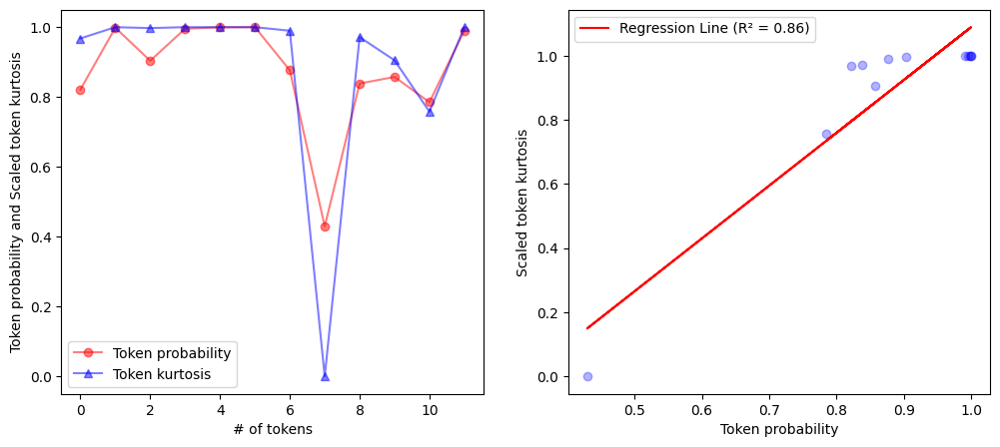

 45%|████▌     | 45/100 [00:26<00:23,  2.36it/s]

[Sentences]
   Input: translate English to German: Why have the staircases not been improved since my accident?
   True Translation: Warum wurde nach meinem Unfall nichts unternommen, um die Treppen sicherer zu machen?
   Predicted Translation: Warum wurden die Treppen seit meinem Unfall nicht verbessert?

[Scores]
   BLEU score: 0.16614547630545648
   METEOR score: 0.5063932636831436
   ROUGE score: {'rouge1': Score(precision=0.6666666666666666, recall=0.46153846153846156, fmeasure=0.5454545454545455), 'rouge2': Score(precision=0.375, recall=0.25, fmeasure=0.3), 'rougeL': Score(precision=0.4444444444444444, recall=0.3076923076923077, fmeasure=0.3636363636363637)}
   BERT score: {'precision': [0.9317464828491211], 'recall': [0.9005247950553894], 'f1': [0.9158695936203003], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0.845
   [New UQ] Confidenc

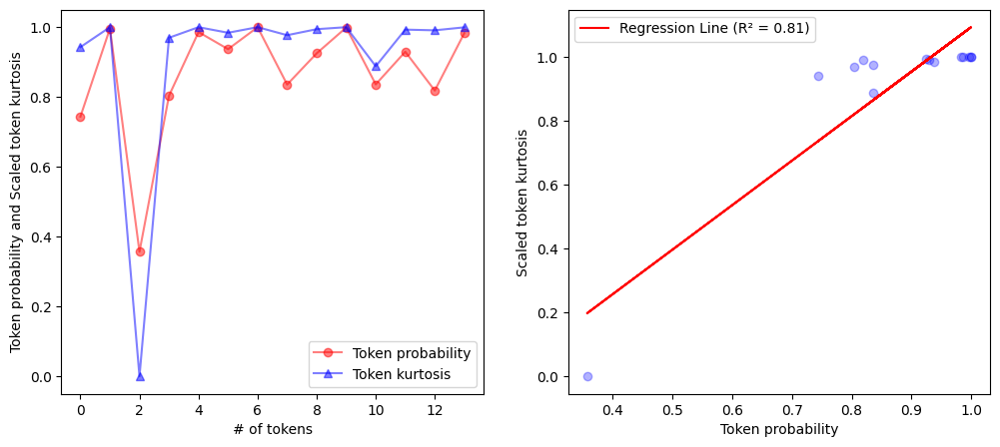

 46%|████▌     | 46/100 [00:26<00:20,  2.59it/s]

[Sentences]
   Input: translate English to German: Why are no-smoking areas not enforced?
   True Translation: Warum wird in den Nichtraucherzonen das Rauchverbot nicht durchgesetzt?
   Predicted Translation: Warum werden Nichtraucherzonen nicht durchgesetzt?

[Scores]
   BLEU score: 0.3501806396568502
   METEOR score: 0.625771824831386
   ROUGE score: {'rouge1': Score(precision=0.8, recall=0.4444444444444444, fmeasure=0.5714285714285714), 'rouge2': Score(precision=0.25, recall=0.125, fmeasure=0.16666666666666666), 'rougeL': Score(precision=0.8, recall=0.4444444444444444, fmeasure=0.5714285714285714)}
   BERT score: {'precision': [0.9792022109031677], 'recall': [0.9209327697753906], 'f1': [0.9491740465164185], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0.771
   [New UQ] Confidence-A-T (Arithmetic mean of token probability): 0.831
   [New UQ] 

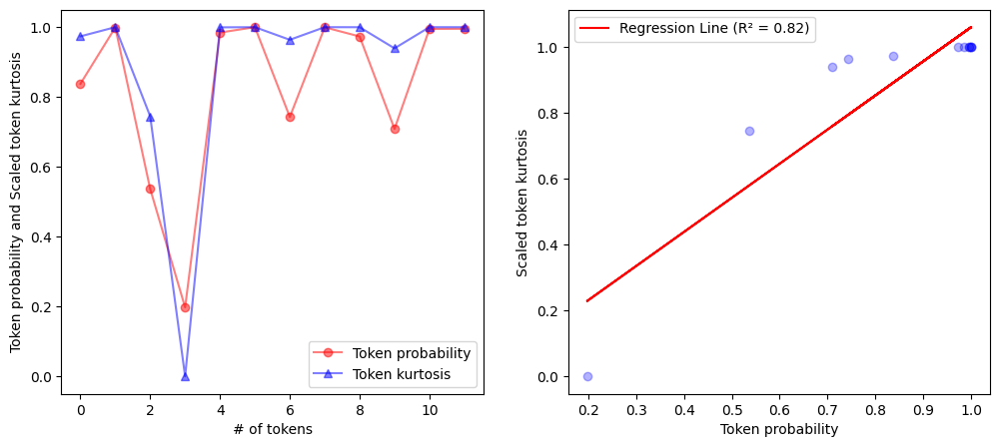

 47%|████▋     | 47/100 [00:27<00:19,  2.75it/s]

[Sentences]
   Input: translate English to German: It seems absolutely disgraceful that we pass legislation and do not adhere to it ourselves.
   True Translation: Es ist eine Schande, daß wir Regeln verabschieden, an die wir uns dann selbst nicht halten.
   Predicted Translation: Es erscheint absolut schändlich, dass wir Gesetze verabschieden und uns nicht an sie halten.

[Scores]
   BLEU score: 0.17052366006318445
   METEOR score: 0.43986616385684707
   ROUGE score: {'rouge1': Score(precision=0.4666666666666667, recall=0.4375, fmeasure=0.45161290322580644), 'rouge2': Score(precision=0.0, recall=0.0, fmeasure=0.0), 'rougeL': Score(precision=0.4, recall=0.375, fmeasure=0.38709677419354843)}
   BERT score: {'precision': [0.9063072800636292], 'recall': [0.9142051339149475], 'f1': [0.910239040851593], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0

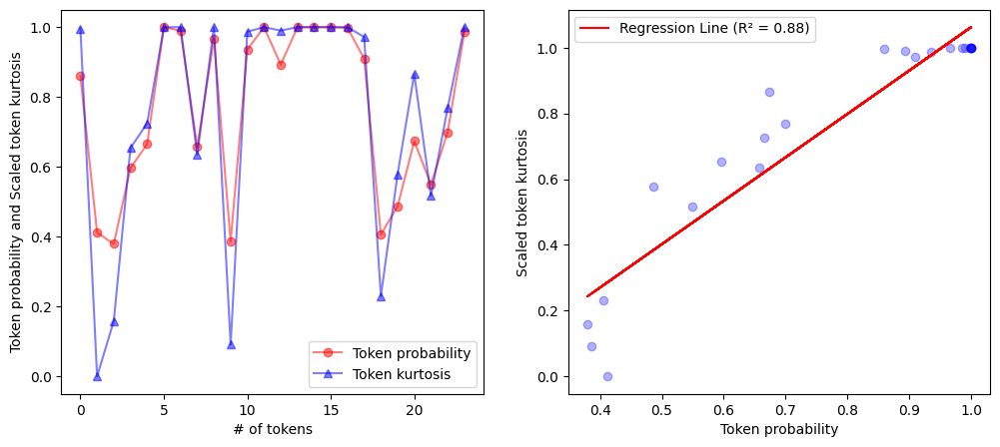

 48%|████▊     | 48/100 [00:27<00:19,  2.69it/s]

[Sentences]
   Input: translate English to German: Mrs Lynne, you are quite right and I shall check whether this has actually not been done.
   True Translation: Frau Lynne, Sie haben völlig recht, und ich werde prüfen, ob all dies wirklich so ist.
   Predicted Translation: Frau Lynne, Sie haben völlig Recht, und ich werde prüfen, ob dies tatsächlich nicht getan wurde.

[Scores]
   BLEU score: 0.6142883568508891
   METEOR score: 0.7687074829931974
   ROUGE score: {'rouge1': Score(precision=0.7368421052631579, recall=0.7777777777777778, fmeasure=0.7567567567567567), 'rouge2': Score(precision=0.6666666666666666, recall=0.7058823529411765, fmeasure=0.6857142857142857), 'rougeL': Score(precision=0.7368421052631579, recall=0.7777777777777778, fmeasure=0.7567567567567567)}
   BERT score: {'precision': [0.9519786238670349], 'recall': [0.9538963437080383], 'f1': [0.9529365301132202], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quan

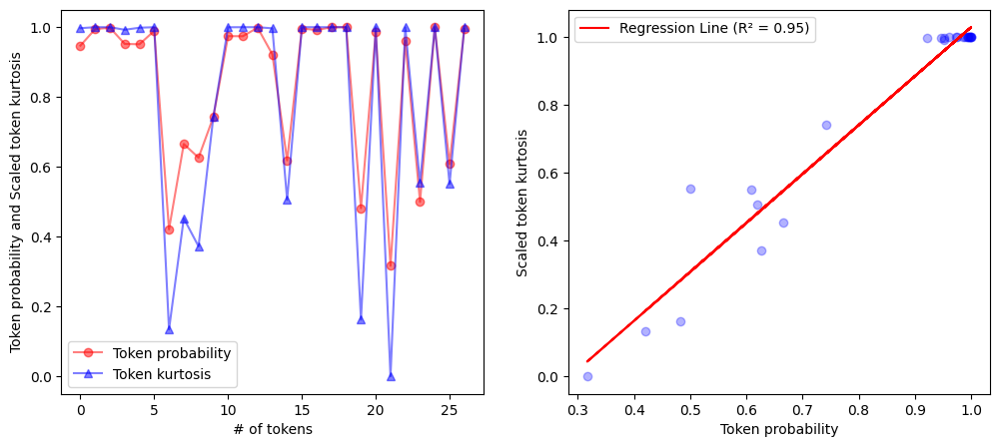

 49%|████▉     | 49/100 [00:27<00:20,  2.53it/s]

[Sentences]
   Input: translate English to German: I shall also refer the matter to the College of Quaestors, and I am certain that they will be keen to ensure that we comply with the regulations we ourselves vote on.
   True Translation: Ich werde die Frage auch den Quästoren unterbreiten. Ich bin mir sicher, daß diese großen Wert darauf legen, daß wir die Rechtsvorschriften, die wir verabschieden, auch selbst einhalten.
   Predicted Translation: Ich werde die Angelegenheit auch an das Kollegium der Quästoren verweisen, und ich bin sicher, dass sie darauf achten werden, dass wir die von uns selbst abgegebenen Verordnungen einhalten.

[Scores]
   BLEU score: 0.10509016330154164
   METEOR score: 0.3437334656084656
   ROUGE score: {'rouge1': Score(precision=0.4666666666666667, recall=0.4666666666666667, fmeasure=0.4666666666666667), 'rouge2': Score(precision=0.1724137931034483, recall=0.1724137931034483, fmeasure=0.1724137931034483), 'rougeL': Score(precision=0.4666666666666667, recall=0

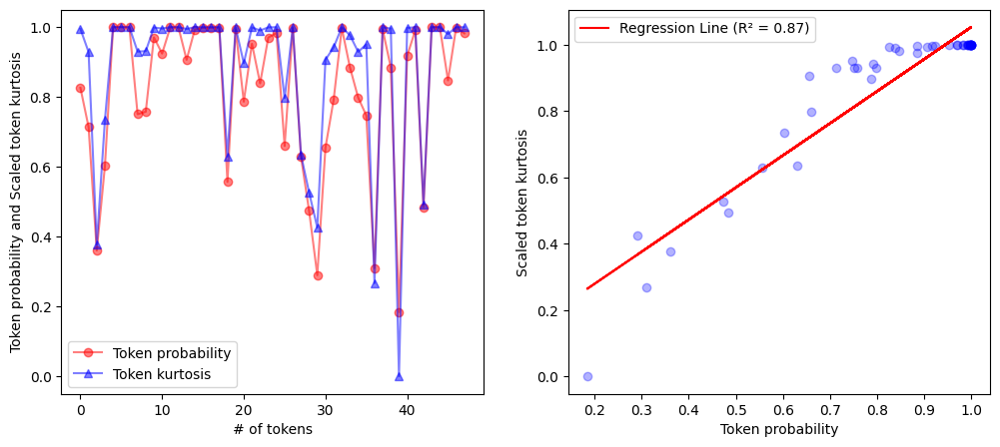

 50%|█████     | 50/100 [00:28<00:23,  2.16it/s]

[Sentences]
   Input: translate English to German: Madam President, Mrs Díez González and I had tabled questions on certain opinions of the Vice-President, Mrs de Palacio, which appeared in a Spanish newspaper.
   True Translation: Frau Präsidentin! Frau Díez González und ich hatten einige Anfragen zu bestimmten, in einer spanischen Zeitung wiedergegebenen Stellungnahmen der Vizepräsidentin, Frau de Palacio, gestellt.
   Predicted Translation: Frau Präsidentin, Frau Dez González und ich hatten Fragen zu bestimmten Stellungnahmen der Vizepräsidentin, Frau de Palacio, eingereicht, die in einer spanischen Zeitung erschienen sind.

[Scores]
   BLEU score: 0.5706273219444289
   METEOR score: 0.743143090915559
   ROUGE score: {'rouge1': Score(precision=0.7857142857142857, recall=0.7857142857142857, fmeasure=0.7857142857142857), 'rouge2': Score(precision=0.6296296296296297, recall=0.6296296296296297, fmeasure=0.6296296296296297), 'rougeL': Score(precision=0.6428571428571429, recall=0.64285714

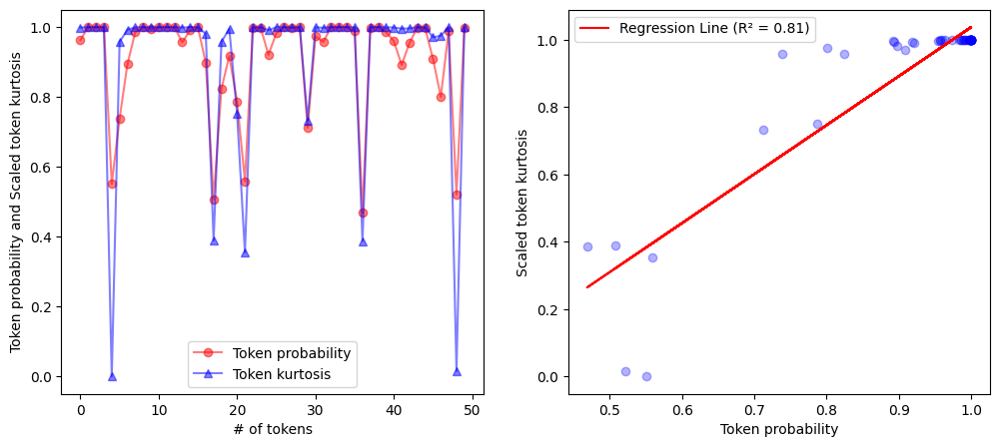

 51%|█████     | 51/100 [00:29<00:26,  1.83it/s]

[Sentences]
   Input: translate English to German: The competent services have not included them in the agenda on the grounds that they had been answered in a previous part-session.
   True Translation: Die zuständigen Dienste haben sie nicht in die Tagesordnung aufgenommen, da sie der Meinung waren, sie seien schon in einer vorangegangenen Sitzung beantwortet worden.
   Predicted Translation: Die zuständigen Dienststellen haben sie nicht auf die Tagesordnung gesetzt, weil sie in einer früheren Sitzung beantwortet worden waren.

[Scores]
   BLEU score: 0.36672627226706395
   METEOR score: 0.611490158193455
   ROUGE score: {'rouge1': Score(precision=0.7142857142857143, recall=0.6, fmeasure=0.6521739130434783), 'rouge2': Score(precision=0.4, recall=0.3333333333333333, fmeasure=0.3636363636363636), 'rougeL': Score(precision=0.6666666666666666, recall=0.56, fmeasure=0.6086956521739131)}
   BERT score: {'precision': [0.9605869054794312], 'recall': [0.9315440654754639], 'f1': [0.945842623710

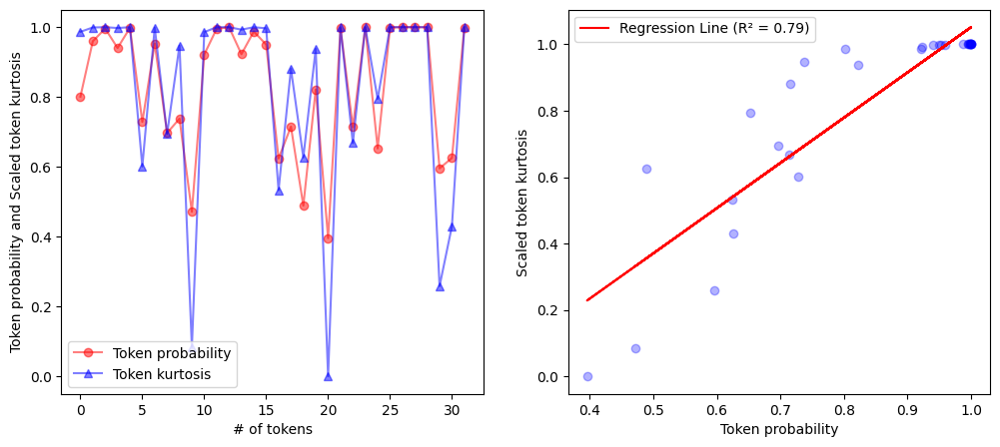

 52%|█████▏    | 52/100 [00:29<00:25,  1.85it/s]

[Sentences]
   Input: translate English to German: I would ask that they reconsider, since this is not the case.
   True Translation: Ich bitte, diese Entscheidung zu überdenken, weil das nicht der Fall ist.
   Predicted Translation: Ich bitte sie, sich noch einmal zu überlegen, denn das ist nicht der Fall.

[Scores]
   BLEU score: 0.08991396351259592
   METEOR score: 0.6310013717421126
   ROUGE score: {'rouge1': Score(precision=0.5714285714285714, recall=0.6666666666666666, fmeasure=0.6153846153846153), 'rouge2': Score(precision=0.23076923076923078, recall=0.2727272727272727, fmeasure=0.24999999999999994), 'rougeL': Score(precision=0.5, recall=0.5833333333333334, fmeasure=0.5384615384615384)}
   BERT score: {'precision': [0.9370827078819275], 'recall': [0.940060019493103], 'f1': [0.9385690093040466], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability)

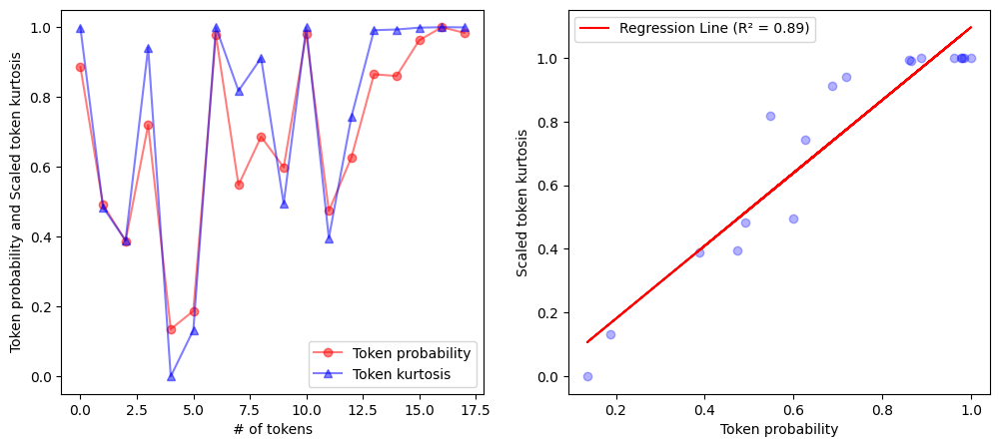

 53%|█████▎    | 53/100 [00:30<00:22,  2.05it/s]

[Sentences]
   Input: translate English to German: The questions answered previously referred to Mrs de Palacio' s intervention, on another occasion, and not to these comments which appeared in the ABC newspaper on 18 November.
   True Translation: Die früher beantworteten Anfragen bezogen sich auf das Auftreten von Frau de Palacio in einer bestimmten Angelegenheit, nicht auf die am 18. November des vergangenen Jahres in der Tageszeitung ABC erschienenen Erklärungen.
   Predicted Translation: Die zuvor beantworteten Fragen betrafen die Rede von Frau de Palacio bei einer anderen Gelegenheit, und nicht diese Bemerkungen, die in der ABC-Zeitung am 18. November erschienen sind.

[Scores]
   BLEU score: 0.21292368561944858
   METEOR score: 0.4500121477162294
   ROUGE score: {'rouge1': Score(precision=0.5172413793103449, recall=0.4411764705882353, fmeasure=0.47619047619047616), 'rouge2': Score(precision=0.21428571428571427, recall=0.18181818181818182, fmeasure=0.19672131147540986), 'rougeL':

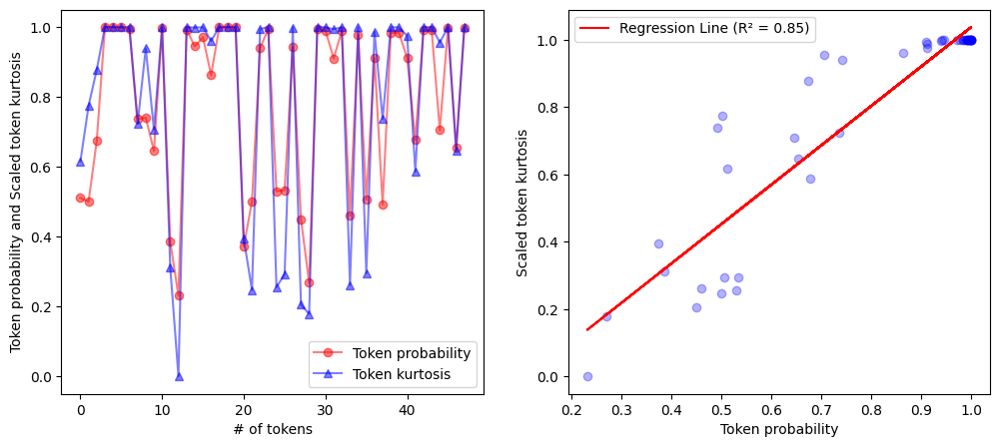

 54%|█████▍    | 54/100 [00:30<00:24,  1.89it/s]

[Sentences]
   Input: translate English to German: Mr Berenguer Fuster, we shall check all this.
   True Translation: Lieber Kollege, wir werden das prüfen.
   Predicted Translation: Herr Berenguer Fuster, wir werden das alles überprüfen.

[Scores]
   BLEU score: 0.2044800736021839
   METEOR score: 0.4699029126213592
   ROUGE score: {'rouge1': Score(precision=0.4444444444444444, recall=0.5714285714285714, fmeasure=0.5), 'rouge2': Score(precision=0.25, recall=0.3333333333333333, fmeasure=0.28571428571428575), 'rougeL': Score(precision=0.4444444444444444, recall=0.5714285714285714, fmeasure=0.5)}
   BERT score: {'precision': [0.8707045912742615], 'recall': [0.8908119797706604], 'f1': [0.8806435465812683], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0.791
   [New UQ] Confidence-A-T (Arithmetic mean of token probability): 0.83
   [New UQ] Confiden

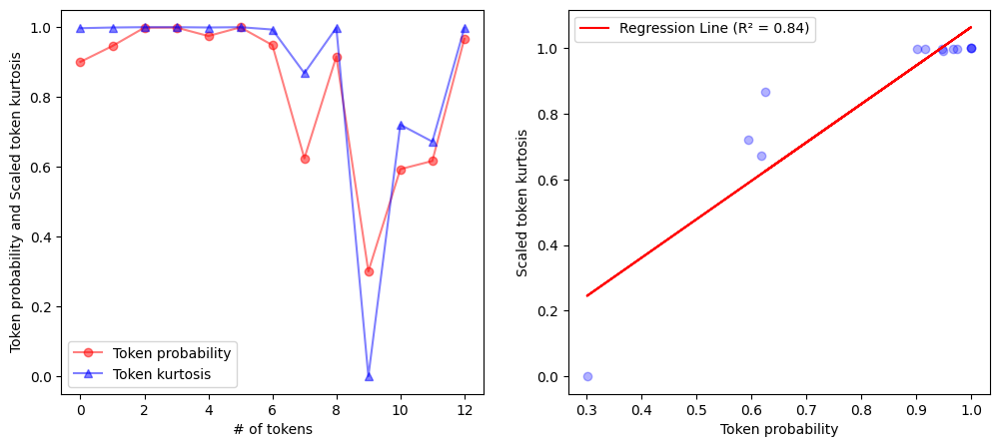

 55%|█████▌    | 55/100 [00:31<00:20,  2.14it/s]

[Sentences]
   Input: translate English to German: I admit that, at present, the matter seems to be somewhat confused.
   True Translation: Ich muß Ihnen aber sagen, daß ich die Lage im Moment für etwas verworren halte.
   Predicted Translation: Ich gebe zu, dass die Angelegenheit derzeit etwas verwirrt ist.

[Scores]
   BLEU score: 0.019605856964583376
   METEOR score: 0.16853315766359245
   ROUGE score: {'rouge1': Score(precision=0.3, recall=0.1875, fmeasure=0.23076923076923075), 'rouge2': Score(precision=0.0, recall=0.0, fmeasure=0.0), 'rougeL': Score(precision=0.3, recall=0.1875, fmeasure=0.23076923076923075)}
   BERT score: {'precision': [0.881462574005127], 'recall': [0.8778930902481079], 'f1': [0.8796741962432861], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0.716
   [New UQ] Confidence-A-T (Arithmetic mean of token probability): 0.761


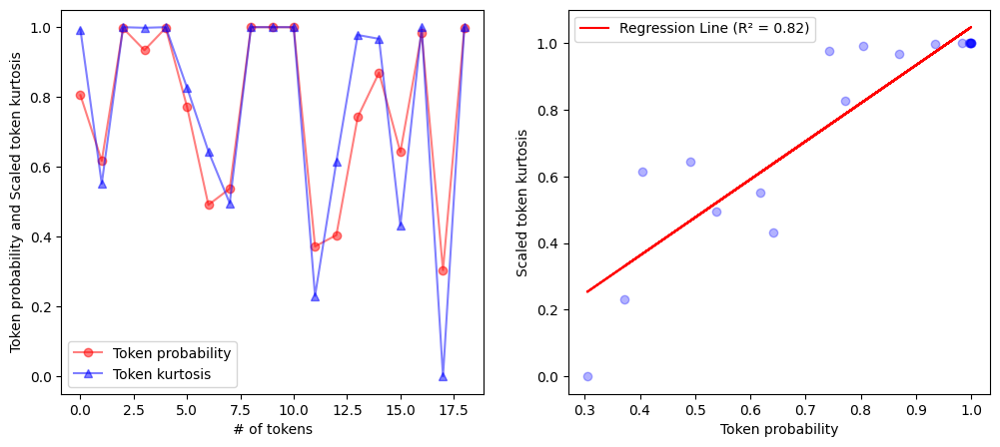

 56%|█████▌    | 56/100 [00:31<00:18,  2.32it/s]

[Sentences]
   Input: translate English to German: We shall therefore look into it properly to ensure that everything is as it should be.
   True Translation: Wir werden das aber sehr genau prüfen, damit alles seine Richtigkeit hat.
   Predicted Translation: Wir werden deshalb angemessen prüfen, um sicherzustellen, dass alles so ist, wie es sein sollte.

[Scores]
   BLEU score: 0.026058929270445657
   METEOR score: 0.31481139053254437
   ROUGE score: {'rouge1': Score(precision=0.375, recall=0.46153846153846156, fmeasure=0.41379310344827586), 'rouge2': Score(precision=0.13333333333333333, recall=0.16666666666666666, fmeasure=0.14814814814814814), 'rougeL': Score(precision=0.375, recall=0.46153846153846156, fmeasure=0.41379310344827586)}
   BERT score: {'precision': [0.8682640790939331], 'recall': [0.8973854780197144], 'f1': [0.8825846314430237], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confiden

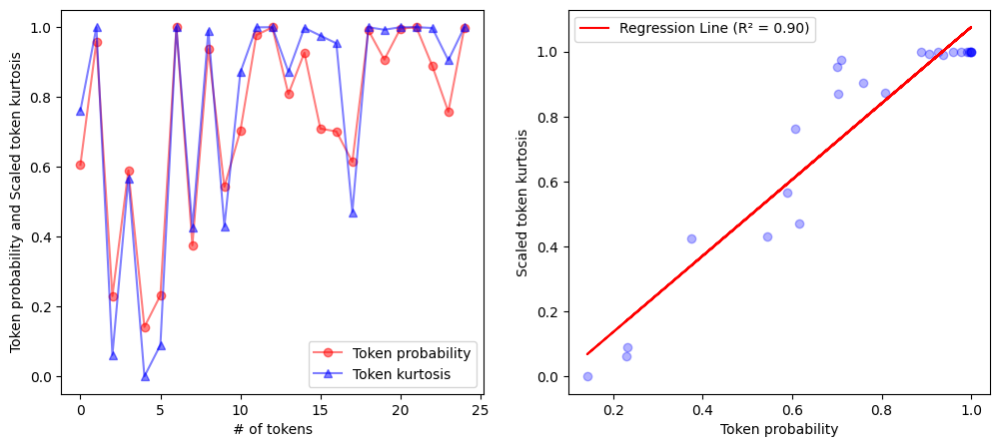

 57%|█████▋    | 57/100 [00:32<00:21,  1.97it/s]

[Sentences]
   Input: translate English to German: Madam President, I should like to know if there will be a clear message going out from Parliament this week about our discontent over today's decision refusing to renew the arms embargo on Indonesia, considering that the vast majority in this Parliament have endorsed the arms embargo in Indonesia in the past?
   True Translation: Frau Präsidentin, ich wüßte gern, ob das Parlament in dieser Woche ein deutliches Signal unserer Unzufriedenheit bezüglich der heutigen Entscheidung, mit der eine Verlängerung des Waffenembargos gegen Indonesien abgelehnt wird, aussenden wird, zumal sich die große Mehrheit in diesem Parlament in der Vergangenheit für das Waffenembargo gegen Indonesien ausgesprochen hat.
   Predicted Translation: Frau Präsidentin, ich möchte wissen, ob das Parlament diese Woche eine klare Botschaft über unsere Unzufriedenheit über die heutige Entscheidung, das Waffenembargo gegen Indonesien zu verlängern, aussenden wird, da die

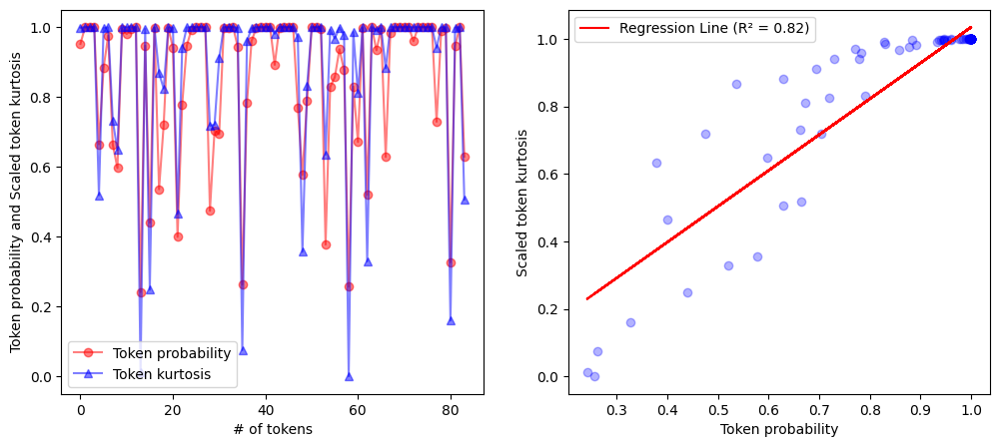

 58%|█████▊    | 58/100 [00:33<00:27,  1.52it/s]

[Sentences]
   Input: translate English to German: Today's decision not to renew the embargo is extremely dangerous considering the situation there.
   True Translation: Die heutige Entscheidung gegen eine Verlängerung des Embargos birgt angesichts der dortigen Lage eine sehr große Gefahr.
   Predicted Translation: Die heutige Entscheidung, das Embargo nicht zu verlängern, ist angesichts der dortigen Situation äußerst gefährlich.

[Scores]
   BLEU score: 0.3243708545154253
   METEOR score: 0.6245161290322581
   ROUGE score: {'rouge1': Score(precision=0.4444444444444444, recall=0.42105263157894735, fmeasure=0.43243243243243246), 'rouge2': Score(precision=0.23529411764705882, recall=0.2222222222222222, fmeasure=0.22857142857142856), 'rougeL': Score(precision=0.3888888888888889, recall=0.3684210526315789, fmeasure=0.37837837837837834)}
   BERT score: {'precision': [0.8862224221229553], 'recall': [0.9127122163772583], 'f1': [0.8992722630500793], 'hashcode': 'distilbert-base-multilingual-ca

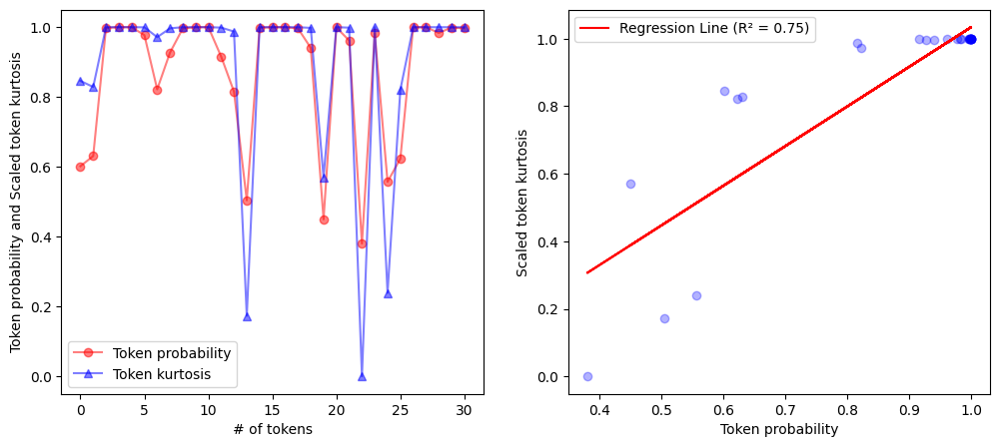

 59%|█████▉    | 59/100 [00:33<00:25,  1.61it/s]

[Sentences]
   Input: translate English to German: So Parliament should send a message, since that is the wish of the vast majority.
   True Translation: Das Parlament sollte, da dies dem Wunsch der großen Mehrheit entspricht, eine entsprechende Botschaft senden.
   Predicted Translation: Das Parlament sollte also eine Botschaft senden, denn das ist der Wunsch der großen Mehrheit.

[Scores]
   BLEU score: 0.2981539343390949
   METEOR score: 0.6664529914529915
   ROUGE score: {'rouge1': Score(precision=0.6875, recall=0.6875, fmeasure=0.6875), 'rouge2': Score(precision=0.4666666666666667, recall=0.4666666666666667, fmeasure=0.4666666666666667), 'rougeL': Score(precision=0.5, recall=0.5, fmeasure=0.5)}
   BERT score: {'precision': [0.9475178718566895], 'recall': [0.9469395875930786], 'f1': [0.9472286701202393], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token proba

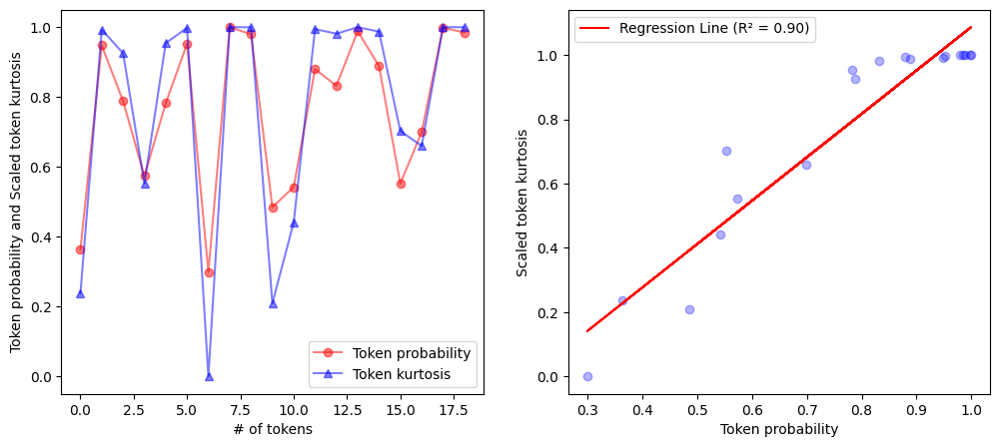

 60%|██████    | 60/100 [00:34<00:21,  1.85it/s]

[Sentences]
   Input: translate English to German: It is irresponsible of EU Member States to refuse to renew the embargo.
   True Translation: Die Ablehnung einer Verlängerung des Embargos seitens der EU-Mitgliedstaaten ist unverantwortlich.
   Predicted Translation: Es ist unverantwortlich, dass die EU-Mitgliedstaaten sich weigern, das Embargo zu erneuern.

[Scores]
   BLEU score: 0.22291343499214064
   METEOR score: 0.49811035525321234
   ROUGE score: {'rouge1': Score(precision=0.46153846153846156, recall=0.46153846153846156, fmeasure=0.46153846153846156), 'rouge2': Score(precision=0.16666666666666666, recall=0.16666666666666666, fmeasure=0.16666666666666666), 'rougeL': Score(precision=0.23076923076923078, recall=0.23076923076923078, fmeasure=0.23076923076923078)}
   BERT score: {'precision': [0.8884593844413757], 'recall': [0.9144628047943115], 'f1': [0.9012735486030579], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quan

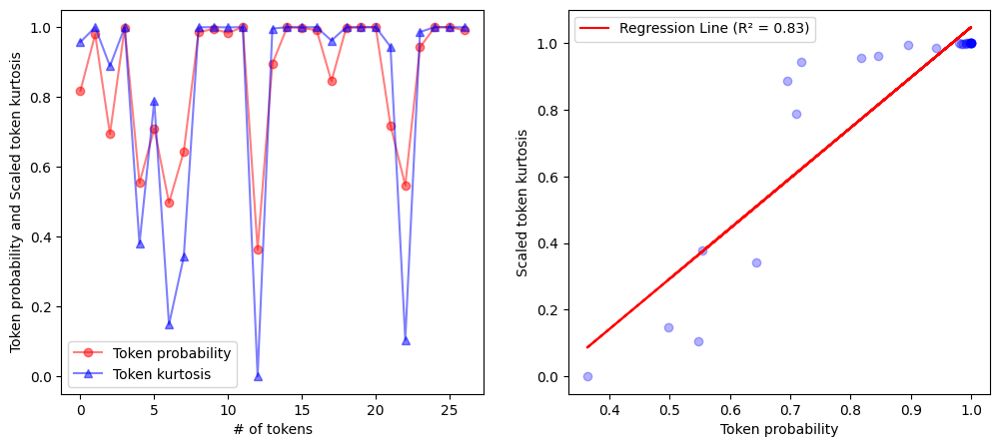

 61%|██████    | 61/100 [00:34<00:20,  1.93it/s]

[Sentences]
   Input: translate English to German: As people have said, the situation there is extremely volatile.
   True Translation: Wie bereits festgestellt wurde, ist die Lage in Indonesien äußerst instabil.
   Predicted Translation: Wie die Menschen gesagt haben, ist die Situation dort äußerst schwach.

[Scores]
   BLEU score: 0.09139750812578326
   METEOR score: 0.39682539682539686
   ROUGE score: {'rouge1': Score(precision=0.4166666666666667, recall=0.4166666666666667, fmeasure=0.4166666666666667), 'rouge2': Score(precision=0.18181818181818182, recall=0.18181818181818182, fmeasure=0.18181818181818182), 'rougeL': Score(precision=0.4166666666666667, recall=0.4166666666666667, fmeasure=0.4166666666666667)}
   BERT score: {'precision': [0.89743971824646], 'recall': [0.8972532153129578], 'f1': [0.8973464369773865], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of t

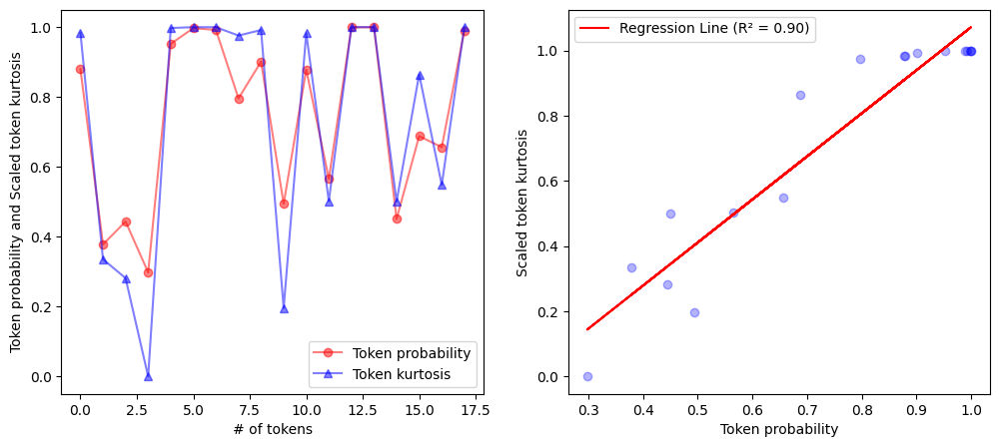

 62%|██████▏   | 62/100 [00:34<00:17,  2.13it/s]

[Sentences]
   Input: translate English to German: There is, in fact, a risk of a military coup in the future.
   True Translation: Es besteht sogar die Gefahr eines Militärputsches.
   Predicted Translation: Tatsächlich besteht die Gefahr eines Militärputschs in der Zukunft.

[Scores]
   BLEU score: 0.39696685122270786
   METEOR score: 0.6971128045508211
   ROUGE score: {'rouge1': Score(precision=0.5454545454545454, recall=0.75, fmeasure=0.631578947368421), 'rouge2': Score(precision=0.4, recall=0.5714285714285714, fmeasure=0.47058823529411764), 'rougeL': Score(precision=0.5454545454545454, recall=0.75, fmeasure=0.631578947368421)}
   BERT score: {'precision': [0.9099432229995728], 'recall': [0.9544345140457153], 'f1': [0.9316580295562744], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0.851
   [New UQ] Confidence-A-T (Arithmetic mean of token p

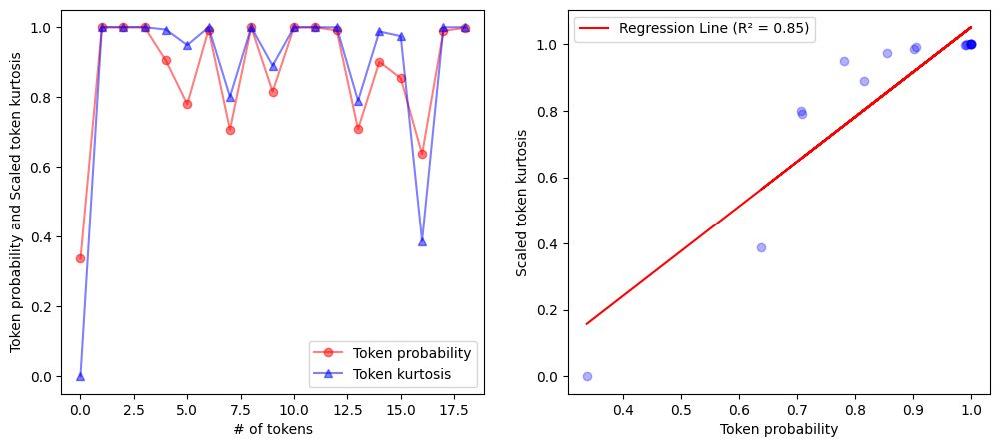

 63%|██████▎   | 63/100 [00:35<00:16,  2.25it/s]

[Sentences]
   Input: translate English to German: We do not know what is happening.
   True Translation: Wir wissen nicht, was passiert.
   Predicted Translation: Wir wissen nicht, was geschieht.

[Scores]
   BLEU score: 0.4671379777282001
   METEOR score: 0.8179012345679012
   ROUGE score: {'rouge1': Score(precision=0.8, recall=0.8, fmeasure=0.8000000000000002), 'rouge2': Score(precision=0.75, recall=0.75, fmeasure=0.75), 'rougeL': Score(precision=0.8, recall=0.8, fmeasure=0.8000000000000002)}
   BERT score: {'precision': [0.9396321773529053], 'recall': [0.9660032391548157], 'f1': [0.9526352882385254], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0.885
   [New UQ] Confidence-A-T (Arithmetic mean of token probability): 0.904
   [New UQ] Confidence-A-K (Arithmetic mean of kurtosis): 0.886


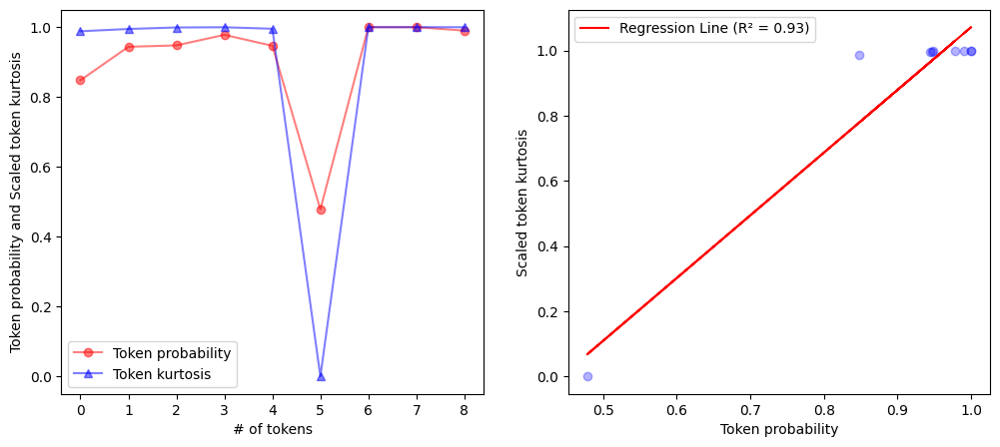

 64%|██████▍   | 64/100 [00:35<00:13,  2.60it/s]

[Sentences]
   Input: translate English to German: So why should EU arms producers profit at the expense of innocent people?
   True Translation: Weshalb also sollten Waffenhersteller in der EU auf Kosten unschuldiger Menschen Profite einstreichen?
   Predicted Translation: Warum also sollten die Waffenproduzenten der EU auf Kosten unschuldiger Menschen profitieren?

[Scores]
   BLEU score: 0.3589569926201256
   METEOR score: 0.5402650356778795
   ROUGE score: {'rouge1': Score(precision=0.6666666666666666, recall=0.6153846153846154, fmeasure=0.64), 'rouge2': Score(precision=0.5454545454545454, recall=0.5, fmeasure=0.5217391304347826), 'rougeL': Score(precision=0.6666666666666666, recall=0.6153846153846154, fmeasure=0.64)}
   BERT score: {'precision': [0.9131739139556885], 'recall': [0.9111899137496948], 'f1': [0.9121808409690857], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geomet

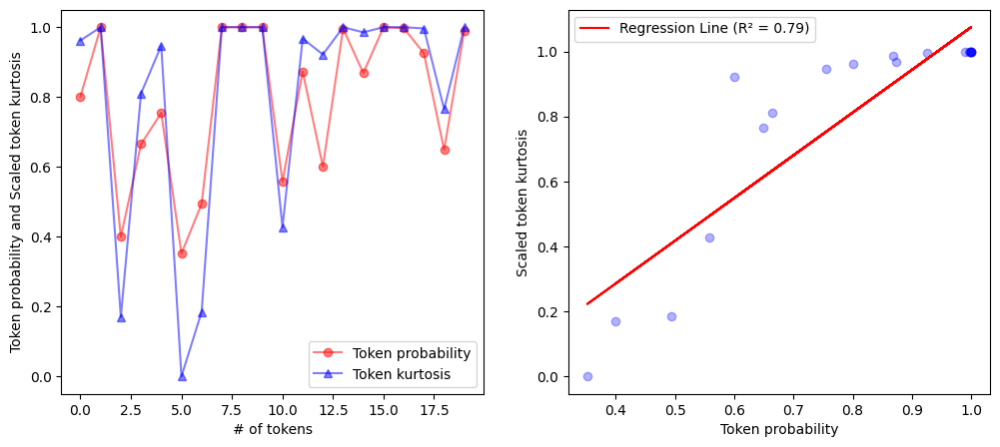

 65%|██████▌   | 65/100 [00:35<00:13,  2.61it/s]

[Sentences]
   Input: translate English to German: In any event, this question is not presently included among the requests for topical and urgent debate on Thursday.
   True Translation: Dieser Punkt ist bisher nicht für die Dringlichkeitsdebatte am Donnerstag vorgesehen.
   Predicted Translation: Auf jeden Fall wird diese Frage derzeit nicht in die Dringlichkeitsdebatte am Donnerstag aufgenommen.

[Scores]
   BLEU score: 0.5278627722123207
   METEOR score: 0.672972972972973
   ROUGE score: {'rouge1': Score(precision=0.35714285714285715, recall=0.4166666666666667, fmeasure=0.3846153846153846), 'rouge2': Score(precision=0.23076923076923078, recall=0.2727272727272727, fmeasure=0.24999999999999994), 'rougeL': Score(precision=0.35714285714285715, recall=0.4166666666666667, fmeasure=0.3846153846153846)}
   BERT score: {'precision': [0.9339746832847595], 'recall': [0.9513272643089294], 'f1': [0.9425711035728455], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_t

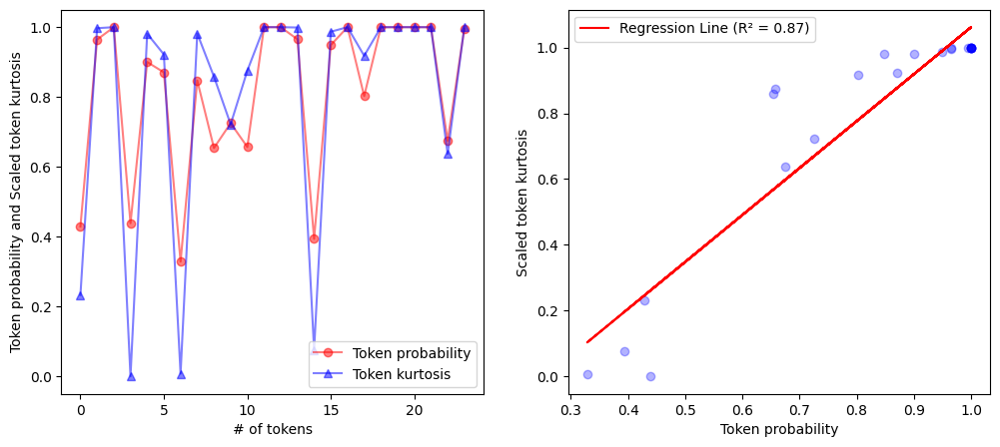

 66%|██████▌   | 66/100 [00:36<00:13,  2.58it/s]

[Sentences]
   Input: translate English to German: Agenda
   True Translation: Arbeitsplan
   Predicted Translation: Tagesordnung

[Scores]
   BLEU score: 0
   METEOR score: 0.0
   ROUGE score: {'rouge1': Score(precision=0.0, recall=0.0, fmeasure=0.0), 'rouge2': Score(precision=0.0, recall=0.0, fmeasure=0.0), 'rougeL': Score(precision=0.0, recall=0.0, fmeasure=0.0)}
   BERT score: {'precision': [0.8757650852203369], 'recall': [0.8488802909851074], 'f1': [0.8621131181716919], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0.951
   [New UQ] Confidence-A-T (Arithmetic mean of token probability): 0.952
   [New UQ] Confidence-A-K (Arithmetic mean of kurtosis): 0.5


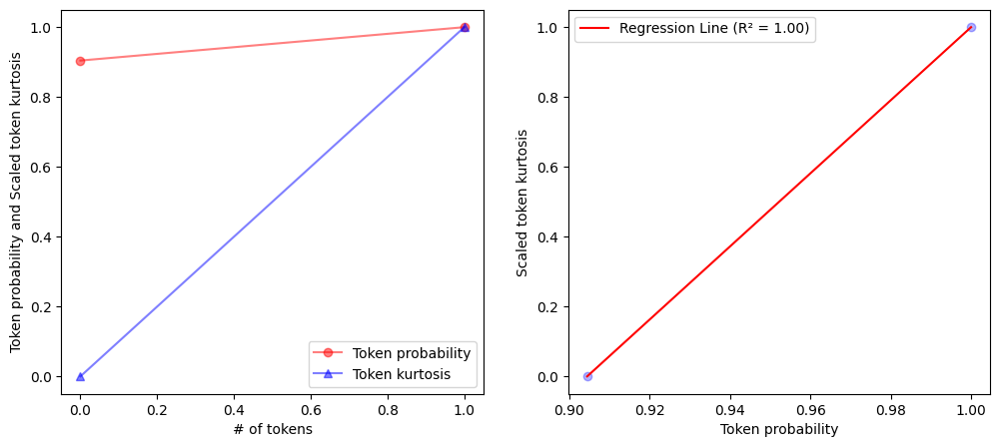

 67%|██████▋   | 67/100 [00:36<00:11,  2.97it/s]

[Sentences]
   Input: translate English to German: The next item is the verification of the final version of the draft agenda as drawn up by the Conference of Presidents at its meeting of 13 January pursuant to Rule 110 of the Rules of Procedure.
   True Translation: Nach der Tagesordnung folgt die Prüfung des endgültigen Entwurfs der Tagesordnung, wie er nach Artikel 110 der Geschäftsordnung am Donnerstag, dem 13. Januar von der Konferenz der Präsidenten festgelegt wurde.
   Predicted Translation: Nach der Tagesordnung folgt die Prüfung der endgültigen Fassung des Entwurfs der Tagesordnung, wie sie von der Konferenz der Präsidenten auf ihrer Sitzung vom 13. Januar gemäß Artikel 110 der Geschäftsordnung erstellt wurde.

[Scores]
   BLEU score: 0.5156328152440274
   METEOR score: 0.7327492408906884
   ROUGE score: {'rouge1': Score(precision=0.7567567567567568, recall=0.8235294117647058, fmeasure=0.7887323943661971), 'rouge2': Score(precision=0.5555555555555556, recall=0.6060606060606061

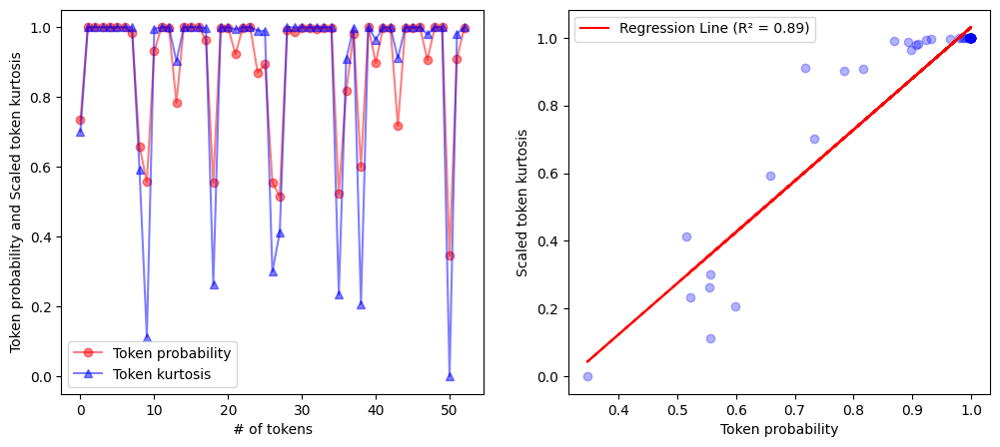

 68%|██████▊   | 68/100 [00:37<00:13,  2.29it/s]

[Sentences]
   Input: translate English to German: No amendments have been proposed relating to Monday and Tuesday.
   True Translation: Zu Montag und Dienstag liegen keine Änderungen vor.
   Predicted Translation: Es wurden keine nderungsanträge zu Montag und Dienstag vorgeschlagen.

[Scores]
   BLEU score: 0.08326915667169545
   METEOR score: 0.6521739130434784
   ROUGE score: {'rouge1': Score(precision=0.5, recall=0.625, fmeasure=0.5555555555555556), 'rouge2': Score(precision=0.3333333333333333, recall=0.42857142857142855, fmeasure=0.375), 'rougeL': Score(precision=0.4, recall=0.5, fmeasure=0.4444444444444445)}
   BERT score: {'precision': [0.8984770178794861], 'recall': [0.9499542713165283], 'f1': [0.9234988689422607], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0.792
   [New UQ] Confidence-A-T (Arithmetic mean of token probability): 0.833

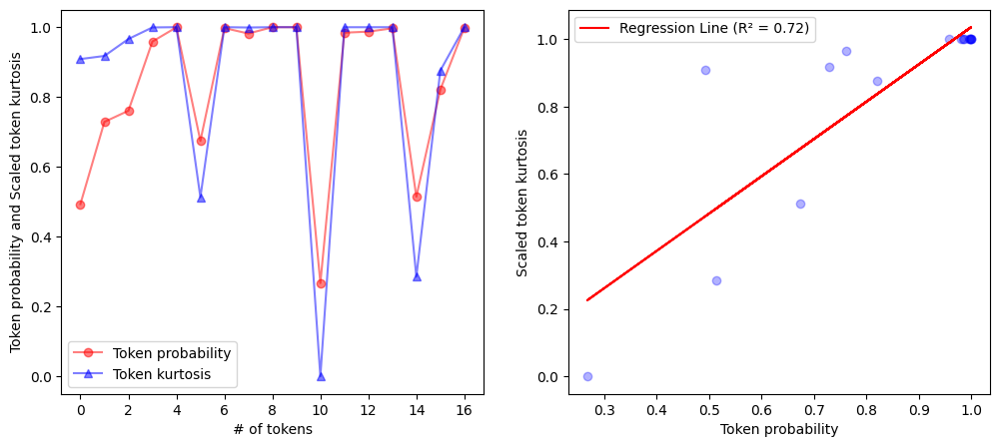

 69%|██████▉   | 69/100 [00:37<00:12,  2.41it/s]

[Sentences]
   Input: translate English to German: Relating to Wednesday:
   True Translation: Zum Mittwoch:
   Predicted Translation: Zum Mittwoch:

[Scores]
   BLEU score: 1.0
   METEOR score: 0.996
   ROUGE score: {'rouge1': Score(precision=1.0, recall=1.0, fmeasure=1.0), 'rouge2': Score(precision=1.0, recall=1.0, fmeasure=1.0), 'rougeL': Score(precision=1.0, recall=1.0, fmeasure=1.0)}
   BERT score: {'precision': [1.0], 'recall': [1.0], 'f1': [1.0], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0.875
   [New UQ] Confidence-A-T (Arithmetic mean of token probability): 0.9
   [New UQ] Confidence-A-K (Arithmetic mean of kurtosis): 0.8


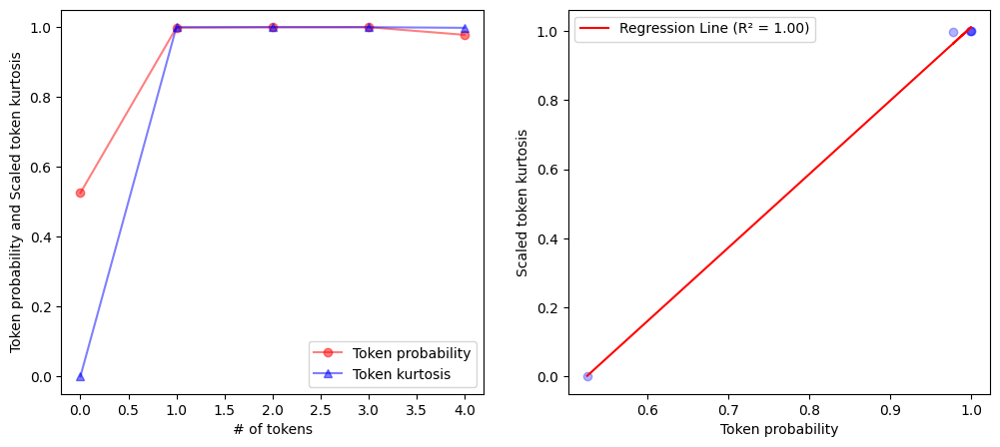

 70%|███████   | 70/100 [00:37<00:10,  2.81it/s]

[Sentences]
   Input: translate English to German: The Group of the Party of European Socialists requests that a Commission statement be included on its strategic objectives for the next five years and on the administrative reform of the Commission.
   True Translation: Die Sozialdemokratische Fraktion beantragt, eine Erklärung der Kommission über ihre strategischen Ziele für die nächsten fünf Jahre sowie über die Verwaltungsreform der Kommission in die Tagesordnung aufzunehmen.
   Predicted Translation: Die Fraktion der Sozialdemokratischen Partei Europas fordert, dass eine Erklärung der Kommission zu ihren strategischen Zielen für die nächsten fünf Jahre und zur Verwaltungsreform der Kommission aufgenommen wird.

[Scores]
   BLEU score: 0.4069521654960039
   METEOR score: 0.6357394923766004
   ROUGE score: {'rouge1': Score(precision=0.59375, recall=0.6129032258064516, fmeasure=0.6031746031746031), 'rouge2': Score(precision=0.41935483870967744, recall=0.43333333333333335, fmeasure=0.4

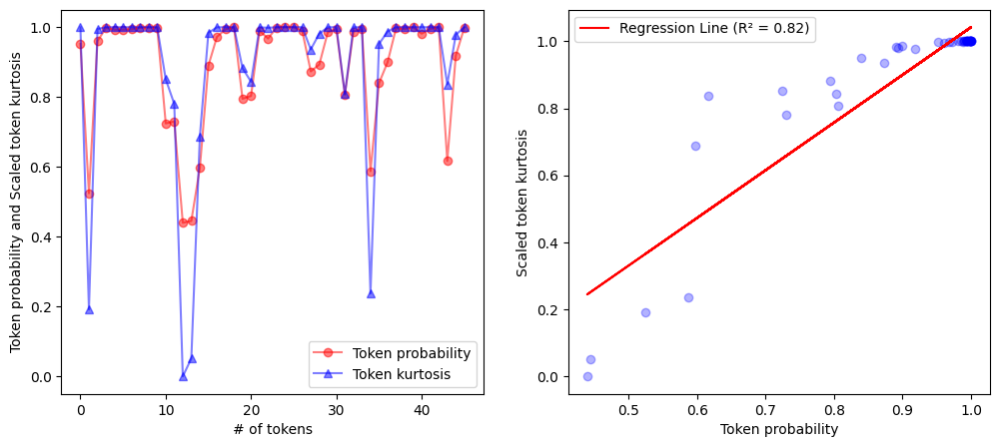

 71%|███████   | 71/100 [00:38<00:12,  2.27it/s]

[Sentences]
   Input: translate English to German: I would like Mr Barón Crespo, who made the request, to speak to propose it. That is, if he so wishes, of course.
   True Translation: Ich bitte den Antragsteller, Herrn Barón Crespo, seinen Antrag zu begründen, falls er dies wünscht.
   Predicted Translation: Ich möchte, dass Herr Barón Crespo, der dies beantragt hat, das Wort ergreifen möchte, um es vorzuschlagen, und das ist natürlich, wenn er das wünscht.

[Scores]
   BLEU score: 0.21881898345389014
   METEOR score: 0.5678335964342094
   ROUGE score: {'rouge1': Score(precision=0.26666666666666666, recall=0.4444444444444444, fmeasure=0.33333333333333337), 'rouge2': Score(precision=0.10344827586206896, recall=0.17647058823529413, fmeasure=0.13043478260869565), 'rougeL': Score(precision=0.23333333333333334, recall=0.3888888888888889, fmeasure=0.2916666666666667)}
   BERT score: {'precision': [0.8791245818138123], 'recall': [0.8925294280052185], 'f1': [0.8857762813568115], 'hashcode': '

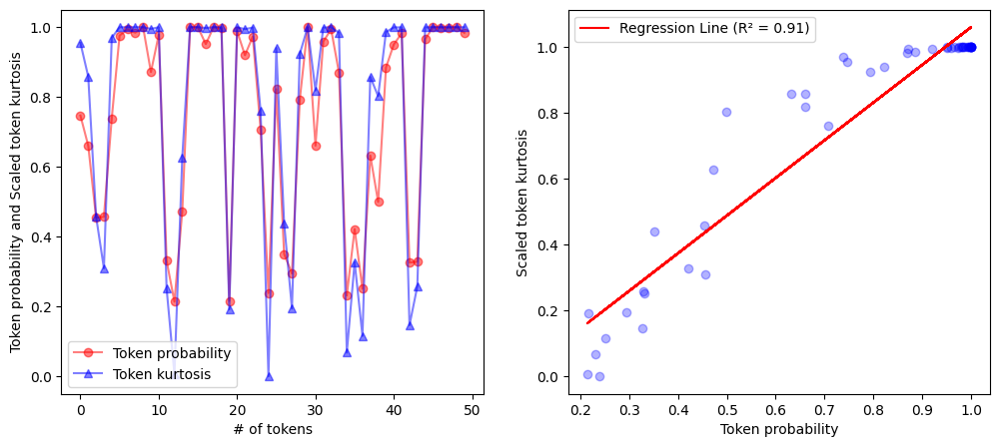

 72%|███████▏  | 72/100 [00:39<00:14,  1.89it/s]

[Sentences]
   Input: translate English to German: Then we shall follow the usual procedure, hearing one speaker in favour and one against.
   True Translation: Danach verfahren wir wie üblich: ein Redner dafür, einer dagegen.
   Predicted Translation: Dann werden wir das übliche Verfahren verfolgen, indem wir einen Redner dafür und einen dagegen hören.

[Scores]
   BLEU score: 0.056586356745712406
   METEOR score: 0.414621448757995
   ROUGE score: {'rouge1': Score(precision=0.3888888888888889, recall=0.6363636363636364, fmeasure=0.4827586206896552), 'rouge2': Score(precision=0.11764705882352941, recall=0.2, fmeasure=0.14814814814814817), 'rougeL': Score(precision=0.3333333333333333, recall=0.5454545454545454, fmeasure=0.41379310344827586)}
   BERT score: {'precision': [0.8891798853874207], 'recall': [0.909014105796814], 'f1': [0.8989876508712769], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Conf

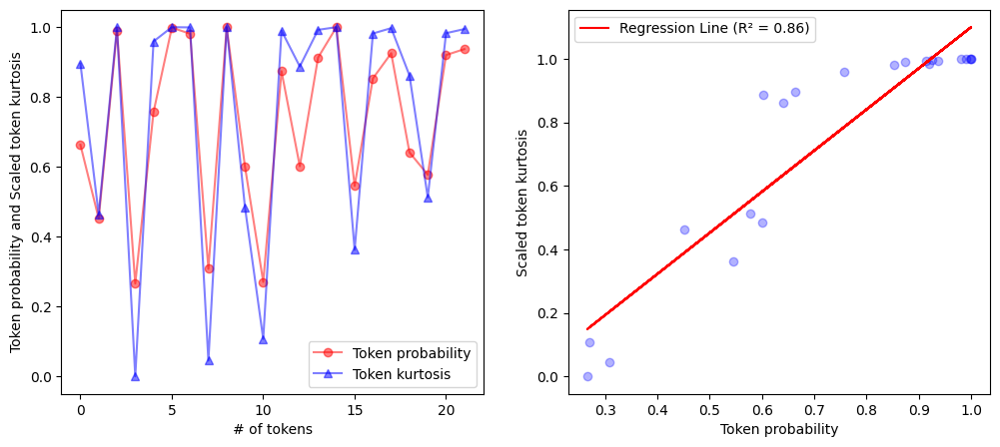

 73%|███████▎  | 73/100 [00:39<00:13,  2.00it/s]

[Sentences]
   Input: translate English to German: Madam President, the presentation of the Prodi Commission' s political programme for the whole legislature was initially a proposal by the Group of the Party of European Socialists which was unanimously approved by the Conference of Presidents in September and which was also explicitly accepted by President Prodi, who reiterated his commitment in his inaugural speech.
   True Translation: Frau Präsidentin! Die Vorstellung des politischen Programms der Kommission Prodi für die gesamte Wahlperiode ging auf einen Vorschlag der Fraktion der Sozialdemokratischen Partei Europas zurück, der die einhellige Billigung der Konferenz der Präsidenten im September und auch die ausdrückliche Zustimmung von Präsident Prodi fand, der seine Zusage in seiner Antrittsrede bekräftigte.
   Predicted Translation: Frau Präsidentin, die Vorstellung des politischen Programms der Kommission Prodi für die gesamte Legislaturperiode war zunächst ein Vorschlag der F

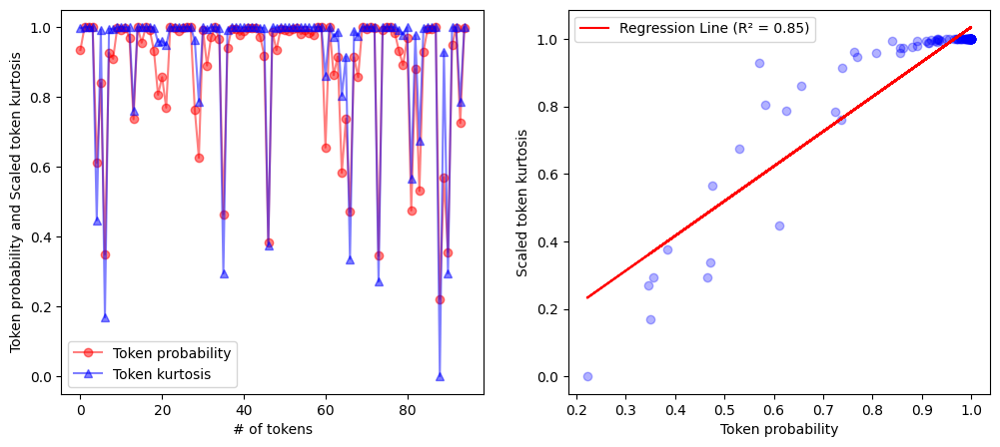

 74%|███████▍  | 74/100 [00:40<00:19,  1.35it/s]

[Sentences]
   Input: translate English to German: This commitment is important because the Commission is a body with a monopoly of initiative in accordance with the Treaties and, therefore, basically dictates this Parliament' s political and legislative activity for the next five years.
   True Translation: Diese Zusage ist insofern von Bedeutung, als die Kommission ein Organ ist, das nach den Verträgen das Initiativmonopol besitzt und somit grundlegend die politische und legislative Tätigkeit dieses Parlaments in den nächsten fünf Jahren gestaltet.
   Predicted Translation: Diese Verpflichtung ist wichtig, denn die Kommission ist ein Initiativmonopol, das gemäß den Verträgen besteht und diktiert daher im Grunde die politische und legislative Tätigkeit dieses Parlaments für die nächsten fünf Jahre.

[Scores]
   BLEU score: 0.3432941759553923
   METEOR score: 0.59572326227086
   ROUGE score: {'rouge1': Score(precision=0.6486486486486487, recall=0.6153846153846154, fmeasure=0.6315789473

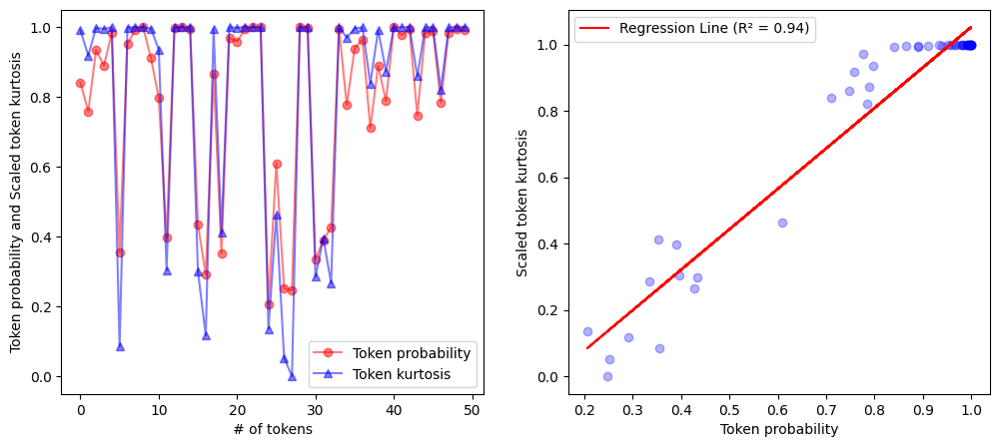

 75%|███████▌  | 75/100 [00:41<00:18,  1.35it/s]

[Sentences]
   Input: translate English to German: I would also like to point out, Madam President, that this Parliament voted to express its confidence in President Prodi during the previous legislature. It did so again during this legislature, in July, and then, in September, it voted once more to approve the whole Commission.
   True Translation: Ich möchte auch daran erinnern, daß dieses Parlament in der vorangegangenen Wahlperiode Präsident Prodi zweimal sein Vertrauen ausgesprochen hat; in dieser Wahlperiode sprach es ihm im Juli erneut sein Vertrauen aus, und dann, als die neue Kommission im Amt war, gab es im September erneut ein Vertrauensvotum für die Kommission insgesamt.
   Predicted Translation: Ich möchte auch darauf hinweisen, Frau Präsidentin, dass dieses Parlament in der vorangegangenen Legislaturperiode für Präsident Prodi gestimmt hat, und zwar während dieser Legislaturperiode, im Juli, und im September erneut für die Annahme der gesamten Kommission gestimmt hat.

[S

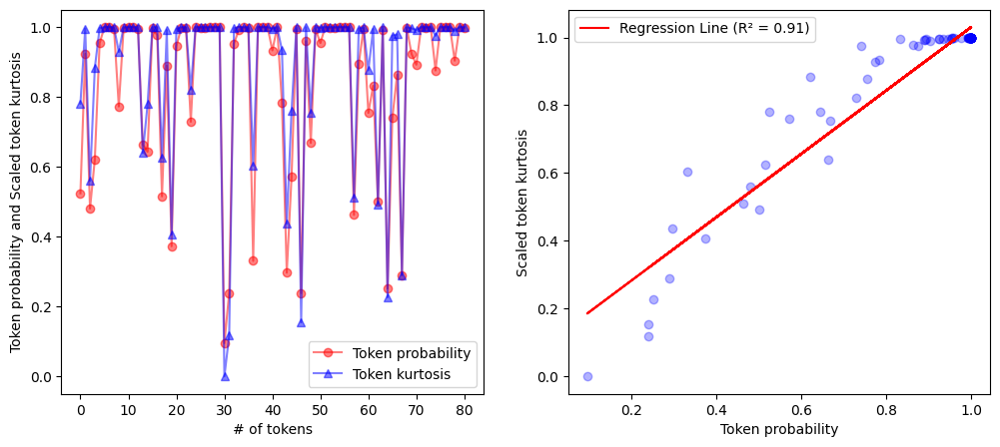

 76%|███████▌  | 76/100 [00:42<00:21,  1.12it/s]

[Sentences]
   Input: translate English to German: There has therefore been enough time for the Commission to prepare its programme and for us to become familiar with it and explain it to our citizens.
   True Translation: Somit hatte die Kommission bereits genügend Zeit, ihr Programm zu erarbeiten, und wir, um es kennenlernen und den Bürgern erklären zu können.
   Predicted Translation: Daher hat die Kommission genug Zeit gegeben, ihr Programm vorzubereiten und uns mit ihm vertraut zu machen und es unseren Bürgern zu erklären.

[Scores]
   BLEU score: 0.07382806265053332
   METEOR score: 0.48450292397660816
   ROUGE score: {'rouge1': Score(precision=0.56, recall=0.5384615384615384, fmeasure=0.5490196078431373), 'rouge2': Score(precision=0.16666666666666666, recall=0.16, fmeasure=0.16326530612244897), 'rougeL': Score(precision=0.48, recall=0.46153846153846156, fmeasure=0.47058823529411764)}
   BERT score: {'precision': [0.8925046920776367], 'recall': [0.8880603313446045], 'f1': [0.8902

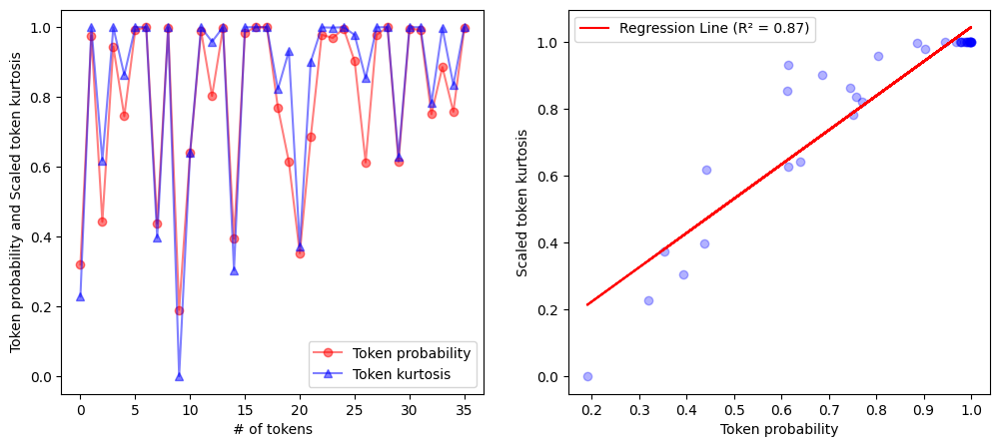

 77%|███████▋  | 77/100 [00:43<00:18,  1.23it/s]

[Sentences]
   Input: translate English to German: To this end, I would like to remind you of the resolution of 15 September, which recommended that the proposal be presented as soon as possible.
   True Translation: In diesem Sinne erinnere ich an die Entschließung vom 15. September, in der empfohlen wurde, den Vorschlag in der kürzestmöglichen Frist vorzulegen.
   Predicted Translation: Dazu möchte ich an die Entschließung vom 15. September erinnern, in der empfohlen wurde, den Vorschlag so schnell wie möglich vorzulegen.

[Scores]
   BLEU score: 0.4923313111853392
   METEOR score: 0.6134544920103185
   ROUGE score: {'rouge1': Score(precision=0.625, recall=0.6, fmeasure=0.6122448979591836), 'rouge2': Score(precision=0.5217391304347826, recall=0.5, fmeasure=0.5106382978723404), 'rougeL': Score(precision=0.625, recall=0.6, fmeasure=0.6122448979591836)}
   BERT score: {'precision': [0.9529556035995483], 'recall': [0.9187910556793213], 'f1': [0.9355615377426147], 'hashcode': 'distilbert-

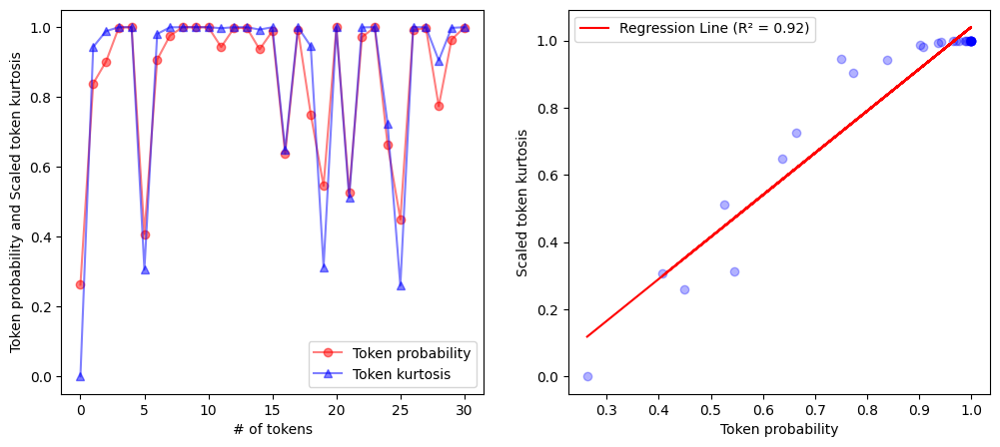

 78%|███████▊  | 78/100 [00:44<00:16,  1.33it/s]

[Sentences]
   Input: translate English to German: The events of last week - which originated outside the Conference of Presidents, that Conference being used simply to corroborate and ratify decisions taken elsewhere - present us with a dilemma. Either the Commission is not ready to present this programme, in which case it should clarify it.
   True Translation: Die Ereignisse der vergangenen Woche - die am Rande der Konferenz der Präsidenten ihren Anfang nahmen und wobei diese Konferenz nur zur Bestätigung und Ratifizierung von außerhalb gefaßten Beschlüssen genutzt wurde - verdeutlichen ein Dilemma: Entweder ist die Kommission nicht in der Lage, dieses Programm vorzulegen (In diesem Fall sollte sie eine Klärung herbeiführen.
   Predicted Translation: Die Ereignisse der vergangenen Woche - die außerhalb der Konferenz der Präsidenten entstanden sind, die eben dazu genutzt werden, die Entscheidungen anderswo zu korroborieren und zu ratifizieren - stellen uns ein Dilemma dar: Entweder i

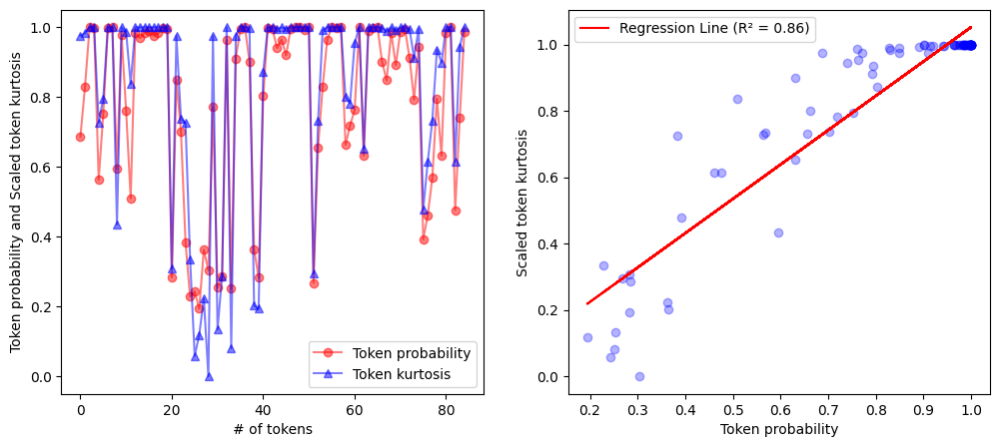

 79%|███████▉  | 79/100 [00:45<00:18,  1.11it/s]

[Sentences]
   Input: translate English to German: According to its President, it is in a position to do so.
   True Translation: Nach den Worten ihres Präsidenten ist sie dazu in der Lage.
   Predicted Translation: Dem Präsidenten zufolge ist es in der Lage, dies zu tun.

[Scores]
   BLEU score: 0.09379601158083607
   METEOR score: 0.47034764826175873
   ROUGE score: {'rouge1': Score(precision=0.5, recall=0.5, fmeasure=0.5), 'rouge2': Score(precision=0.2727272727272727, recall=0.2727272727272727, fmeasure=0.2727272727272727), 'rougeL': Score(precision=0.5, recall=0.5, fmeasure=0.5)}
   BERT score: {'precision': [0.897461473941803], 'recall': [0.8936108946800232], 'f1': [0.8955320119857788], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0.792
   [New UQ] Confidence-A-T (Arithmetic mean of token probability): 0.836
   [New UQ] Confidence-A-K (Ari

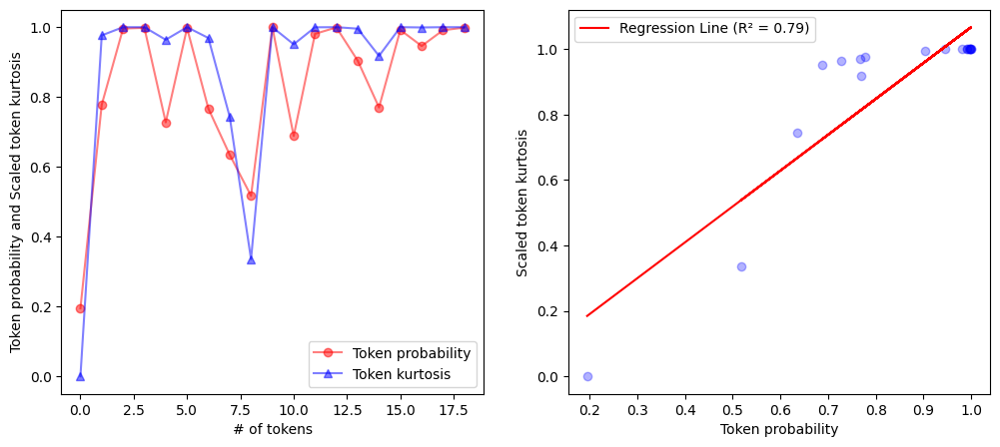

 80%|████████  | 80/100 [00:45<00:14,  1.34it/s]

[Sentences]
   Input: translate English to German: Given that the Commission is represented by Vice-President de Palacio, I believe that, before voting, it would help if the Commission could let us know how ready it is to present this programme, as agreed. Alternatively, Parliament is not ready to examine this programme, as some appear to be suggesting.
   True Translation: Da die Kommission durch die Vizepräsidentin, Frau de Palacio, vertreten ist, halte ich es für zweckmäßig, vor der Abstimmung die Position der Kommission hinsichtlich ihrer Bereitschaft zur Vorstellung des Programms, so wie es vereinbart war, zu erfahren.), oder das Parlament ist zur Prüfung dieses Programms nicht in der Lage, wie einige offenbar vorgeben.
   Predicted Translation: Da die Kommission von Vizepräsident de Palacio vertreten ist, glaube ich, dass es vor der Abstimmung hilfreich wäre, wenn die Kommission uns mitteilen könnte, wie bereit sie ist, dieses Programm vorzulegen, wie vereinbart, und das Parlamen

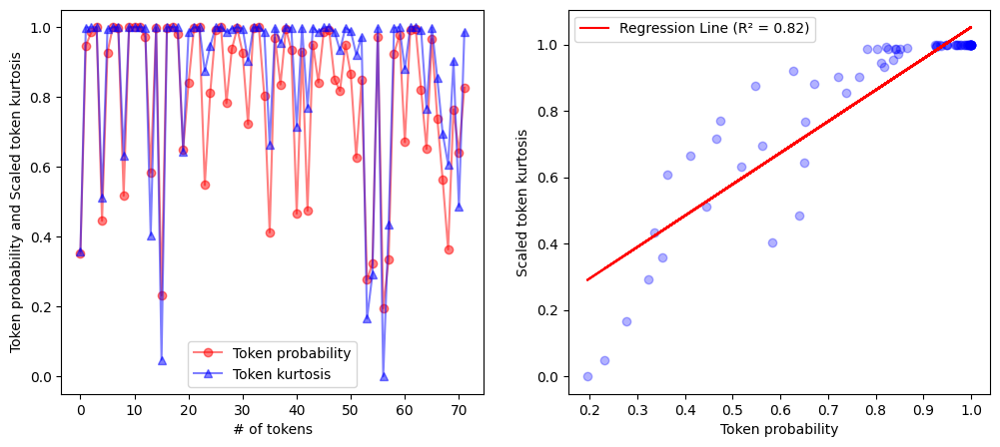

 81%|████████  | 81/100 [00:46<00:15,  1.21it/s]

[Sentences]
   Input: translate English to German: In my opinion, this second hypothesis would imply the failure of Parliament in its duty as a Parliament, as well as introducing an original thesis, an unknown method which consists of making political groups aware, in writing, of a speech concerning the Commission' s programme a week earlier - and not a day earlier, as had been agreed - bearing in mind that the legislative programme will be discussed in February, so we could forego the debate, since on the next day our citizens will hear about it in the press and on the Internet and Parliament will no longer have to worry about it.
   True Translation: Nach meiner Ansicht würde diese zweite Hypothese einem Verzicht auf unsere Verantwortung als Parlament und darüber hinaus dem Aufwerfen einer originellen These, einer unbekannten Methode gleichkommen, die darin bestände, den Fraktionen die programmatische Rede der Kommission in schriftlicher Form eine Woche vorher - und nicht, wie verein

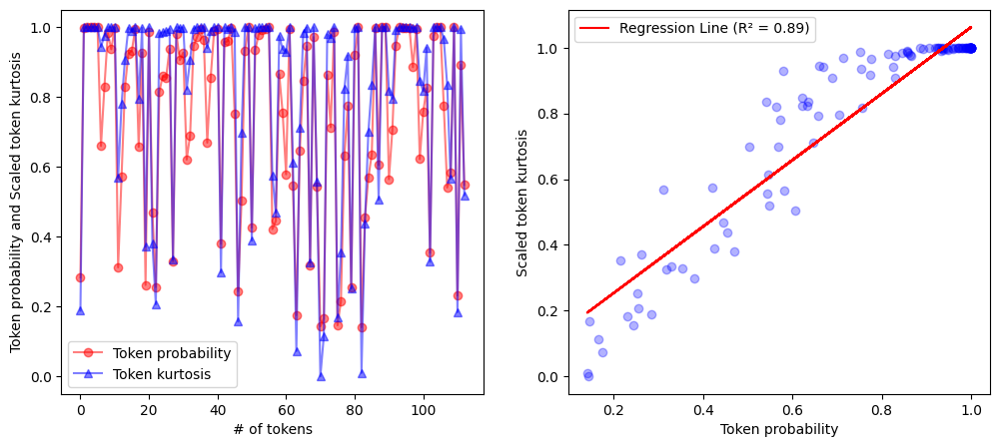

 82%|████████▏ | 82/100 [00:48<00:21,  1.17s/it]

[Sentences]
   Input: translate English to German: My Group believes that since a parliament is meant to listen, debate and reflect, there can be no justification whatsoever for this delay and we believe that, if the Commission is ready to do so, we still have time to re-establish the original agreement between Parliament and the Commission and proceed in a manner which fulfils our duty to our fellow citizens.
   True Translation: Da meine Fraktion der Meinung ist, daß ein Parlament dazu da ist, zuzuhören, zu diskutieren und nachzudenken, gibt es unserer Ansicht nach keinen Grund zur Rechtfertigung dieser Verzögerung, und wir glauben, wenn die Kommission dazu in der Lage ist, liegen wir genau in der Zeit, um die ursprüngliche Vereinbarung zwischen dem Parlament und der Kommission wieder in Kraft zu setzen und verantwortungsbewußt vor unsere Mitbürgerinnen und Mitbürgern treten zu können.
   Predicted Translation: Meine Fraktion ist der Meinung, daß es, da ein Parlament zuhören, diskuti

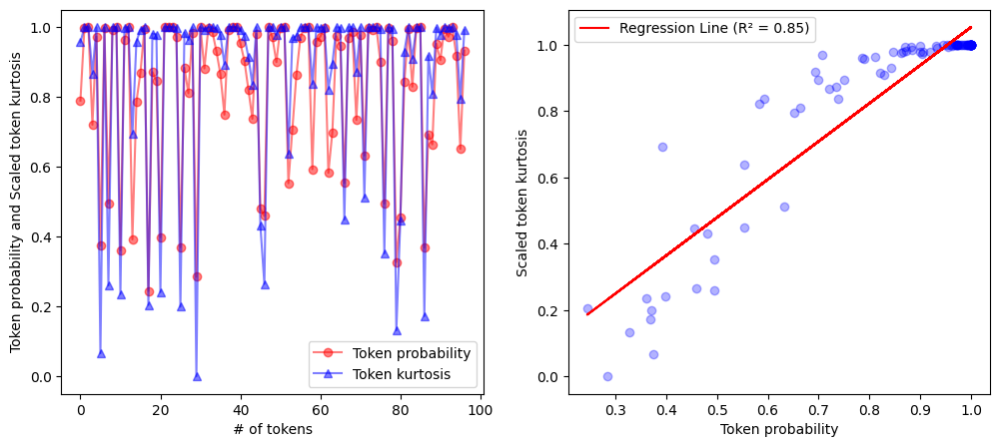

 83%|████████▎ | 83/100 [00:50<00:21,  1.25s/it]

[Sentences]
   Input: translate English to German: Therefore, the proposal of the Group of the Party of European Socialists, and which you have mentioned, is that the Prodi Commission present its legislative programme on Wednesday, including its proposed administrative reform, because, otherwise, we could find ourselves in a paradoxical situation: on the pretext that there is no text, on the one hand, the President of the Commission would be denied his right to speak in this Parliament and, on the other hand, there would be a debate on a reform when Parliament had no prior knowledge of the texts on which it is based.
   True Translation: Deshalb besteht der Vorschlag der Fraktion der Sozialdemokratischen Partei Europas, den Sie erwähnt haben, darin, den Mittwoch als Termin der Vorstellung des Programms der Kommission Prodi für die Wahlperiode beizubehalten, und in dieses Programm auch das Verwaltungsreformprojekt einzubeziehen, da wir andernfalls in eine paradoxe Situation geraten könn

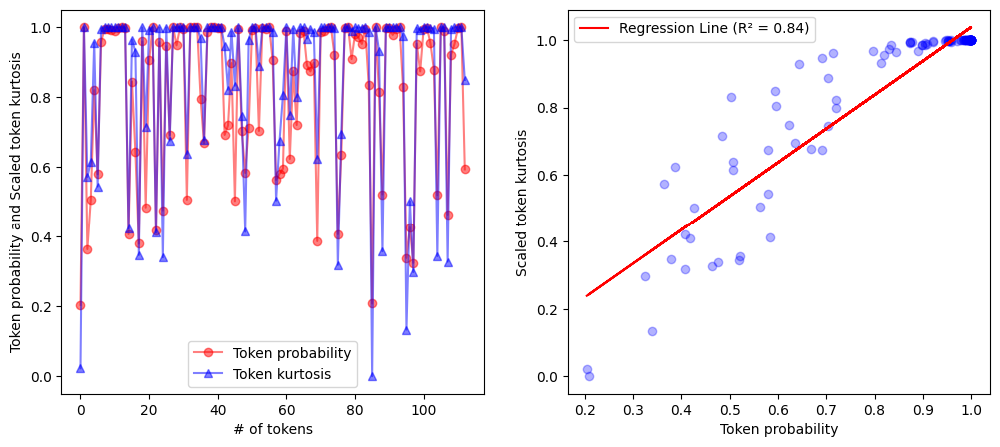

 84%|████████▍ | 84/100 [00:51<00:21,  1.35s/it]

[Sentences]
   Input: translate English to German: Therefore, Madam President, I would ask you to request that the Commission express its opinion on this issue and that we then proceed to the vote.
   True Translation: Daher bitte ich Sie, Frau Präsidentin, die Kommission zu ersuchen, sich jetzt zu äußern, und danach zur Abstimmung zu schreiten.
   Predicted Translation: Deshalb, Frau Präsidentin, möchte ich Sie bitten, die Kommission auffordern, ihre Meinung zu diesem Thema zu äußern und dann zur Abstimmung zu kommen.

[Scores]
   BLEU score: 0.3043012576448141
   METEOR score: 0.5729849246231156
   ROUGE score: {'rouge1': Score(precision=0.5769230769230769, recall=0.6818181818181818, fmeasure=0.6249999999999999), 'rouge2': Score(precision=0.36, recall=0.42857142857142855, fmeasure=0.391304347826087), 'rougeL': Score(precision=0.5, recall=0.5909090909090909, fmeasure=0.5416666666666667)}
   BERT score: {'precision': [0.9178193807601929], 'recall': [0.9255255460739136], 'f1': [0.921656

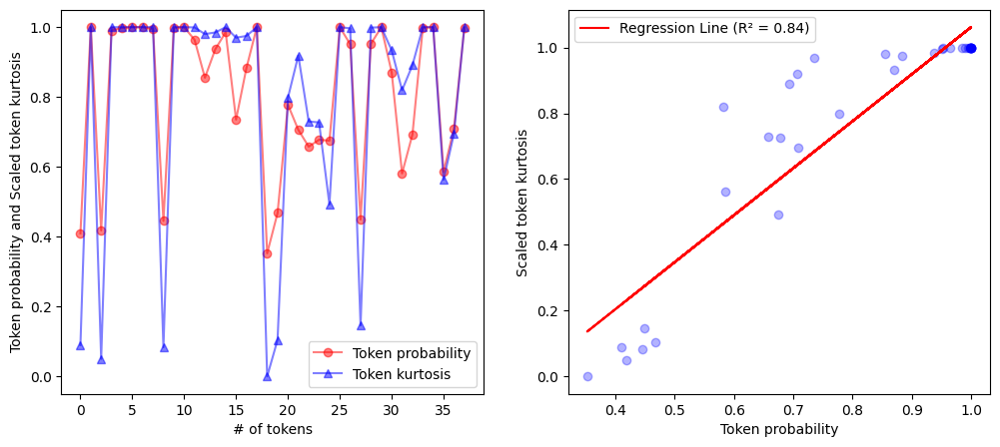

 85%|████████▌ | 85/100 [00:52<00:16,  1.11s/it]

[Sentences]
   Input: translate English to German: (Applause from the PSE Group)
   True Translation: (Beifall der PSE-Fraktion)
   Predicted Translation: (Beifall der PSE-Fraktion)

[Scores]
   BLEU score: 1.0
   METEOR score: 0.9995
   ROUGE score: {'rouge1': Score(precision=1.0, recall=1.0, fmeasure=1.0), 'rouge2': Score(precision=1.0, recall=1.0, fmeasure=1.0), 'rougeL': Score(precision=1.0, recall=1.0, fmeasure=1.0)}
   BERT score: {'precision': [1.000000238418579], 'recall': [1.000000238418579], 'f1': [1.000000238418579], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0.946
   [New UQ] Confidence-A-T (Arithmetic mean of token probability): 0.953
   [New UQ] Confidence-A-K (Arithmetic mean of kurtosis): 0.899


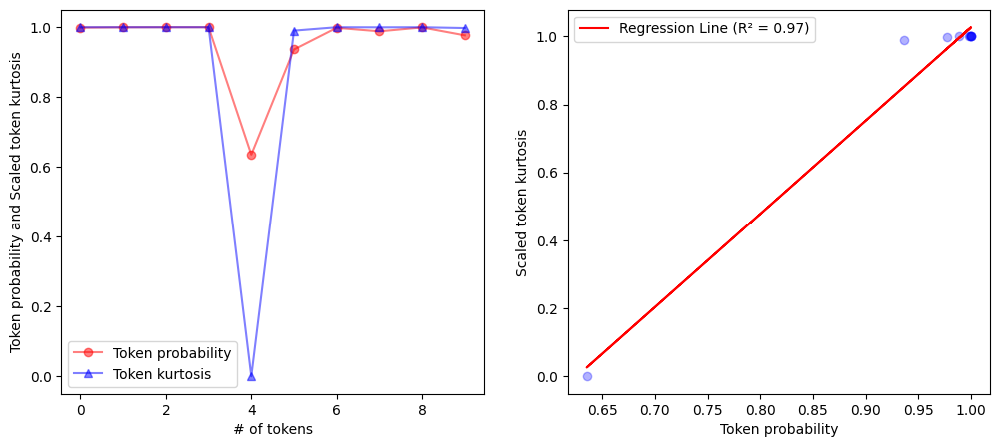

 86%|████████▌ | 86/100 [00:52<00:12,  1.15it/s]

[Sentences]
   Input: translate English to German: Madam President, I really am quite astonished at Mr Barón Crespo' s behaviour and the fact that he is now asking for this item to be put on Wednesday's agenda.
   True Translation: Frau Präsidentin, liebe Kolleginnen und Kollegen! Ich bin doch etwas erstaunt über das Verhalten des Kollegen Barón Crespo, der jetzt verlangt, daß dieser Tagesordnungspunkt auf die Tagesordnung für Mittwoch gesetzt wird.
   Predicted Translation: Frau Präsidentin, ich bin wirklich sehr erstaunt über das Verhalten von Herrn Barón Crespo und die Tatsache, daß er jetzt fordert, daß dieser Punkt auf die Tagesordnung vom Mittwoch gesetzt wird.

[Scores]
   BLEU score: 0.44280253128832564
   METEOR score: 0.6612524071983532
   ROUGE score: {'rouge1': Score(precision=0.6666666666666666, recall=0.6470588235294118, fmeasure=0.6567164179104478), 'rouge2': Score(precision=0.40625, recall=0.3939393939393939, fmeasure=0.4), 'rougeL': Score(precision=0.6363636363636364, 

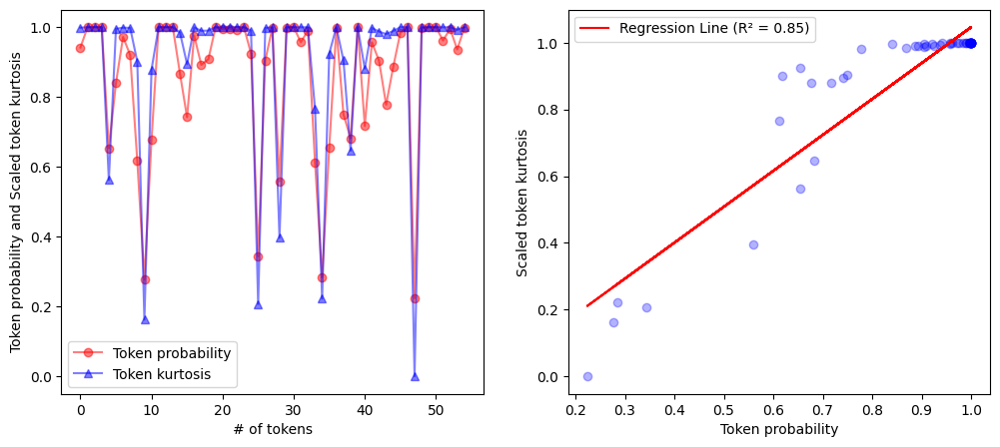

 87%|████████▋ | 87/100 [00:53<00:10,  1.19it/s]

[Sentences]
   Input: translate English to German: Mr Barón Crespo, you were unable to attend the Conference of Presidents last Thursday.
   True Translation: Herr Kollege Barón Crespo, Sie konnten am letzten Donnerstag in der Konferenz der Präsidenten nicht anwesend sein.
   Predicted Translation: Herr Barón Crespo, Sie konnten am vergangenen Donnerstag nicht an der Konferenz der Präsidenten teilnehmen.

[Scores]
   BLEU score: 0.506172736236285
   METEOR score: 0.7474046298304876
   ROUGE score: {'rouge1': Score(precision=0.8235294117647058, recall=0.7368421052631579, fmeasure=0.7777777777777778), 'rouge2': Score(precision=0.5625, recall=0.5, fmeasure=0.5294117647058824), 'rougeL': Score(precision=0.7647058823529411, recall=0.6842105263157895, fmeasure=0.7222222222222222)}
   BERT score: {'precision': [0.9521938562393188], 'recall': [0.937175989151001], 'f1': [0.944625198841095], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertaint

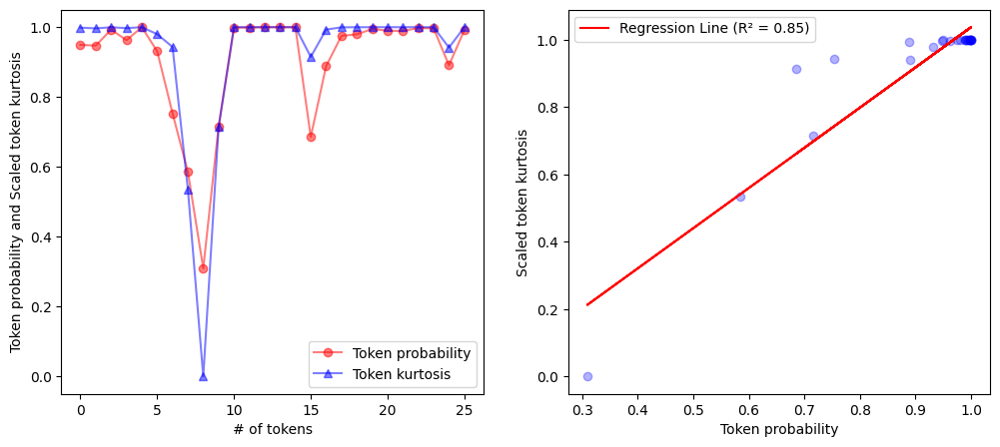

 88%|████████▊ | 88/100 [00:53<00:09,  1.33it/s]

[Sentences]
   Input: translate English to German: I am not criticising this; it happens from time to time that people send someone to represent them.
   True Translation: Das kritisiere ich nicht; es kommt immer mal vor, daß man sich vertreten läßt.
   Predicted Translation: Ich kritisiert dies nicht, sondern es geschieht von Zeit zu Zeit, dass Menschen jemanden entsenden, um sie zu vertreten.

[Scores]
   BLEU score: 0.039605304367508136
   METEOR score: 0.26468369008379333
   ROUGE score: {'rouge1': Score(precision=0.21052631578947367, recall=0.26666666666666666, fmeasure=0.23529411764705882), 'rouge2': Score(precision=0.0, recall=0.0, fmeasure=0.0), 'rougeL': Score(precision=0.21052631578947367, recall=0.26666666666666666, fmeasure=0.23529411764705882)}
   BERT score: {'precision': [0.8467794060707092], 'recall': [0.8607513308525085], 'f1': [0.8537082076072693], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification

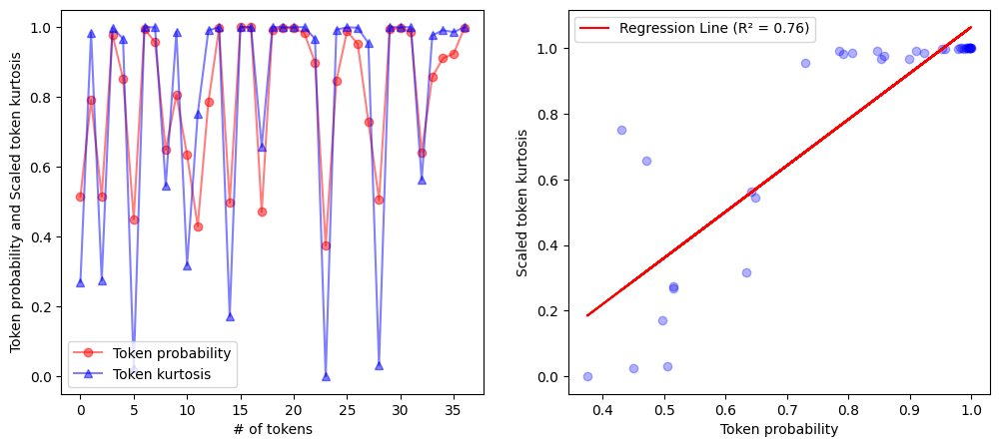

 89%|████████▉ | 89/100 [00:54<00:07,  1.44it/s]

[Sentences]
   Input: translate English to German: Mr Hänsch represented you on this occasion.
   True Translation: Der Kollege Hänsch hat Sie dort vertreten.
   Predicted Translation: Herr Hänsch hat Sie bei dieser Gelegenheit vertreten.

[Scores]
   BLEU score: 0.42803206067505944
   METEOR score: 0.6198347107438016
   ROUGE score: {'rouge1': Score(precision=0.5555555555555556, recall=0.625, fmeasure=0.5882352941176471), 'rouge2': Score(precision=0.375, recall=0.42857142857142855, fmeasure=0.39999999999999997), 'rougeL': Score(precision=0.5555555555555556, recall=0.625, fmeasure=0.5882352941176471)}
   BERT score: {'precision': [0.9004552960395813], 'recall': [0.9164131283760071], 'f1': [0.9083641171455383], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0.85
   [New UQ] Confidence-A-T (Arithmetic mean of token probability): 0.868
   [New UQ] C

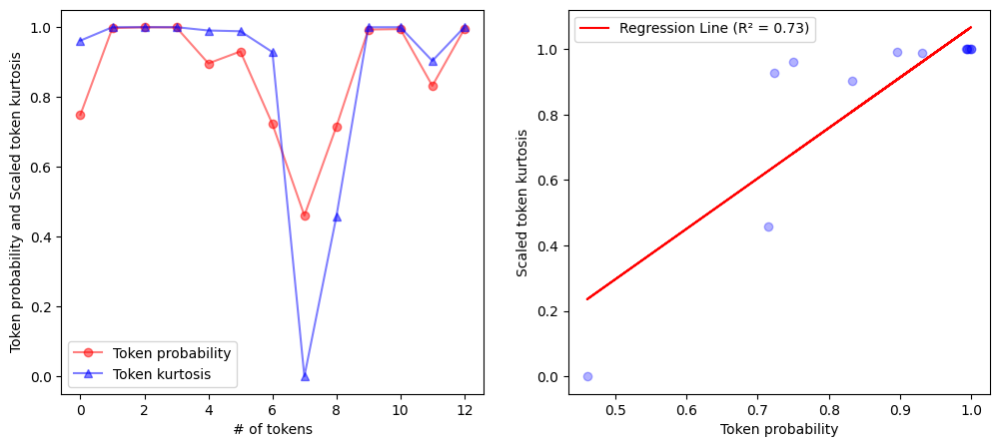

 90%|█████████ | 90/100 [00:54<00:05,  1.72it/s]

[Sentences]
   Input: translate English to German: In the Conference of Presidents, we had an in-depth discussion.
   True Translation: Wir haben in der Konferenz der Präsidenten eine ausführliche Debatte geführt.
   Predicted Translation: Auf der Konferenz der Präsidenten haben wir eine gründliche Diskussion geführt.

[Scores]
   BLEU score: 0.3967088290836577
   METEOR score: 0.5990715616724968
   ROUGE score: {'rouge1': Score(precision=0.7142857142857143, recall=0.7142857142857143, fmeasure=0.7142857142857143), 'rouge2': Score(precision=0.38461538461538464, recall=0.38461538461538464, fmeasure=0.38461538461538464), 'rougeL': Score(precision=0.5714285714285714, recall=0.5714285714285714, fmeasure=0.5714285714285714)}
   BERT score: {'precision': [0.9131982326507568], 'recall': [0.8973884582519531], 'f1': [0.9052243232727051], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric

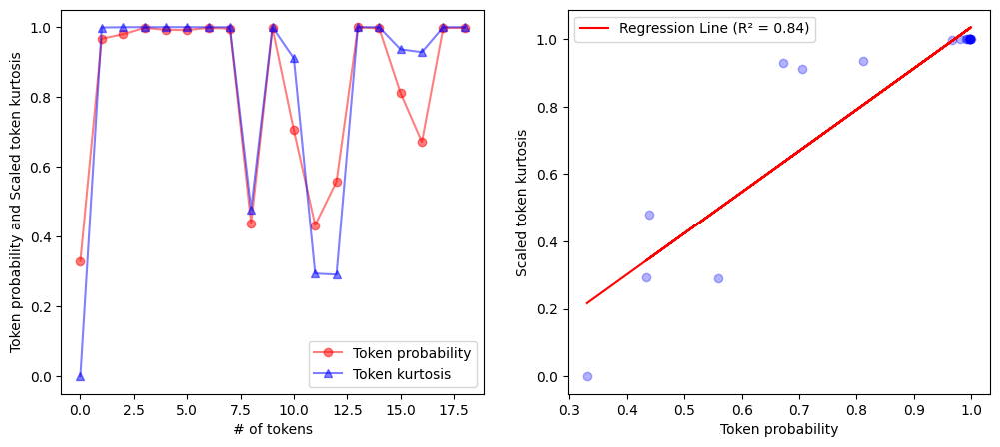

 91%|█████████ | 91/100 [00:55<00:04,  1.95it/s]

[Sentences]
   Input: translate English to German: Your Group was alone in advocating what you are saying now.
   True Translation: Nur Ihre Fraktion hat das vertreten, was Sie jetzt sagen.
   Predicted Translation: Ihre Fraktion hat sich allein dafür eingesetzt, was Sie jetzt sagen.

[Scores]
   BLEU score: 0.570282226440554
   METEOR score: 0.7777973155149173
   ROUGE score: {'rouge1': Score(precision=0.5833333333333334, recall=0.7, fmeasure=0.6363636363636365), 'rouge2': Score(precision=0.45454545454545453, recall=0.5555555555555556, fmeasure=0.5), 'rougeL': Score(precision=0.5833333333333334, recall=0.7, fmeasure=0.6363636363636365)}
   BERT score: {'precision': [0.9415228366851807], 'recall': [0.9495907425880432], 'f1': [0.945539653301239], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0.779
   [New UQ] Confidence-A-T (Arithmetic mean of to

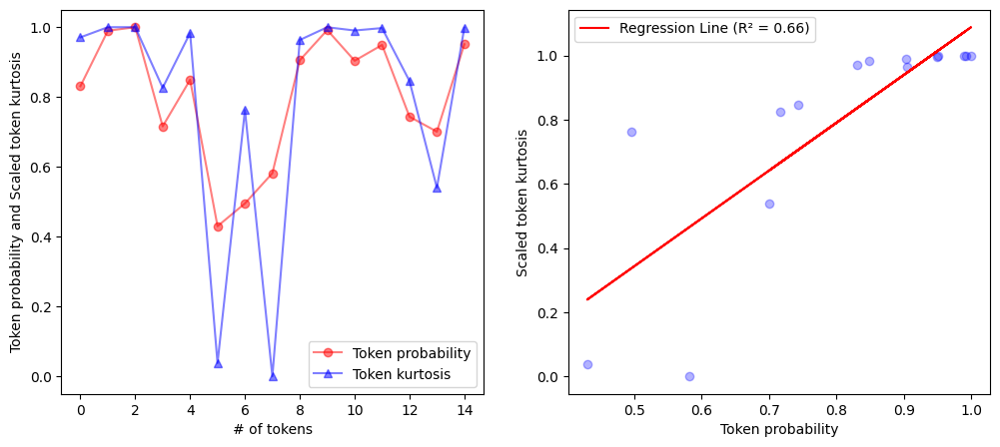

 92%|█████████▏| 92/100 [00:55<00:03,  2.15it/s]

[Sentences]
   Input: translate English to German: We then put it to a vote.
   True Translation: Wir haben dann abgestimmt.
   Predicted Translation: Dann legen wir darüber ab.

[Scores]
   BLEU score: 0.033031643180138064
   METEOR score: 0.28846153846153844
   ROUGE score: {'rouge1': Score(precision=0.3333333333333333, recall=0.5, fmeasure=0.4), 'rouge2': Score(precision=0.0, recall=0.0, fmeasure=0.0), 'rougeL': Score(precision=0.16666666666666666, recall=0.25, fmeasure=0.2)}
   BERT score: {'precision': [0.907233715057373], 'recall': [0.8847264051437378], 'f1': [0.8958386778831482], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0.675
   [New UQ] Confidence-A-T (Arithmetic mean of token probability): 0.736
   [New UQ] Confidence-A-K (Arithmetic mean of kurtosis): 0.728


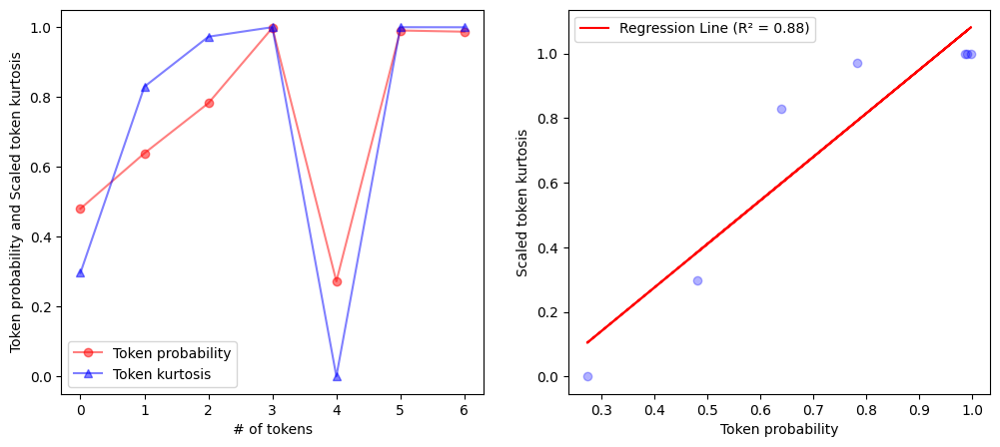

 93%|█████████▎| 93/100 [00:55<00:02,  2.54it/s]

[Sentences]
   Input: translate English to German: As you know, each chairman has the same number of votes as his Group has Members.
   True Translation: Jeder Vorsitzende bzw. jede Vorsitzende hat ja so viele Stimmen, wie die Fraktion Mitglieder hat.
   Predicted Translation: Wie Sie wissen, hat jeder Vorsitzende die gleiche Stimmenzahl wie seine Fraktion.

[Scores]
   BLEU score: 0.06163470935497276
   METEOR score: 0.40168908472479903
   ROUGE score: {'rouge1': Score(precision=0.5, recall=0.4, fmeasure=0.4444444444444445), 'rouge2': Score(precision=0.09090909090909091, recall=0.07142857142857142, fmeasure=0.08), 'rougeL': Score(precision=0.3333333333333333, recall=0.26666666666666666, fmeasure=0.2962962962962963)}
   BERT score: {'precision': [0.8934496641159058], 'recall': [0.9011892676353455], 'f1': [0.8973028063774109], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric m

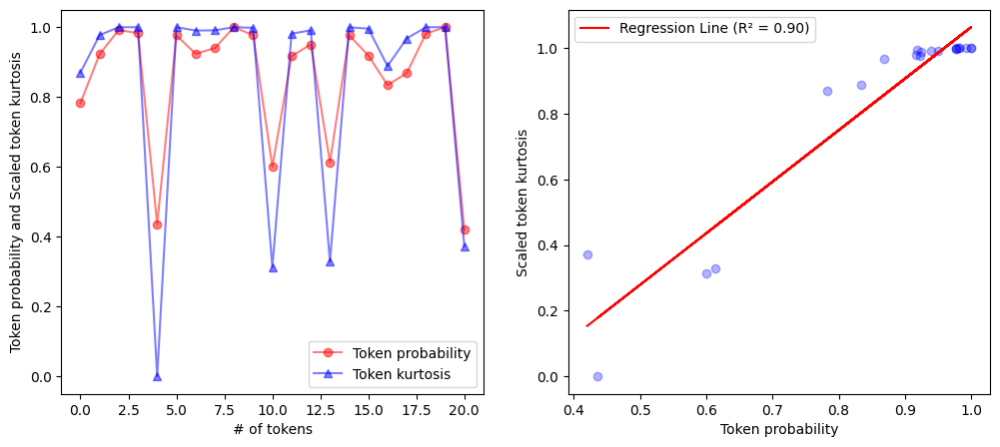

 94%|█████████▍| 94/100 [00:56<00:02,  2.52it/s]

[Sentences]
   Input: translate English to German: There was a vote on this matter.
   True Translation: Es gab eine Abstimmung zu diesem Punkt.
   Predicted Translation: Es gab eine Abstimmung zu diesem Thema.

[Scores]
   BLEU score: 0.7825422900366437
   METEOR score: 0.8950617283950617
   ROUGE score: {'rouge1': Score(precision=0.8571428571428571, recall=0.8571428571428571, fmeasure=0.8571428571428571), 'rouge2': Score(precision=0.8333333333333334, recall=0.8333333333333334, fmeasure=0.8333333333333334), 'rougeL': Score(precision=0.8571428571428571, recall=0.8571428571428571, fmeasure=0.8571428571428571)}
   BERT score: {'precision': [0.9793773293495178], 'recall': [0.9793773293495178], 'f1': [0.9793773293495178], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0.713
   [New UQ] Confidence-A-T (Arithmetic mean of token probability): 0.767
   [

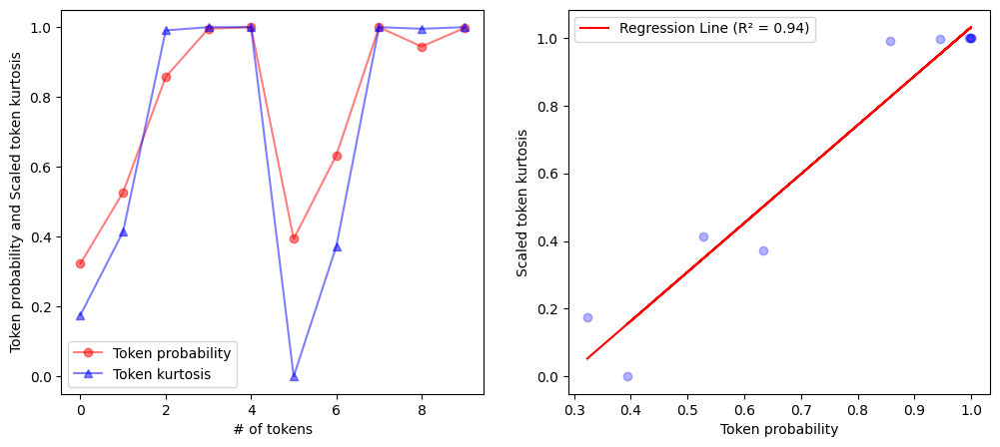

 95%|█████████▌| 95/100 [00:56<00:01,  2.82it/s]

[Sentences]
   Input: translate English to German: As I recall, the outcome of this vote was 422 votes to 180 with a few abstentions.
   True Translation: Diese Abstimmung ist meiner Erinnerung nach so ausgegangen: 422 gegen 180 Stimmen bei einigen wenigen Enthaltungen.
   Predicted Translation: Wie ich mich erinnere, hat sich diese Abstimmung mit 422 zu 180 Stimmen und wenigen Enthaltungen ereignet.

[Scores]
   BLEU score: 0.1826249361348376
   METEOR score: 0.5574573863636363
   ROUGE score: {'rouge1': Score(precision=0.4117647058823529, recall=0.4375, fmeasure=0.42424242424242425), 'rouge2': Score(precision=0.1875, recall=0.2, fmeasure=0.19354838709677422), 'rougeL': Score(precision=0.4117647058823529, recall=0.4375, fmeasure=0.42424242424242425)}
   BERT score: {'precision': [0.8805178999900818], 'recall': [0.899331271648407], 'f1': [0.889825165271759], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [Ne

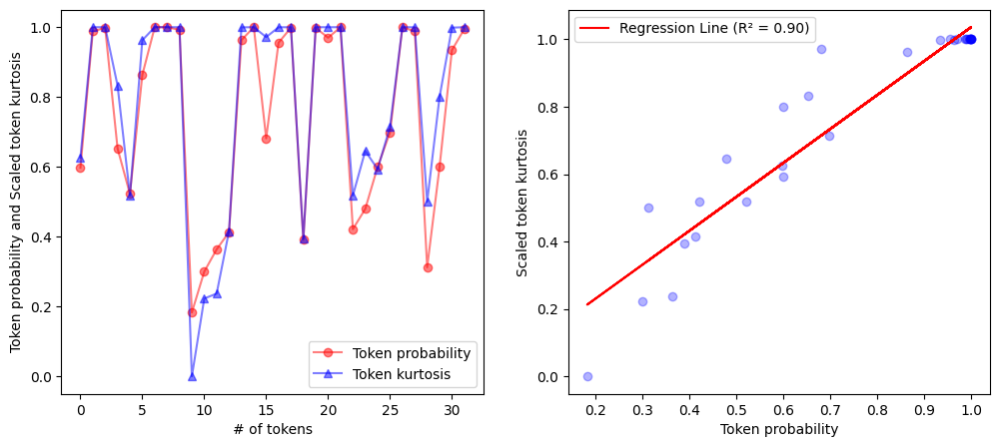

 96%|█████████▌| 96/100 [00:56<00:01,  2.46it/s]

[Sentences]
   Input: translate English to German: This means that all the Groups with the exception of the non-attached Members - but, of course, they are not a Group - were in agreement; only your Group thought that we should proceed as you have proposed here.
   True Translation: Das heißt, alle Fraktionen, mit Ausnahme der Fraktionslosen - aber die sind ja keine Fraktion - waren sich einig, nur Ihre Fraktion war der Meinung, so zu verfahren, wie Sie es hier vorgeschlagen haben.
   Predicted Translation: Das heißt, alle Fraktionen mit Ausnahme der fraktionslosen Abgeordneten - aber natürlich sind sie keine Fraktion - waren sich einig; nur Ihre Fraktion hat gemeint, dass wir, wie Sie hier vorgeschlagen haben, vorgehen sollten.

[Scores]
   BLEU score: 0.4280236084461078
   METEOR score: 0.6887165737900666
   ROUGE score: {'rouge1': Score(precision=0.7058823529411765, recall=0.7272727272727273, fmeasure=0.7164179104477613), 'rouge2': Score(precision=0.5454545454545454, recall=0.5625, 

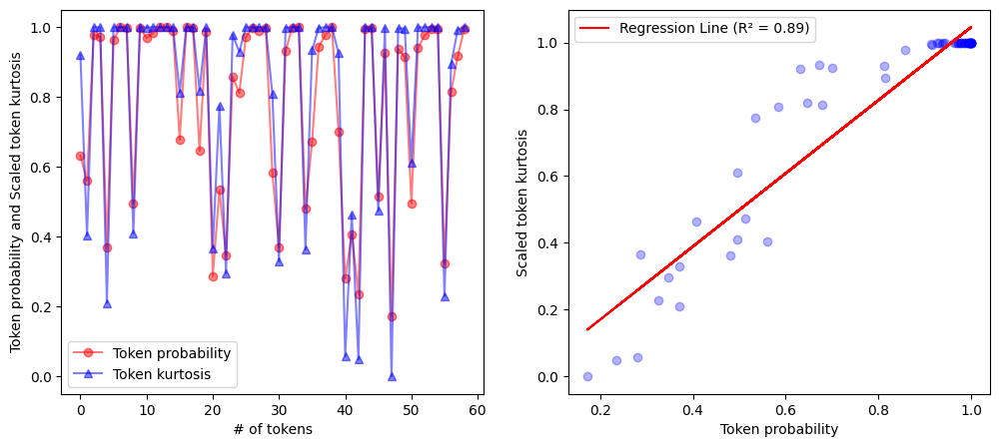

 97%|█████████▋| 97/100 [00:57<00:01,  1.69it/s]

[Sentences]
   Input: translate English to German: All of the others were of a different opinion.
   True Translation: Alle anderen waren anderer Meinung.
   Predicted Translation: Alle anderen waren anderer Meinung.

[Scores]
   BLEU score: 1.0
   METEOR score: 0.9976851851851852
   ROUGE score: {'rouge1': Score(precision=1.0, recall=1.0, fmeasure=1.0), 'rouge2': Score(precision=1.0, recall=1.0, fmeasure=1.0), 'rougeL': Score(precision=1.0, recall=1.0, fmeasure=1.0)}
   BERT score: {'precision': [0.9999998211860657], 'recall': [0.9999998211860657], 'f1': [0.9999998211860657], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0.675
   [New UQ] Confidence-A-T (Arithmetic mean of token probability): 0.721
   [New UQ] Confidence-A-K (Arithmetic mean of kurtosis): 0.782


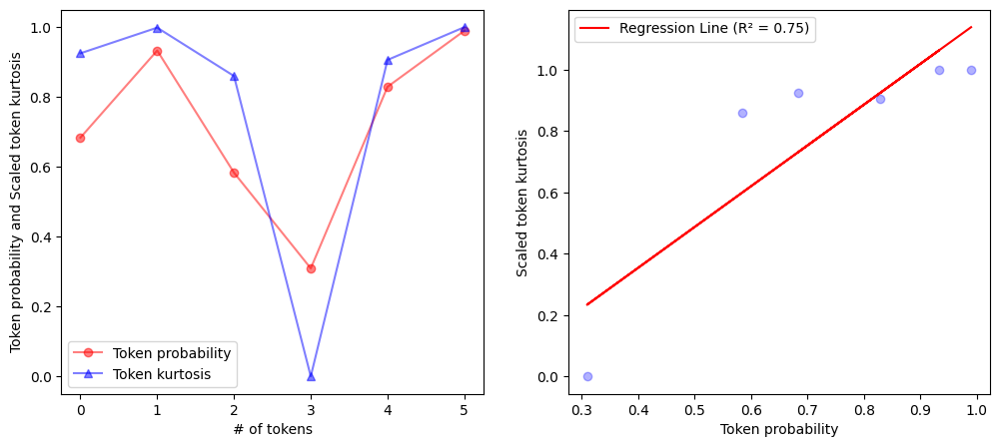

 98%|█████████▊| 98/100 [00:58<00:01,  2.00it/s]

[Sentences]
   Input: translate English to German: That was the decision.
   True Translation: Das war der Beschluß.
   Predicted Translation: Das war die Entscheidung.

[Scores]
   BLEU score: 0.08428828344718171
   METEOR score: 0.3758169934640523
   ROUGE score: {'rouge1': Score(precision=0.5, recall=0.5, fmeasure=0.5), 'rouge2': Score(precision=0.3333333333333333, recall=0.3333333333333333, fmeasure=0.3333333333333333), 'rougeL': Score(precision=0.5, recall=0.5, fmeasure=0.5)}
   BERT score: {'precision': [0.9561296701431274], 'recall': [0.903318464756012], 'f1': [0.9289740920066833], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0.832
   [New UQ] Confidence-A-T (Arithmetic mean of token probability): 0.844
   [New UQ] Confidence-A-K (Arithmetic mean of kurtosis): 0.727


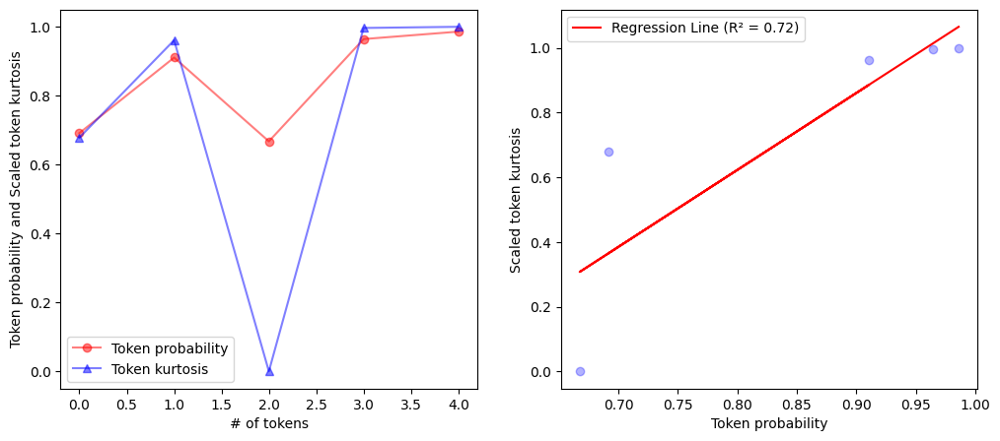

 99%|█████████▉| 99/100 [00:58<00:00,  2.39it/s]

[Sentences]
   Input: translate English to German: I should now like to comment on the issue itself.
   True Translation: Jetzt möchte ich zur Sache selbst etwas sagen.
   Predicted Translation: Ich möchte nun zu diesem Thema selbst Stellung nehmen.

[Scores]
   BLEU score: 0.022416933501922302
   METEOR score: 0.14705882352941177
   ROUGE score: {'rouge1': Score(precision=0.4, recall=0.4444444444444444, fmeasure=0.4210526315789474), 'rouge2': Score(precision=0.1111111111111111, recall=0.125, fmeasure=0.11764705882352941), 'rougeL': Score(precision=0.3, recall=0.3333333333333333, fmeasure=0.3157894736842105)}
   BERT score: {'precision': [0.890633225440979], 'recall': [0.8892776370048523], 'f1': [0.8899549245834351], 'hashcode': 'distilbert-base-multilingual-cased_L5_no-idf_version=0.3.12(hug_trans=4.46.0)'}

[Uncertainty Quantification]
   [New UQ] Confidence-G-T (Geometric mean of token probability): 0.655
   [New UQ] Confidence-A-T (Arithmetic mean of token probability): 0.726
   [N

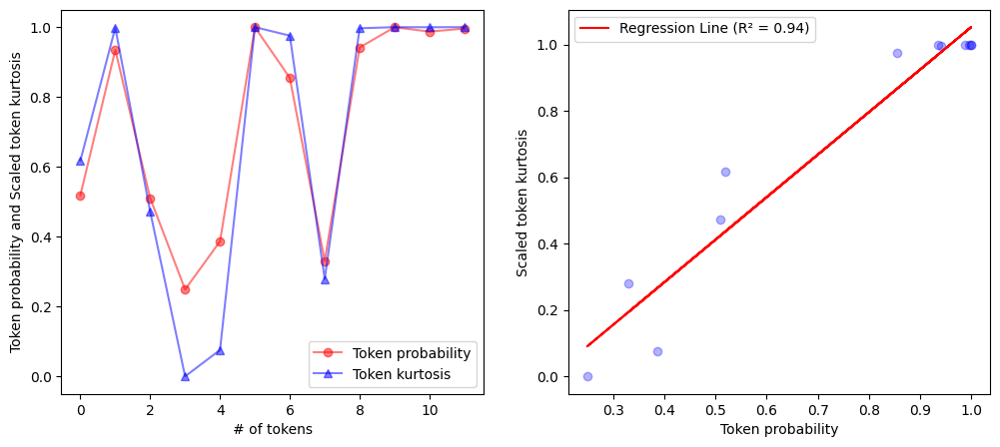

100%|██████████| 100/100 [00:58<00:00,  1.70it/s]


In [7]:
for i in tqdm(range(samples)):
    # print(f"--------------- Sample {i} ---------------")
    input_text = f"translate English to German: {ds_de_en['train'][i]['translation']['en']}"
    true_translation = ds_de_en['train'][i]['translation']['de']
    predicted_translation, token_probs, token_kurtosis = generate_output_with_probs(model=t5_model_small, tokenizer=t5_tokenizer_small, example=input_text)

    # tokenize 
    true_tokens = t5_tokenizer_small.tokenize(true_translation)
    predicted_tokens = t5_tokenizer_small.tokenize(predicted_translation)

    # uncertainty quantification using kurtosis 
    token_kurtosis = token_kurtosis.reshape(-1, 1)
    scaler = MinMaxScaler()
    scaled_token_kurtosis = scaler.fit_transform(token_kurtosis).flatten() 

    # already available metrics
    bleu   = calculate_bleu([true_tokens], predicted_tokens)                                            # 1. BLEU
    meteor = meteor_score([true_tokens], predicted_tokens)                                              # 2. METEOR (# jhpark: verified that this is a correct way to use this.)
    rouge  = calculate_rouge(true_translation, predicted_translation)                                   # 3. ROUGE
    bert = bertscore.compute(predictions=[predicted_translation], references=[true_translation], model_type='distilbert-base-multilingual-cased') # 4. BERTscore.
    
    score_collector_en_de['bleu'].append(bleu)
    score_collector_en_de['meteor'].append(meteor)
    score_collector_en_de['rouge'].append(rouge)
    score_collector_en_de['bert'].append(bert)

    score_collector_en_de['Confidence-G-T'].append(gmean(token_probs))
    score_collector_en_de['Confidence-A-T'].append(np.average(token_probs))
    score_collector_en_de['Confidence-A-K'].append(np.average(scaled_token_kurtosis))

    # print results
    print("[Sentences]")
    print("   Input:", input_text)
    print("   True Translation:", true_translation)
    print("   Predicted Translation:", predicted_translation)

    print("\n[Scores]")
    print("   BLEU score:", bleu) 
    print("   METEOR score:", meteor) 
    print("   ROUGE score:", rouge) 
    print("   BERT score:", bert) 

    print("\n[Uncertainty Quantification]")
    print(f"   [New UQ] Confidence-G-T (Geometric mean of token probability): {np.round(gmean(token_probs), 3)}") 
    print(f"   [New UQ] Confidence-A-T (Arithmetic mean of token probability): {np.round(np.average(token_probs), 3)}") 
    print(f"   [New UQ] Confidence-A-K (Arithmetic mean of kurtosis): {np.round(np.average(scaled_token_kurtosis), 3)}") 
    
    visualization_1(token_probs, scaled_token_kurtosis)


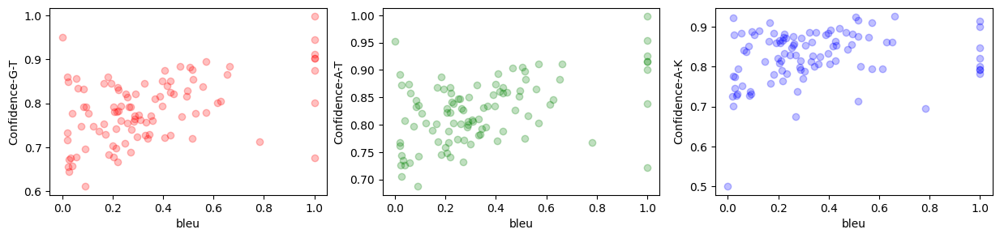

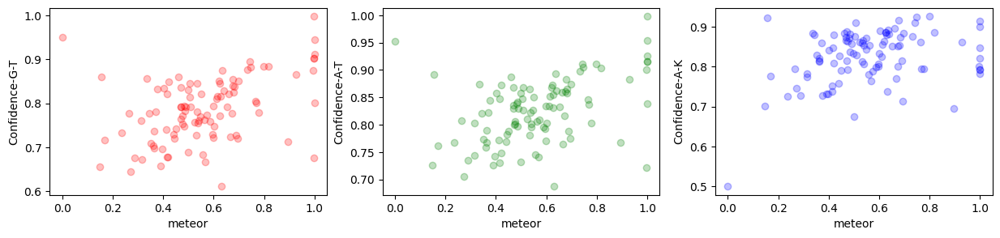

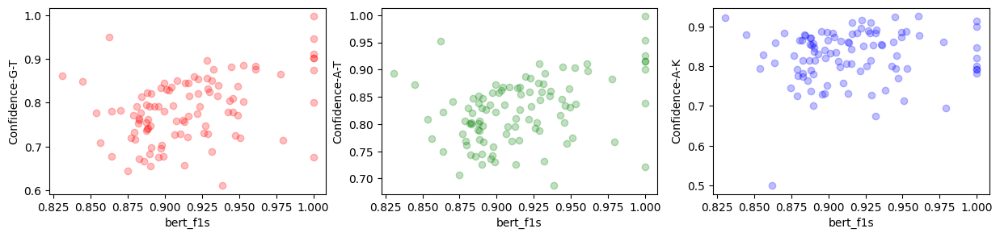

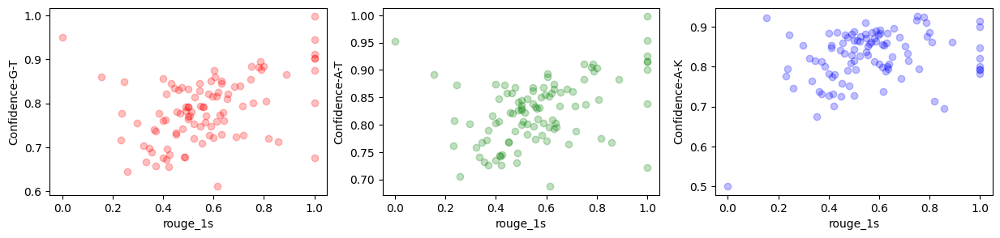

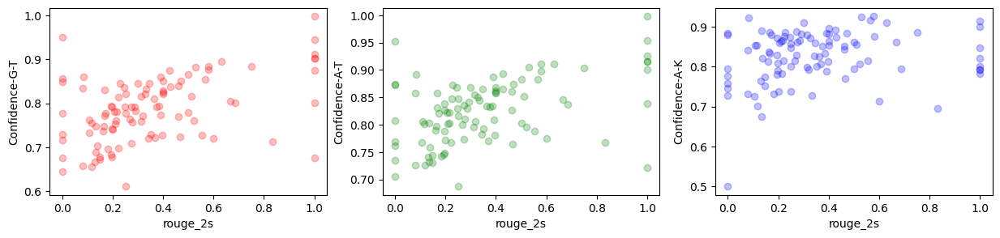

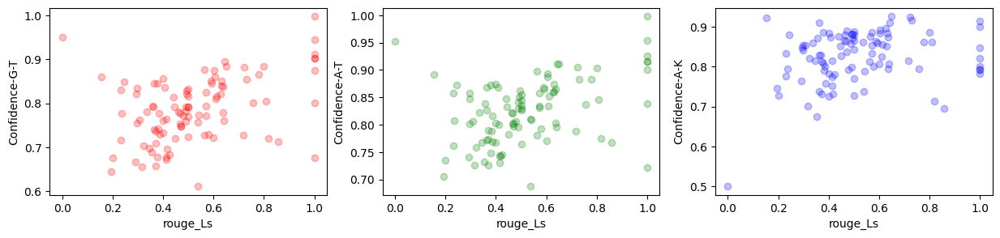

In [8]:
visualization_2(score_collector_en_de)

### 2. Generate translations (English to French)

In [ ]:
for i in tqdm(range(samples)):
    # print(f"--------------- Sample {i} ---------------")
    input_text = f"translate English to French: {ds_fr_en['train'][i]['translation']['en']}"
    true_translation = ds_fr_en['train'][i]['translation']['fr']
    predicted_translation, token_probs, token_kurtosis = generate_output_with_probs(model=t5_model_small, tokenizer=t5_tokenizer_small, example=input_text)

    # tokenize 
    true_tokens = t5_tokenizer_small.tokenize(true_translation)
    predicted_tokens = t5_tokenizer_small.tokenize(predicted_translation)

    # uncertainty quantification using kurtosis 
    token_kurtosis = token_kurtosis.reshape(-1, 1)
    scaler = MinMaxScaler()
    scaled_token_kurtosis = scaler.fit_transform(token_kurtosis).flatten() 

    # already available metrics
    bleu   = calculate_bleu([true_tokens], predicted_tokens)                                            # 1. BLEU
    meteor = meteor_score([true_tokens], predicted_tokens)                                              # 2. METEOR (# jhpark: verified that this is a correct way to use this.)
    rouge  = calculate_rouge(true_translation, predicted_translation)                                   # 3. ROUGE
    bert = bertscore.compute(predictions=[predicted_translation], references=[true_translation], model_type='distilbert-base-multilingual-cased') # 4. BERTscore.

    score_collector_en_fr['bleu'].append(bleu)
    score_collector_en_fr['meteor'].append(meteor)
    score_collector_en_fr['rouge'].append(rouge)
    score_collector_en_fr['bert'].append(bert)

    score_collector_en_fr['Confidence-G-T'].append(gmean(token_probs))
    score_collector_en_fr['Confidence-A-T'].append(np.average(token_probs))
    score_collector_en_fr['Confidence-A-K'].append(np.average(scaled_token_kurtosis))

    # print results
    # print("[Sentences]")
    # print("   Input:", input_text)
    # print("   True Translation:", true_translation)
    # print("   Predicted Translation:", predicted_translation)

    # print("\n[Scores]")
    # print("   BLEU score:", bleu) 
    # print("   METEOR score:", meteor)
    # print("   ROUGE score:", rouge)
    # print("   BERT score:", bert) 

    # print("\n[Uncertainty Quantification]")
    # print(f"   [New UQ] Confidence-G-T (Geometric mean of token probability): {np.round(gmean(token_probs), 3)}") 
    # print(f"   [New UQ] Confidence-A-T (Arithmetic mean of token probability): {np.round(np.average(token_probs), 3)}") 
    # print(f"   [New UQ] Confidence-A-K (Arithmetic mean of kurtosis): {np.round(np.average(scaled_token_kurtosis), 3)}") 

    # visualization_1(token_probs, scaled_token_kurtosis)


In [ ]:
# visualization_2(score_collector_en_fr)

### 3. Generate translations (English to Romanian)

In [ ]:
for i in tqdm(range(samples)):
    # print(f"--------------- Sample {i} ---------------")
    input_text = f"translate English to Romanian: {ds_ro_en['train'][i]['translation']['en']}"
    true_translation = ds_ro_en['train'][i]['translation']['ro']
    predicted_translation, token_probs, token_kurtosis = generate_output_with_probs(model=t5_model_small, tokenizer=t5_tokenizer_small, example=input_text)

    # tokenize 
    true_tokens = t5_tokenizer_small.tokenize(true_translation)
    predicted_tokens = t5_tokenizer_small.tokenize(predicted_translation)

    # uncertainty quantification using kurtosis 
    token_kurtosis = token_kurtosis.reshape(-1, 1)
    scaler = MinMaxScaler()
    scaled_token_kurtosis = scaler.fit_transform(token_kurtosis).flatten() 

    # already available metrics
    bleu   = calculate_bleu([true_tokens], predicted_tokens)                                            # 1. BLEU
    meteor = meteor_score([true_tokens], predicted_tokens)                                              # 2. METEOR (# jhpark: verified that this is a correct way to use this.)
    rouge  = calculate_rouge(true_translation, predicted_translation)                                   # 3. ROUGE
    bert = bertscore.compute(predictions=[predicted_translation], references=[true_translation], model_type='distilbert-base-multilingual-cased') # 4. BERTscore.

    score_collector_en_ro['bleu'].append(bleu)
    score_collector_en_ro['meteor'].append(meteor)
    score_collector_en_ro['rouge'].append(rouge)
    score_collector_en_ro['bert'].append(bert)

    score_collector_en_ro['Confidence-G-T'].append(gmean(token_probs))
    score_collector_en_ro['Confidence-A-T'].append(np.average(token_probs))
    score_collector_en_ro['Confidence-A-K'].append(np.average(scaled_token_kurtosis))

    # print results
    # print("[Sentences]")
    # print("   Input:", input_text)
    # print("   True Translation:", true_translation)
    # print("   Predicted Translation:", predicted_translation)

    # print("\n[Scores]")
    # print("   BLEU score:", bleu); 
    # print("   METEOR score:", meteor) 
    # print("   ROUGE score:", rouge) 
    # print("   BERT score:", bert) 

    # print("\n[Uncertainty Quantification]")
    # print(f"   [New UQ] Confidence-G-T (Geometric mean of token probability): {np.round(gmean(token_probs), 3)}") 
    # print(f"   [New UQ] Confidence-A-T (Arithmetic mean of token probability): {np.round(np.average(token_probs), 3)}") 
    # print(f"   [New UQ] Confidence-A-K (Arithmetic mean of kurtosis): {np.round(np.average(scaled_token_kurtosis), 3)}") 

    # visualization_1(token_probs, scaled_token_kurtosis)


In [ ]:
# visualization_2(score_collector_en_ro)

In [ ]:
# Save dictionary to a binary file
# with open("score_collector_en_de_small.pkl", "wb") as file:
#     pickle.dump(score_collector_en_de, file)

# with open("score_collector_en_fr_small.pkl", "wb") as file:
#     pickle.dump(score_collector_en_fr, file)

# with open("score_collector_en_ro_small.pkl", "wb") as file:
#     pickle.dump(score_collector_en_ro, file)


The following metrics cannot be used because we only have one-to-one translations.

1. CIDEr: Consensus-based Image Description Evaluation
2. SPICE: Semantic Propositional Image Caption Evaluation